In [1]:
from cellphonedb.src.core.methods import cpdb_statistical_analysis_method
import ktplotspy as kpy
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
adata = sc.read_h5ad('/data/hanxue/hanxue_data/adata-xwt-annotated.h5ad')
adata_Epi = sc.read_h5ad('/home/hanxue/lab/scRNA/neoadjuvant/adata-epi-total.h5ad')
adata_T = sc.read_h5ad('/data/hanxue/hanxue_data/adata-xwt-annotated_T-0429.h5ad')
adata_Mye = sc.read_h5ad('/data/hanxue/hanxue_data/adata-xwt-annotated-Mye1.h5ad')
adata_Fib = sc.read_h5ad('/home/hanxue/lab/scRNA/neoadjuvant/adata-Fib.h5ad')
adata_endo = sc.read_h5ad('/home/hanxue/lab/scRNA/neoadjuvant/adata-endo.h5ad')
adata_B = sc.read_h5ad('/home/hanxue/lab/scRNA/neoadjuvant/adata-B.h5ad')
adata_PVL = sc.read_h5ad('/home/hanxue/lab/scRNA/neoadjuvant/adata-PVL.h5ad')
adata_Mast = adata[adata.obs['major_type'] == 'Mast']
adata_Plasma = adata[adata.obs['major_type'] == 'Plasmablast']

In [ ]:
adata_T.obs['cptype'] = adata_T.obs['anno-subT']
adata_Mye.obs['cptype'] = adata_Mye.obs['anno-Mye1']
adata_Fib.obs['cptype'] = adata_Fib.obs['Fib-type']
adata_PVL.obs['cptype'] = adata_PVL.obs['PVL-type']
adata_B.obs['cptype'] = adata_B.obs['B-type']
adata_endo.obs['cptype'] = adata_endo.obs['endo-type']
adata_Mast.obs['cptype'] = adata_Mast.obs['major_type']
adata_Plasma.obs['cptype'] = adata_Plasma.obs['major_type']

adata_Epi.obs['cptype'] = 'Luminal'
# 再把 epi-subtype 为 Basal Cancer 的行赋值为 Basal
adata_Epi.obs.loc[adata_Epi.obs['epi-subtype'] == 'Basal Cancer', 'cptype'] = 'Basal'

In [ ]:
# # 要保留的 batch 列表
# batches_keep = ['10T', '10N', '11T', '12T', '12N', '13T', '19T', '20T', '21T', '22T']

# adata_Epi_filter    = adata_Epi[adata_Epi.obs['batch'].isin(batches_keep)].copy()
# adata_T_filter      = adata_T[adata_T.obs['batch'].isin(batches_keep)].copy()
# adata_Mye_filter    = adata_Mye[adata_Mye.obs['batch'].isin(batches_keep)].copy()
# adata_Fib_filter    = adata_Fib[adata_Fib.obs['batch'].isin(batches_keep)].copy()
# adata_endo_filter   = adata_endo[adata_endo.obs['batch'].isin(batches_keep)].copy()
# adata_B_filter      = adata_B[adata_B.obs['batch'].isin(batches_keep)].copy()
# adata_PVL_filter    = adata_PVL[adata_PVL.obs['batch'].isin(batches_keep)].copy()
# adata_Mast_filter   = adata_Mast[adata_Mast.obs['batch'].isin(batches_keep)].copy()
# adata_Plasma_filter = adata_Plasma[adata_Plasma.obs['batch'].isin(batches_keep)].copy()


In [ ]:
adata_total = adata_Epi.concatenate(adata_T,adata_Mye,adata_Fib,adata_endo, adata_Mast,adata_PVL,adata_B,adata_Plasma, batch_categories=['Epi', 'T', 'Mye', 'Fib', 'Endo', 'Mast', 'PVL', 'B', 'Plasma'])

In [ ]:
# adata_total_filter = adata_Epi_filter.concatenate(
#     adata_T_filter,
#     adata_Mye_filter,
#     adata_Fib_filter,
#     adata_endo_filter,
#     adata_Mast_filter,
#     adata_PVL_filter,
#     adata_B_filter,
#     adata_Plasma_filter,
#     batch_categories=['Epi', 'T', 'Mye', 'Fib', 'Endo', 'Mast', 'PVL', 'B', 'Plasma']
# )

In [ ]:
# adata_total_filter.write_h5ad("adata-total-filtered.h5ad")

In [ ]:
adata_total.write_h5ad('adata-total3.h5ad')

In [33]:
adata_total = sc.read_h5ad('adata-total3.h5ad')

In [34]:
adata_after = adata_total[adata_total.obs['treat']=='After']
adata_after.write_h5ad('adata-after.h5ad')

In [35]:
adata_before = adata_total[adata_total.obs['treat']=='Before']
adata_before.write_h5ad('adata_before.h5ad')

In [36]:
adata_wotreat = adata_total[adata_total.obs['treat']=='W/O Treat']
adata_wotreat.write_h5ad('adata_wotreat.h5ad')

In [ ]:
# meta = pd.DataFrame(adata_total.obs['cptype'].copy())
# meta = meta.reset_index()
# meta.columns=['Cell', 'cell_type']
# meta.to_csv("meta.txt", sep='\t', index=False)
# cpdb_res = cpdb_statistical_analysis_method.call(
#   cpdb_file_path="cellphonedb.zip",
#   meta_file_path="meta.txt",
#   counts_file_path="/home/hanxue/lab/scRNA/neoadjuvant/adata-total2.h5ad",
#   counts_data='hgnc_symbol',
#   output_path="cpdb/total2",
#   threads=16,
# )

In [37]:
meta = pd.DataFrame(adata_after.obs['cptype'].copy())
meta = meta.reset_index()
meta.columns=['Cell', 'cell_type']
meta.to_csv("meta.txt", sep='\t', index=False)
cpdb_res_after = cpdb_statistical_analysis_method.call(
  cpdb_file_path="cellphonedb.zip",
  meta_file_path="meta.txt",
  counts_file_path="/home/hanxue/lab/scRNA/neoadjuvant/adata-after.h5ad",
  counts_data='hgnc_symbol',
  output_path="cpdb/after",
  threads=16,
)

Reading user files...
The following user files were loaded successfully:
/home/hanxue/lab/scRNA/neoadjuvant/adata-after.h5ad
meta.txt
[ ][CORE][18/09/25-05:48:02][INFO] [Cluster Statistical Analysis] Threshold:0.1 Iterations:1000 Debug-seed:-1 Threads:16 Precision:3
[ ][CORE][18/09/25-05:48:04][INFO] Running Real Analysis
[ ][CORE][18/09/25-05:48:04][INFO] Running Statistical Analysis


100%|██████████| 1000/1000 [09:25<00:00,  1.77it/s]

[ ][CORE][18/09/25-05:57:31][INFO] Building Pvalues result


[ ][CORE][18/09/25-05:57:38][INFO] Building results
Saved deconvoluted to cpdb/after/statistical_analysis_deconvoluted_09_18_2025_055739.txt
Saved deconvoluted_percents to cpdb/after/statistical_analysis_deconvoluted_percents_09_18_2025_055739.txt
Saved means to cpdb/after/statistical_analysis_means_09_18_2025_055739.txt
Saved pvalues to cpdb/after/statistical_analysis_pvalues_09_18_2025_055739.txt
Saved significant_means to cpdb/after/statistical_analysis_significant_means_09_18_2025_055739.txt


In [38]:
meta = pd.DataFrame(adata_before.obs['cptype'].copy())
meta = meta.reset_index()
meta.columns=['Cell', 'cell_type']
meta.to_csv("meta.txt", sep='\t', index=False)
cpdb_res_before = cpdb_statistical_analysis_method.call(
  cpdb_file_path="cellphonedb.zip",
  meta_file_path="meta.txt",
  counts_file_path="/home/hanxue/lab/scRNA/neoadjuvant/adata_before.h5ad",
  counts_data='hgnc_symbol',
  output_path="cpdb/before",
  threads=16,
)

Reading user files...
The following user files were loaded successfully:
/home/hanxue/lab/scRNA/neoadjuvant/adata_before.h5ad
meta.txt
[ ][CORE][18/09/25-05:57:53][INFO] [Cluster Statistical Analysis] Threshold:0.1 Iterations:1000 Debug-seed:-1 Threads:16 Precision:3
[ ][CORE][18/09/25-05:57:54][INFO] Running Real Analysis
[ ][CORE][18/09/25-05:57:55][INFO] Running Statistical Analysis


100%|██████████| 1000/1000 [12:11<00:00,  1.37it/s]

[ ][CORE][18/09/25-06:10:07][INFO] Building Pvalues result


[ ][CORE][18/09/25-06:10:14][INFO] Building results
Saved deconvoluted to cpdb/before/statistical_analysis_deconvoluted_09_18_2025_061015.txt
Saved deconvoluted_percents to cpdb/before/statistical_analysis_deconvoluted_percents_09_18_2025_061015.txt
Saved means to cpdb/before/statistical_analysis_means_09_18_2025_061015.txt
Saved pvalues to cpdb/before/statistical_analysis_pvalues_09_18_2025_061015.txt
Saved significant_means to cpdb/before/statistical_analysis_significant_means_09_18_2025_061015.txt


In [39]:
meta = pd.DataFrame(adata_wotreat.obs['cptype'].copy())
meta = meta.reset_index()
meta.columns=['Cell', 'cell_type']
meta.to_csv("meta.txt", sep='\t', index=False)
cpdb_res_wotreat = cpdb_statistical_analysis_method.call(
  cpdb_file_path="cellphonedb.zip",
  meta_file_path="meta.txt",
  counts_file_path="/home/hanxue/lab/scRNA/neoadjuvant/adata_wotreat.h5ad",
  counts_data='hgnc_symbol',
  output_path="cpdb/wotreat",
  threads=16,
)

Reading user files...
The following user files were loaded successfully:
/home/hanxue/lab/scRNA/neoadjuvant/adata_wotreat.h5ad
meta.txt
[ ][CORE][18/09/25-06:10:27][INFO] [Cluster Statistical Analysis] Threshold:0.1 Iterations:1000 Debug-seed:-1 Threads:16 Precision:3
[ ][CORE][18/09/25-06:10:28][INFO] Running Real Analysis
[ ][CORE][18/09/25-06:10:28][INFO] Running Statistical Analysis


100%|██████████| 1000/1000 [08:22<00:00,  1.99it/s]

[ ][CORE][18/09/25-06:18:51][INFO] Building Pvalues result


[ ][CORE][18/09/25-06:18:58][INFO] Building results
Saved deconvoluted to cpdb/wotreat/statistical_analysis_deconvoluted_09_18_2025_061858.txt
Saved deconvoluted_percents to cpdb/wotreat/statistical_analysis_deconvoluted_percents_09_18_2025_061858.txt
Saved means to cpdb/wotreat/statistical_analysis_means_09_18_2025_061858.txt
Saved pvalues to cpdb/wotreat/statistical_analysis_pvalues_09_18_2025_061858.txt
Saved significant_means to cpdb/wotreat/statistical_analysis_significant_means_09_18_2025_061858.txt


In [ ]:
ax = kpy.plot_cpdb_heatmap(pvals=cpdb_res_after['pvalues'], degs_analysis=False, figsize=(5, 5), title="Sum of significant interactions")
ax.savefig("figures/cpdb/after-Sum of significant interactions.svg", format='svg')

In [ ]:
ax = kpy.plot_cpdb_heatmap(pvals=cpdb_res_before['pvalues'], degs_analysis=False, figsize=(5, 5), title="Sum of significant interactions")
ax.savefig("figures/cpdb/before-Sum of significant interactions.avg", format='svg')

In [ ]:
ax = kpy.plot_cpdb_heatmap(pvals=cpdb_res_wotreat['pvalues'], degs_analysis=False, figsize=(5, 5), title="Sum of significant interactions")
ax.savefig("figures/cpdb/wotreat-Sum of significant interactions.svg", format='svg')

In [2]:
from plotnine import (
    aes,
    element_blank,
    element_rect,
    element_text,
    geom_point,
    ggplot,
    ggtitle,
    guide_colourbar,
    guide_legend,
    guides,
    options,
    scale_alpha_continuous,
    scale_x_discrete,
    scale_colour_continuous,
    scale_colour_manual,
    scale_fill_continuous,
    scale_fill_manual,
    scale_size_continuous,
    theme,
    theme_bw,
    theme_matplotlib
)

In [3]:
def myplot_cpdb(df, figure_size = (16,8), xlabels=None):
    options.figure_size = figure_size
    colm = "scaled_means"
    highlight_size = 0.5
    max_size = 4
    max_highlight_size = 0.5
    stroke = "x_stroke"
    default_style = True
    highlight_col = "#d62728"
    cmap_name = "viridis"
    DEFAULT_SEP = ">@<"
    # set global figure size

    g = ggplot(
        df,
        aes(
            x="celltype_group",
            y="interaction_group",
            colour="significant",
            fill=colm,
            size=colm,
            stroke=stroke,
        ),
    )
    g = (
        g
        + geom_point(
            na_rm=True,
        )
        + theme_bw()
        # + theme_matplotlib(rc={"figure.figsize": (4,6), 'font.family': 'Arial'})
        + theme(
            axis_text_x=element_text(angle=90, hjust=0, colour="#000000", size = 12),
            axis_text_y=element_text(colour="#000000", size = 12),
            axis_ticks=element_blank(),
            axis_title_x=element_blank(),
            axis_title_y=element_blank(),
            legend_key=element_rect(alpha=0, width=0, height=0),
            legend_direction="vertical",
            legend_box="vertical",
        )
        + scale_size_continuous(range=(0, max_size), aesthetics=["size"])
        + scale_size_continuous(range=(0, max_highlight_size), aesthetics=["stroke"])
    )
    if default_style:
        g = (
            g
            + scale_colour_manual(values=highlight_col, na_translate=False)
            + guides(
                fill=guide_colourbar(draw_ulim=True, draw_llim=True, order=1),
                size=guide_legend(
                    reverse=True,
                    order=2,
                ),
                stroke=guide_legend(
                    reverse=True,
                    order=3,
                ),
            )
            + scale_fill_continuous(cmap_name=cmap_name)
        )
    if highlight_size is not None:
        g = g + guides(stroke=None)
    if xlabels is not None:
        g = g + scale_x_discrete(labels=xlabels)

    fig = g.draw()
    fig.axes[0].tick_params(axis='x', pad=10)
    return fig

#### 新辅后细胞交互分析

In [4]:
figPath = "figures/cpdb"

In [45]:
after_immun = kpy.plot_cpdb(
  adata=adata_after,
  cell_type1="Basal|Luminal",
  cell_type2="T10_pTex_IFNG|T11_tTex_early|T12_tTex_late|M01_Mac1_SPP1|M02_Mac2_CXCL9|M03_Mac3_FOLR2|M04_Mac4_C3|M05_Mac5_MMP9|M09_cDC2",
  means=cpdb_res_after['means'],
  pvals=cpdb_res_after['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(14,14),
  return_table=True
)

In [47]:
after_immun.to_csv("after_immun.csv", sep='\t', index=False)

In [36]:
after_immun = pd.read_csv("after_immun.csv", sep='\t')

In [37]:
DEFAULT_SEP = ">@<"
triple_sep = DEFAULT_SEP * 3  # 定义三重分隔符

# 处理interaction_group列，添加错误处理
def process_interaction_group(value):
    parts = value.split(triple_sep)
    # 如果分割后至少有2个部分，则返回第2部分，否则返回原始值或NaN
    return parts[1] if len(parts) > 1 else value

after_immun.interaction_group = after_immun.interaction_group.apply(process_interaction_group)

# 筛选显著的行
after_immun = after_immun[after_immun['significant'] == 'yes']

# 转换celltype_group为分类类型
after_immun['celltype_group'] = after_immun['celltype_group'].astype('category')

In [25]:
after_immun.to_excel("after_immun_filter.xlsx", index=False)

In [38]:
def find_strings_with_substring(lst, substring):
    return [s for s in lst if substring in s]
lst = after_immun['celltype_group'].cat.categories
cell_group = find_strings_with_substring(lst, "Basal")
df_Basal = after_immun[after_immun['celltype_group'].isin(cell_group)]

cell_group = find_strings_with_substring(lst, "Luminal")
df_Luminal = after_immun[after_immun['celltype_group'].isin(cell_group)]


df_tumor = pd.concat([df_Basal, df_Luminal], ignore_index=True)


In [ ]:
after_immun[after_immun['interaction_group'].isin(
    [
    # 免疫抑制/检查点
    "PVR-TIGIT",        # 抑制T/NK细胞效应，促进衰竭
    "PVR-CD96",         # 抑制性信号，降低T细胞杀伤
    "NECTIN2-TIGIT",    # 抑制T/NK，增强免疫逃逸
    "CD226-NECTIN2",    # 共刺激，抵消TIGIT抑制
    "LGALS9-HAVCR2",    # TIM-3通路，促进T细胞凋亡/衰竭
    "CD47-SIRPA",       # “别吃我”信号，抑制巨噬细胞吞噬
    "CD47-SIRPG",       # 抑制吞噬/免疫突触稳定性
    "CD47-SIRB1",       # 抑制髓系细胞激活
    "HLA-G-LILRB1",     # 抑制NK/T细胞，诱导耐受
    "HLA-G-LILRB2",     # 抑制NK/T细胞，诱导耐受
    "HLA-F-LILRB2",     # 髓系/淋巴抑制，促进免疫逃逸
    "HLA-F-LILRB1",     # 髓系/淋巴抑制，促进免疫逃逸
    "CD200-CD200R1",    # 抑制髓系活化，抗炎型极化
    "SIGLEC15-CD44",    # 新兴免疫检查点，抑制T细胞
    "KLRG1-CDH1",       # 终末/衰竭T细胞抑制性共受体
    "HLA-E-VSIR",       # VISTA通路，抑制T细胞增殖与功能

    # 髓系抑制与TREM2轴
    "APOE-TREM2",       # 驱动TAM免疫抑制表型
    "APP-TREM2",        # 激活免疫抑制性巨噬细胞
    "CLU-TREM2",        # 调节TREM2信号通路
    "LGALS3-MERTK",     # 吞噬碎片，促免疫耐受
    "GAS6-AXL",         # TAM存活与免疫抑制
    "GAS6-MERTK",       # 抑制炎性反应，促进肿瘤进展
    "CSF1-CSF1R",       # TAM募集与极化
    "IL34-CSF1R",       # 支持免疫抑制髓系细胞

    # TGF-β与整合素
    "TGFB1-TGFBR",      # 促进EMT、纤维化和免疫排斥
    "TGFB2-TGFBR",      # 促进EMT、纤维化和免疫排斥
    "TGFB3-TGFBR",      # 促进EMT、纤维化和免疫排斥
    "TGFB1-integrin-aVb6", # 激活潜伏TGF-β
    "THBS1-CD36",       # 促进TGF-β活化与免疫抑制
    "THBS1-integrin-aVb3", # ECM重塑与血管生成
    "TNC-integrins",    # ECM屏障与免疫排斥

    # 趋化与迁移
    "CXCL12-CXCR4",     # T细胞排斥，髓系募集
    "CXCL10-CXCR3",     # 招募效应T细胞
    "CXCL10-DPP4",      # 裂解CXCL10，削弱募集
    "CX3CL1-CX3CR1",    # 组织驻留/巡逻T细胞招募
    "CXCL16-CXCR6",     # 组织常驻T细胞定位
    "ICAM1-LFA-1",      # T细胞黏附与浸润
    "ICAM2-LFA-1",      # T细胞黏附与浸润
    "ICAM3-LFA-1",      # T细胞黏附与浸润
    "VCAM1-a4b1",       # T细胞/髓系募集与黏附
    "JAM2-integrins",   # 免疫细胞穿越血管屏障
    "JAM3-integrins",   # 免疫细胞穿越血管屏障
    "ALCAM-CD6",        # T细胞免疫突触形成
    "CRTAM-CADM1",      # T细胞–上皮/免疫细胞黏附

    # 肿瘤增殖因子网络
    "HBEGF-EGFR",       # 上皮细胞增殖与侵袭
    "HBEGF-ERBB2",      # 上皮细胞增殖与侵袭
    "HBEGF-ERBB4",      # 上皮细胞增殖与侵袭
    "AREG-EGFR",        # 上皮生长信号
    "EREG-EGFR",        # 增殖/耐药
    "EREG-ERBB4",       # 增殖/耐药
    "HGF-MET",          # 促侵袭与迁移
    "IGF1-IGF1R",       # 生长与代谢调控
    "FGF1-FGFR1",       # 促进增殖/血管生成
    "FGF2-FGFR1",       # 促进增殖/血管生成
    # "FGF1-integrin-aVb3", # 共信号增强
    # "FGF2-integrin-aVb3", # 共信号增强
    # "PDGFA-PDGFRA",     # 成纤维活化与基质重塑
    # "PDGFB-PDGFRA",     # 成纤维活化与基质重塑
    # "PDGFC-PDGFRA",     # 成纤维活化与基质重塑

    # 血管生成
    "VEGFA-NRP1",       # 血管生成，Treg依赖
    "VEGFA-NRP2",       # 血管生成，Treg依赖
    "VEGFB-NRP1",       # 血管生成/代谢调节
    "PGF-NRP1",         # 血管生成与免疫抑制
    "PGF-NRP2",         # 血管生成与免疫抑制
    "PGF-FLT1",         # 血管生成与免疫抑制

    # SEMA–NRP/PLXN
    "SEMA4D-PLXNB1",    # 抑制T细胞浸润，促进血管生成
    "SEMA4D-PLXNB2",    # 抑制T细胞浸润，促进血管生成
    "SEMA4D-CD72",      # 免疫调控，调节B/T/NK功能
    "SEMA4D-PTPRC",     # 免疫调控，调节B/T/NK功能
    "SEMA3C-NRP2",      # 侵袭与淋巴管生成
    "SEMA3F-NRP2",      # 侵袭与淋巴管生成
    "SEMA4A-PLXND1",    # T细胞迁移与内皮屏障

    # 共刺激/死亡信号
    "ICOSLG-ICOS",      # 共刺激，增强T细胞功能
    "CD70-CD27",        # 激活性信号，支持效应T/B细胞
    "TNFSF9-TNFRSF9",   # 4-1BB共刺激
    "TNFSF10-TNFRSF10A",# TRAIL诱导凋亡
    "TNFSF10-TNFRSF10B",# TRAIL诱导凋亡
    "TNFSF10-TNFRSF10D",# TRAIL诱导凋亡
    "FASLG-FAS",        # 经典FAS凋亡信号

    # ECM/基质重塑
    "SPP1-integrin-a4b1", # 促进侵袭与免疫抑制
    "SPP1-integrin-a9b1", # 促进侵袭与免疫抑制
    "SPP1-integrin-aVb3", # 促进侵袭与免疫抑制
    # "FN1-integrin-aVb1",  # 黏附与迁移，基质屏障
    # "FN1-integrin-aVb5",  # 黏附与迁移，基质屏障
    # "FN1-integrin-a2b1",  # 黏附与迁移，基质屏障
    # "FN1-integrin-a3b1",  # 黏附与迁移，基质屏障
    # "FN1-integrin-a11b1", # 黏附与迁移，基质屏障
    "TNC-integrins",      # 免疫排斥基质
    "CSPG4-integrin-a3b1",# 侵袭相关信号
    "THBS1-integrin-a3b1",# ECM与信号整合
    "THBS1-integrin-aVb3",# ECM与信号整合

    # B/浆细胞/肥大细胞
    "KITLG-KIT",        # 肥大细胞存活与血管生成
    "TNFSF13-TNFRSF13B",# 浆细胞存活，体液免疫
    "TNFSF13B-TNFRSF17" # BCMA轴，浆细胞维持
]
  )]


In [26]:
# selected_interaction = [
#     "ALCAM-CD6",              # 免疫突触形成，促进T细胞浸润
#     "AREG-EGFR",              # 上皮生长信号，促进增殖/免疫排斥
#     "CD226-NECTIN2",          # 共刺激信号，抵消TIGIT抑制
#     "CD47-SIRPA",             # “别吃我”信号，抑制巨噬细胞吞噬
#     "CRTAM-CADM1",            # T细胞–上皮/免疫细胞黏附与杀伤调控
#     "CSF1-CSF1R",             # TAM募集与极化，促进免疫抑制髓系扩张
#     "CX3CL1-CX3CR1",          # 组织驻留/巡逻T细胞招募与髓系黏附
#     "CXCL16-CXCR6",           # 组织常驻/耗竭样T细胞定位
#     "GAS6-AXL",               # TAM轴信号，驱动髓系免疫抑制与存活
#     "GAS6-MERTK",             # 抑制炎性反应，促进免疫耐受
#     "HBEGF-EGFR",             # 上皮细胞增殖与侵袭
#     "HBEGF-ERBB2",            # 上皮增殖信号，免疫微环境重塑
#     "HLA-F-LILRB1",           # 非经典MHC信号，抑制髓系/淋巴活性
#     "HLA-F-LILRB2",           # 同上，促进免疫耐受
#     "LGALS3-MERTK",           # 凋亡细胞清除，促免疫耐受
#     "NECTIN2-TIGIT",          # 抑制性信号，限制T/NK功能
#     "PVR-CD96",               # 抑制性信号，降低T细胞杀伤
#     "PVR-TIGIT",              # 抑制T/NK细胞效应，促进衰竭
#     "SEMA3C-NRP2",            # 侵袭与淋巴管生成，免疫排斥
#     "SEMA3F-NRP2",            # 同上，调控浸润
#     "SEMA4D-PLXNB1",          # 抑制T细胞浸润，促进血管生成
#     "SEMA4D-PLXNB2",          # 同上，髓系免疫重塑
#     "SEMA4D-PTPRC",           # 免疫细胞信号调控，含髓系/T细胞
#     "SIGLEC15-CD44",          # 新兴检查点，抑制T细胞效应
#     "THBS1-CD36",             # 基质信号，促TGF-β活化与免疫抑制
#     "TNFSF10-TNFRSF10A",      # TRAIL诱导肿瘤细胞凋亡
#     "TNFSF10-TNFRSF10B",      # 同上，死亡通路
#     "VEGFA-NRP1",             # 免疫抑制性血管生成，Treg依赖
#     "VEGFA-NRP2",             # 淋巴/血管重塑，促进免疫排斥
#     "VEGFB-NRP1",             # 血管生成与代谢调控
#     "SPP1-integrin-a4b1-complex", # 促进侵袭与免疫抑制
#     "SPP1-integrin-a9b1-complex", # 促进侵袭与免疫抑制
#     "SPP1-integrin-aVb3-complex" # 促进侵袭与免疫抑制
# ]
selected_interaction = [
    "SEMA4D-PTPRC",           # Before≈1.0 → WOTreat≈0.56 → After≈0.0
    "CSF1-CSF1R",             # Before≈0.0 → WOTreat≈0.45–0.52 → After≈1.0
    # "SPP1-integrin-a9b1-complex", # 在部分条件下明显变化
    "HLA-F-LILRB1",           # 在不同条件有较大波动
    "SEMA3C-NRP2",            # 在Before/WOTreat/After间多次出现差异
    "GAS6-MERTK",             # 从低到高存在显著变化
    "GAS6-AXL",               # Before与After间波动明显
    "AREG-EGFR",              # 在部分 celltype 下前后差别显著
    "HBEGF-EGFR",             # 上皮信号在三组间波动明显         
    "VEGFA-NRP1",             # 免疫抑制性血管生成，Treg依赖
    "VEGFA-NRP2",             # 淋巴/血管重塑，促进免疫排斥,血管/淋巴信号前后差异大
    "VEGFB-NRP1",             # 血管生成与代谢调控
    # "TNFSF10-TNFRSF10A",      # TRAIL 相关配对存在条件性差异
    "TNFSF10-TNFRSF10B",       # 同上，死亡通路
    "CXCL16-CXCR6",           # 组织常驻/耗竭样T细胞定位
    "HBEGF-ERBB2"            # 上皮增殖信号，免疫微环境重塑
]



In [8]:
mask = after_immun['interaction_group'].str.contains(r'(^|-)CXCL13(-|$)', na=False)
df_pdcd1 = after_immun[mask]
df_pdcd1 

,interaction_group,celltype_group,scaled_means,pvals,x_means,y_means,x_stroke,neglog10p,significant,is_integrin,directionality,classification


In [ ]:
after_immun['classification'].unique()

In [ ]:
# selected_pathways = [
#     "Signaling by Apolipoprotein",  # 脂蛋白介导胆固醇/脂质代谢，参与炎症与心血管疾病
#     "Signaling by Chemokines",  # 调节免疫细胞迁移、炎症反应、肿瘤微环境
#     "Signaling by Plasminogen Activator",  # 调控纤维蛋白溶解、细胞迁移和组织重塑
#     "Signaling by Amyloid-beta precursor protein",  # 与阿尔茨海默病相关，调控神经元存活和突触功能
#     "Adhesion by Osteopontin",  # 细胞外基质蛋白，调节细胞黏附、免疫反应和肿瘤转移
#     "Signaling by Annexin",  # 调控细胞凋亡、膜修复、炎症反应
#     "Signaling by Semaphorin",  # 神经轴突导向，血管生成，免疫调节
#     "Signaling by Thrombospondin precursor",  # 调控细胞黏附、血管生成抑制、组织修复
#     "Adhesion by Cadherin",  # 介导细胞-细胞黏附，维持组织结构，影响上皮-间质转化（EMT）
#     "Signaling by Placenta growth factor",  # 促进血管生成，常与肿瘤进展和炎症相关
#     "Adhesion by antigen THY1",  # 细胞表面糖蛋白，参与细胞-细胞相互作用和免疫调控
#     "Adhesion by tenascin",  # 细胞外基质蛋白，调控组织发育、修复与肿瘤侵袭
#     "Signaling by Netrin",  # 神经发育中的轴突导向，也参与血管生成与肿瘤转移
#     "Signaling by Growth arrest",  # 调节细胞周期停滞和凋亡
#     "Signaling by Ephrin",  # 调控血管生成、神经发育、免疫细胞功能
#     "Signaling by BMP",  # 骨形态发生蛋白，调控骨生成、细胞分化和肿瘤信号
#     "Signaling by Integrin",  # 介导细胞-基质黏附，调节迁移、增殖和存活
#     "Adhesion by CADM",  # 细胞黏附分子，调控免疫突触和组织稳态
#     "Adhesion by JAM",  # 紧密连接分子，调节屏障功能和免疫细胞跨内皮迁移
#     "Signaling by Retinoid acid",  # 维甲酸调控基因表达，影响细胞分化与免疫
#     "Signaling by Transferrin",  # 铁转运相关，调节细胞增殖与代谢
#     "Adhesion by ICAM",  # 免疫细胞与内皮结合，促进炎症反应与免疫细胞浸润
#     "Signaling by Vascular endothelial growth factor",  # VEGF信号，促进血管生成，肿瘤血管化关键通路
#     "Signaling by Colony-Stimulating factor",  # 调控造血细胞分化与免疫功能
#     "Signaling by Prostaglandin",  # 炎症反应、血管舒缩、疼痛感应
#     "Signaling by Notch",  # 发育过程中细胞命运决定，肿瘤干性维持
#     "Signaling by Fibroblast growth factor",  # FGF促进细胞增殖、分化和血管生成
#     "Adhesion by CEAM",  # 细胞间黏附分子，参与免疫调控与肿瘤转移
#     "Adhesion by Collagen/Integrin",  # 胶原-整合素相互作用，维持组织结构与细胞迁移
#     "Adhesion by Thrombospondin",  # 抑制血管生成，调控细胞迁移
#     "Signaling by Platelet-derived growth factor",  # PDGF促进细胞增殖、血管生成和纤维化
#     "Adhesion by Laminin",  # 细胞外基质蛋白，维持基底膜结构与细胞黏附
#     "Adhesion by Nectin",  # 调控细胞连接、免疫突触
#     "Signaling by HLA",  # 抗原呈递通路，调控免疫识别
#     "Signaling by Tumor necrosis factor",  # TNF介导炎症反应、凋亡和免疫调节
#     "Signaling by Lipoxin/Leukotriene",  # 脂质介质，调控炎症与免疫反应
#     "Signaling by Nectin",  # 重复，与免疫突触和细胞黏附相关
#     "Signaling by Cholesterol",  # 胆固醇代谢与细胞膜信号
#     "Signaling by Galectin",  # 参与细胞-细胞相互作用、免疫调控、癌症进展
#     "Signaling by Cholesterol/Desmosterol",  # 胆固醇合成及代谢相关
#     "Adhesion by Prothrombin",  # 血液凝固相关，影响细胞黏附
#     "Signaling by Transforming growth factor",  # TGF-β信号，调节免疫抑制、纤维化、肿瘤进展
#     "Signaling by Podocalyxin-like protein",  # 参与细胞极性与黏附，常与肿瘤转移相关
#     "Signaling by Epinephrine",  # 肾上腺素信号，调控应激反应、心血管功能
#     "Adhesion by Fibronectin",  # 细胞外基质蛋白，促进细胞迁移、组织修复
#     "Signaling by Lysophosphatidic acid receptor",  # 调控细胞迁移、增殖与肿瘤进展
#     "Signaling by Interleukin",  # 细胞因子信号，调节免疫反应和炎症
#     "Adhesion by Desmosome",  # 细胞连接结构，维持组织完整性
#     "Adhesion by VCAM",  # 血管细胞黏附分子，促进免疫细胞渗透
#     "Signaling by Poliovirus receptor",  # 免疫检查点相关，调控免疫逃逸
#     "Signaling by Leucine Rich Repeat And Fibronectin",  # 参与受体-配体识别，调控神经和免疫功能
#     "Signaling by WNT inhibition",  # WNT抑制信号，调控发育与癌症
#     "Signaling by Epidermal growth factor",  # EGF信号，促进细胞增殖与肿瘤发生
#     "Signaling by Retinoic Acid",  # 与前面Retinoid acid类似，调节分化和免疫
#     "Signaling by Oncostatin-M precursor",  # IL-6家族因子，调控炎症、免疫和肿瘤微环境
#     "Signaling by Glutamate",  # 神经递质信号，调控神经兴奋性和突触可塑性
#     "Signaling by WNT",  # 发育与干细胞维持，肿瘤发生关键通路
#     "Signaling by Steroids",  # 激素信号，调控代谢、免疫和生殖
#     "Signaling by Dehydroepiandrosterone",  # DHEA激素信号，影响代谢和免疫
#     "Signaling by Neuromedin",  # 神经肽信号，调控代谢和神经内分泌
#     "Signaling by Amyloid-like protein",  # 类淀粉样蛋白相关，可能参与神经退行性疾病
#     "Signaling by Prosaposin",  # 调控溶酶体功能和神经保护
#     "Signaling by Insulin-like growth factor",  # IGF信号，促进细胞增殖和存活，常见于癌症
#     "Signaling by Ectonucleoside",  # 与ATP/腺苷代谢相关，调控免疫和炎症
#     "Signaling by SLIT and NTRK-like protein",  # 神经发育导向因子，调节细胞迁移
#     "Signaling by Pituitary adenylate",  # cAMP相关信号，调控激素分泌
#     "Signaling by FC receptor",  # 免疫细胞通过Fc受体介导抗体效应
#     "Signaling by Interferon",  # 抗病毒和免疫应答
#     "Adhesion by L1CAM"  # 细胞黏附分子，参与神经发育与肿瘤转移
# ]

selected_pathways = [
    "Signaling by Chemokines",  # 趋化因子信号，调控T细胞耗竭、髓系细胞募集、B细胞迁移和肥大细胞活化
    "Adhesion by Osteopontin",  # 肿瘤分泌的OPN可招募髓系细胞并促进免疫抑制，与T细胞耗竭相关
    "Signaling by Colony-Stimulating factor",  # CSF调控髓系细胞（MDSC、巨噬细胞）扩增，影响肿瘤免疫微环境
    "Adhesion by ICAM",  # T细胞与肿瘤细胞/内皮细胞结合的重要黏附分子，促进免疫浸润
    "Signaling by Vascular endothelial growth factor",  # VEGF促进血管生成，限制T细胞浸润并招募免疫抑制性髓系细胞
    "Signaling by Tumor necrosis factor",  # TNF信号驱动炎症，调控髓系活化和T细胞凋亡/耗竭
    "Signaling by Transforming growth factor",  # TGF-β强免疫抑制因子，促进T细胞耗竭和髓系免疫抑制
    "Signaling by Galectin",  # Galectin-9等分子可诱导T细胞凋亡和耗竭，促进免疫逃逸
    "Signaling by Notch",  # 调控T细胞分化（效应/耗竭）、B细胞命运，与肿瘤免疫调控相关
    "Signaling by Fibroblast growth factor",  # FGF信号促进血管/基质形成，间接影响免疫细胞浸润
    "Signaling by Platelet-derived growth factor",  # PDGF促进肿瘤基质和髓系细胞活化，抑制免疫浸润
    "Signaling by Interleukin",  # 细胞因子通路，调节T/B细胞功能、浆细胞分化、髓系活化、肥大细胞反应
    "Signaling by Interferon",  # IFN信号增强抗肿瘤免疫，但慢性激活可驱动T细胞耗竭
    "Signaling by HLA",  # 抗原呈递通路，决定肿瘤是否能被T/B细胞识别
    "Signaling by FC receptor",  # 介导浆细胞分泌抗体后的效应作用（ADCC、吞噬作用），由髓系细胞执行
    "Adhesion by VCAM",  # 促进免疫细胞（T、B、髓系）跨内皮迁移，调控炎症浸润
    "Adhesion by Fibronectin",  # ECM蛋白，促进肿瘤细胞与免疫细胞黏附，调节髓系细胞浸润
    "Signaling by WNT",  # 肿瘤维持干性和免疫逃逸，抑制T细胞功能并促进耗竭
    "Signaling by Epidermal growth factor",  # EGF信号促进肿瘤生长，并可影响免疫细胞功能
]


In [ ]:
# # 1. 提取每个DataFrame中interaction_group的唯一值（转为集合）
# groups_Basal = set(df_Basal['interaction_group'].unique())
# groups_LumHR = set(df_LumHR['interaction_group'].unique())
# groups_LumSec = set(df_LumSec['interaction_group'].unique())

# # 2. 计算4个集合的交集（共有的interaction_group）
# common_groups = groups_Basal & groups_LumHR & groups_LumSec

# # 3. 分别筛选每个DataFrame，只保留共有的interaction_group
# df_Basal_filtered = df_Basal[df_Basal['interaction_group'].isin(common_groups)]
# df_LumHR_filtered = df_LumHR[df_LumHR['interaction_group'].isin(common_groups)]
# df_LumSec_filtered = df_LumSec[df_LumSec['interaction_group'].isin(common_groups)]

# # 4. 合并筛选后的DataFrame
# df_tumor = pd.concat(
#     [df_Basal_filtered, df_LumHR_filtered, df_LumSec_filtered],
#     ignore_index=True
# )
# # df_tumor = pd.concat([df_Basal, df_LumHR, df_LumSec], ignore_index=True)
# ax_HRHER2_CDH1 = myplot_cpdb(df_tumor[df_tumor['classification'].isin(selected_pathways)], 
#                          figure_size = (16, 9))
# ax_HRHER2_CDH1.save("figures/cpdb/after-immun-tumor3.svg", bbox_inches='tight')

In [86]:
# ax_Basal_after = myplot_cpdb(df_Basal[df_Basal['classification'].isin(selected_pathways)], 
#                          figure_size = (14,18))
# ax_Basal_after.savefig(f"{figPath}/After-Basal.svg", bbox_inches='tight')

ax_Basal_after = myplot_cpdb(df_Basal[df_Basal['interaction_group'].isin(selected_interaction)], 
                         figure_size = (10,6))
ax_Basal_after.savefig(f"{figPath}/After-Basal.svg", bbox_inches='tight')

In [87]:
ax_Luminal_after = myplot_cpdb(df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)], 
                         figure_size = (9,6))
ax_Luminal_after.savefig(f"{figPath}/After-Luminal.svg", bbox_inches='tight')


In [39]:
df_Basal = df_Basal[df_Basal['interaction_group'].isin(selected_interaction)]
df_Luminal = df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)]
df_tumor = pd.concat([df_Basal, df_Luminal], ignore_index=True)
df_tumor.to_excel("after_immun_filter.xlsx", index=False)

#### after-other

In [ ]:
after_other = kpy.plot_cpdb(
  adata=adata_after,
  cell_type1="Basal|Luminal",
  cell_type2="iCAF|MSC-like CAF|myCAF|ECM-CAF|Endo CAF|Endo Lymphatic|Endo Pericyte|Endo Vas-arterial|Endo Vas-capillary|Endo Vas-venous|Mesenchymal-like PVL|Pericytes|Pericytes_CCL2|VSMCs",
  means=cpdb_res_after['means'],
  pvals=cpdb_res_after['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(14,14),
  return_table=True
)

In [ ]:
after_other.to_csv("after_other.csv", sep='\t', index=False)

In [74]:
after_other = pd.read_csv("after_other.csv", sep='\t')

In [75]:
DEFAULT_SEP = ">@<"
after_other.interaction_group = [c.split(DEFAULT_SEP * 3)[1] for c in after_other.interaction_group]
after_other = after_other[after_other['significant'] == 'yes']
after_other['celltype_group'] = after_other['celltype_group'].astype('category')

In [ ]:
after_other.to_excel("after_other_filter.xlsx", index=False)

In [76]:
# 三个类别共有的 interaction
selected_interaction = [
   "FN1-integrin-aVb1-complex",   # ECM 黏附与迁移，CAF→上皮/免疫相互作用
    "FN1-integrin-a5b1-complex",   # ECM 黏附，促进成纤维细胞与上皮相互作用
    "FN1-integrin-aVb5-complex",   # ECM 促进侵袭与肿瘤生长
    "COL1A1-integrin-a1b1-complex", # 胶原–整合素信号，CAF→上皮，促进迁移与 ECM 重塑
    "COL4A1-integrin-a1b1-complex", # 基底膜胶原与整合素结合，维持微环境黏附
    "COL6A1-integrin-a1b1-complex", # 胶原 VI–整合素，CAF→肿瘤支持
    "LAMC1-integrin-a6b1-complex", # 层粘连蛋白–整合素，促进基底膜黏附与信号传导
    "LAMA3-integrin-a3b1-complex", # 层粘连蛋白–整合素，细胞极性与迁移
    "SPP1-integrin-aVb3-complex",  # 骨桥蛋白–整合素，促进免疫抑制与转移
    "AREG-EGFR",                   # AREG 激活 EGFR，促进上皮增殖与癌症驱动
    "HBEGF-EGFR",                  # HBEGF–EGFR，促进上皮细胞迁移和血管生成
    "VEGFA-KDR",                   # VEGFA–VEGFR2（KDR），血管生成核心轴
    "VEGFA-NRP1",                  # VEGFA–NRP1，共受体增强血管新生
    "VEGFA-NRP2",                  # VEGFA–NRP2，共受体参与血管分枝
    "VEGFB-FLT1",                  # VEGFB–FLT1，代谢型血管生成，维持内皮存活
    "GAS6-AXL",                    # GAS6–AXL，促进 EMT、耐药与免疫抑制
    "GAS6-MERTK",                  # GAS6–MERTK，抑制巨噬细胞活性，免疫逃逸
    "JAG1-NOTCH1",                 # JAG1–NOTCH1，调控上皮分化与内皮血管分枝
    "JAG1-NOTCH2",                 # JAG1–NOTCH2，Notch 信号调控血管与免疫
    "JAG1-NOTCH3",                 # JAG1–NOTCH3，促进血管生成和 CAF 信号
    "DLL4-NOTCH3",                 # DLL4–NOTCH3，血管生成与内皮细胞命运调控
    "EFNB1-EPHB2",                 # Eph–Ephrin 促进细胞迁移、侵袭
    "EFNB2-EPHB4",                 # Eph–Ephrin 动静脉分化，血管重塑核心轴
    "CD47-SIRPA",                  # “别吃我”信号，抑制巨噬细胞吞噬，免疫逃逸
]


In [77]:
def find_strings_with_substring(lst, substring):
    return [s for s in lst if substring in s]
lst = after_other['celltype_group'].cat.categories
cell_group = find_strings_with_substring(lst, "Basal")
df_Basal = after_other[after_other['celltype_group'].isin(cell_group)]

cell_group = find_strings_with_substring(lst, "Luminal")
df_Luminal = after_other[after_other['celltype_group'].isin(cell_group)]

df_tumor = pd.concat([df_Basal, df_Luminal], ignore_index=True)

In [ ]:
after_other['classification'].unique()

In [ ]:
selected_pathways = [
    "Adhesion by Collagen/Integrin",  # 胶原-整合素黏附，肿瘤-基质相互作用核心，促进侵袭与转移
    "Signaling by Platelet-derived growth factor",  # PDGF信号，激活成纤维细胞，促进基质重塑和血管生成
    "Signaling by Endothelin",  # 内皮素信号，调控血管张力和血管生成，在肿瘤缺氧环境中常活跃
    "Signaling by Placenta growth factor",  # PlGF信号，VEGF家族成员，促进血管生成和基质细胞募集
    "Signaling by Vascular endothelial growth factor",  # VEGF信号，血管生成核心通路
    "Signaling by Notch",  # Notch信号，调控血管生成、成纤维细胞活化和肿瘤-基质通讯
    "Signaling by Fibroblast growth factor",  # FGF信号，驱动血管生成、基质细胞生长和ECM重塑
    "Signaling by Epidermal growth factor",  # EGF信号，促进肿瘤细胞增殖及与基质的相互作用
    "Adhesion by Osteopontin",  # Osteopontin(SPP1)黏附，促进成纤维细胞活化和免疫抑制
    "Adhesion by tenascin",  # Tenascin基质蛋白，肿瘤基质重塑与侵袭通路
    "Signaling by WNT",  # WNT信号，调节肿瘤干性、基质细胞分化与免疫逃逸
    "Signaling by BMP",  # BMP信号，TGF-β家族，影响成纤维细胞分化和基质形成
    "Signaling by Ephrin",  # Ephrin信号，调控血管生成、基质细胞迁移
    "Adhesion by Cadherin",  # Cadherin黏附，维持细胞-基质黏附，也与EMT相关
    "Signaling by Tumor necrosis factor",  # TNF信号，炎症和基质细胞活化，影响肿瘤微环境
    "Adhesion by Laminin",  # Laminin介导基底膜黏附，调控细胞极性和侵袭
    "Signaling by Lipoxin/Leukotriene",  # 脂氧素/白三烯信号，炎症与基质细胞通讯
    "Adhesion by Fibronectin",  # 纤维连接蛋白黏附，促进肿瘤-基质相互作用和ECM重塑
    "Signaling by Insulin-like growth factor",  # IGF信号，促进肿瘤生长，调控CAF活性
    "Signaling by Pleiotrophin",  # Pleiotrophin，促进血管生成与基质细胞活化
    "Signaling by Transforming growth factor",  # TGF-β信号，CAF激活和免疫抑制的核心通路
    "Adhesion by VCAM",  # VCAM介导黏附，促进基质细胞与免疫细胞/肿瘤细胞的相互作用
    "Signaling by R-spondin",  # R-spondin，增强WNT信号，维持肿瘤干性与基质活化
    "Signaling by Galectin",  # 半乳凝素信号，参与细胞-基质相互作用及免疫抑制
    "Signaling by Integrin",  # 整合素信号，广泛调控肿瘤-基质黏附、迁移与侵袭
    "Signaling by Interleukin",  # 白细胞介素信号，调控基质炎症反应和CAF-免疫细胞相互作用
    "Signaling by Inhibin/Activin",  # Activin/Inhibin，TGF-β家族成员，调控基质细胞与免疫细胞
    "Signaling by Angiopoietin",  # Angiopoietin信号，血管生成和血管稳定性维持
    "Signaling by Lysophosphatidic acid receptor",  # LPA信号，调控基质细胞迁移、纤维化和肿瘤侵袭
    "Signaling by Beta-nerve growth factor",  # NGF信号，调节神经-基质相互作用及血管生成
    "Signaling by Neurotrophin"  # 神经营养因子信号，调控神经-基质交互，对肿瘤微环境影响逐渐受到重视
]


In [ ]:
# # 1. 提取每个DataFrame中interaction_group的唯一值（转为集合）
# groups_Basal = set(df_Basal['interaction_group'].unique())
# groups_LumHR = set(df_LumHR['interaction_group'].unique())
# groups_LumSec = set(df_LumSec['interaction_group'].unique())

# # 2. 计算4个集合的交集（共有的interaction_group）
# common_groups = groups_Basal & groups_LumHR & groups_LumSec

# # 3. 分别筛选每个DataFrame，只保留共有的interaction_group
# df_Basal_filtered = df_Basal[df_Basal['interaction_group'].isin(common_groups)]
# df_LumHR_filtered = df_LumHR[df_LumHR['interaction_group'].isin(common_groups)]
# df_LumSec_filtered = df_LumSec[df_LumSec['interaction_group'].isin(common_groups)]

# # 4. 合并筛选后的DataFrame
# df_tumor = pd.concat(
#     [df_Basal_filtered, df_LumHR_filtered, df_LumSec_filtered],
#     ignore_index=True
# )
# # df_tumor = pd.concat([df_Basal, df_LumHR, df_LumSec], ignore_index=True)
# ax_HRHER2_CDH1 = myplot_cpdb(df_tumor[df_tumor['classification'].isin(selected_pathways)], 
#                          figure_size = (16, 20))
# ax_HRHER2_CDH1.save("figures/cpdb/after-other-tumor3.svg", bbox_inches='tight')

In [ ]:
ax_Basal_after = myplot_cpdb(df_Basal[df_Basal['interaction_group'].isin(selected_interaction)], 
                         figure_size = (14,14))
ax_Basal_after.savefig(f"{figPath}/After-Other-Basal.svg", bbox_inches='tight')

In [ ]:
ax_Luminal_after = myplot_cpdb(df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)], 
                         figure_size = (14,14))
ax_Luminal_after.savefig(f"{figPath}/After-Other-Luminal.svg", bbox_inches='tight')

In [78]:
df_Basal = df_Basal[df_Basal['interaction_group'].isin(selected_interaction)]
df_Luminal = df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)]
df_tumor = pd.concat([df_Basal, df_Luminal], ignore_index=True)
df_tumor.to_excel("after_other_filter.xlsx", index=False)

#### before

In [53]:
before_immun = kpy.plot_cpdb(
  adata=adata_before,
  cell_type1="Basal|Luminal",
  cell_type2="T10_pTex_IFNG|T11_tTex_early|T12_tTex_late|M01_Mac1_SPP1|M02_Mac2_CXCL9|M03_Mac3_FOLR2|M04_Mac4_C3|M05_Mac5_MMP9|M09_cDC2",
  means=cpdb_res_before['means'],
  pvals=cpdb_res_before['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(14,14),
  return_table=True
)

In [54]:
before_immun.to_csv("before_immun.csv", sep='\t', index=False)

In [40]:
before_immun = pd.read_csv("before_immun.csv", sep='\t')

In [41]:
DEFAULT_SEP = ">@<"
before_immun.interaction_group = [c.split(DEFAULT_SEP * 3)[1] for c in before_immun.interaction_group]
before_immun = before_immun[before_immun['significant'] == 'yes']
before_immun['celltype_group'] = before_immun['celltype_group'].astype('category')

In [34]:
before_immun.to_excel("before_immun_filter.xlsx", index=False)

In [42]:
def find_strings_with_substring(lst, substring):
    return [s for s in lst if substring in s]
lst = before_immun['celltype_group'].cat.categories
cell_group = find_strings_with_substring(lst, "Basal")
df_Basal = before_immun[before_immun['celltype_group'].isin(cell_group)]

cell_group = find_strings_with_substring(lst, "Luminal")
df_Luminal = before_immun[before_immun['celltype_group'].isin(cell_group)]


df_tumor = pd.concat([df_Basal, df_Luminal], ignore_index=True)

In [ ]:
# # 1. 提取每个DataFrame中interaction_group的唯一值（转为集合）
# groups_Basal = set(df_Basal['interaction_group'].unique())
# groups_LumHR = set(df_LumHR['interaction_group'].unique())
# groups_LumSec = set(df_LumSec['interaction_group'].unique())

# # 2. 计算4个集合的交集（共有的interaction_group）
# common_groups = groups_Basal & groups_LumHR & groups_LumSec

# # 3. 分别筛选每个DataFrame，只保留共有的interaction_group
# df_Basal_filtered = df_Basal[df_Basal['interaction_group'].isin(common_groups)]
# df_LumHR_filtered = df_LumHR[df_LumHR['interaction_group'].isin(common_groups)]
# df_LumSec_filtered = df_LumSec[df_LumSec['interaction_group'].isin(common_groups)]

# # 4. 合并筛选后的DataFrame
# df_tumor = pd.concat(
#     [df_Basal_filtered, df_LumHR_filtered, df_LumSec_filtered],
#     ignore_index=True
# )
# # df_tumor = pd.concat([df_Basal, df_LumHR, df_LumSec], ignore_index=True)
# ax_HRHER2_CDH1 = myplot_cpdb(df_tumor[df_tumor['classification'].isin(selected_pathways)], 
#                          figure_size = (16, 12))
# ax_HRHER2_CDH1.save("figures/cpdb/before-immun-tumor3.svg", bbox_inches='tight')

In [37]:
ax_Basal_after = myplot_cpdb(df_Basal[df_Basal['interaction_group'].isin(selected_interaction)], 
                         figure_size = (10,6))
ax_Basal_after.savefig(f"{figPath}/Before-Basal.svg", bbox_inches='tight')

In [42]:
df_Luminal = df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)]

In [43]:
df_Basal = df_Basal[df_Basal['interaction_group'].isin(selected_interaction)]
df_Luminal = df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)]
df_tumor = pd.concat([df_Basal, df_Luminal], ignore_index=True)
df_tumor.to_excel("before_immun_filter.xlsx", index=False)

In [43]:
import numpy as np
import pandas as pd

# 选一个当前已在 selected_interaction 中的 interaction_group，保证不会被过滤掉
placeholder_interaction = "VEGFA-NRP1"  # 若你的 selected_interaction 里没有它，请改成已有的任意一个

# 仅当该 celltype_group 不在表里时再添加
need_add = not (df_Luminal["celltype_group"] == "T12_tTex_late-Luminal").any()
need_add 

if need_add:
    placeholder_row = {
        "interaction_group": placeholder_interaction,
        "celltype_group": "T12_tTex_late-Luminal",
        "scaled_means": 0.709589,
        "pvals": 0.001,
        "x_means": np.nan,
        "y_means": 0.709589,
        "x_stroke": 0.75,          # 随便给个与原表一致的占位值
        "neglog10p": 3.00000,       # 设为 NaN，避免在图上出现“有值”的痕迹
        "significant": "yes",       # 与原表风格一致（原表是 "yes"/"no" 字符串）
        "is_integrin": False,
        "directionality": "Ligand-Receptor",
        "classification": "Signaling by Vascular endothelial growth factor"
    }
    df_Luminal = pd.concat([df_Luminal, pd.DataFrame([placeholder_row])], ignore_index=True)

In [45]:
ax_Luminal_after = myplot_cpdb(df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)], 
                         figure_size = (9,6))
ax_Luminal_after.savefig(f"{figPath}/Before-Luminal.svg", bbox_inches='tight')

#### before-other

In [ ]:
before_other = kpy.plot_cpdb(
  adata=adata_before,
  cell_type1="Basal|Luminal",
  cell_type2="iCAF|MSC-like CAF|myCAF|ECM-CAF|Endo CAF|Endo Lymphatic|Endo Pericyte|Endo Vas-arterial|Endo Vas-capillary|Endo Vas-venous|Mesenchymal-like PVL|Pericytes|Pericytes_CCL2|VSMCs",
  means=cpdb_res_before['means'],
  pvals=cpdb_res_before['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(14,14),
  return_table=True
)

In [ ]:
before_other.to_csv("before_other.csv", sep='\t', index=False)

In [79]:
before_other = pd.read_csv("before_other.csv", sep='\t')

In [80]:
DEFAULT_SEP = ">@<"
before_other.interaction_group = [c.split(DEFAULT_SEP * 3)[1] for c in before_other.interaction_group]
before_other = before_other[before_other['significant'] == 'yes']
before_other['celltype_group'] = before_other['celltype_group'].astype('category')

In [ ]:
before_other.to_excel("before_other_filter.xlsx", index=False)

In [81]:
def find_strings_with_substring(lst, substring):
    return [s for s in lst if substring in s]
lst = before_other['celltype_group'].cat.categories
cell_group = find_strings_with_substring(lst, "Basal")
df_Basal = before_other[before_other['celltype_group'].isin(cell_group)]

cell_group = find_strings_with_substring(lst, "Luminal")
df_Luminal = before_other[before_other['celltype_group'].isin(cell_group)]

df_tumor = pd.concat([df_Basal, df_Luminal], ignore_index=True)

In [ ]:
# # 1. 提取每个DataFrame中interaction_group的唯一值（转为集合）
# groups_Basal = set(df_Basal['interaction_group'].unique())
# groups_LumHR = set(df_LumHR['interaction_group'].unique())
# groups_LumSec = set(df_LumSec['interaction_group'].unique())

# # 2. 计算4个集合的交集（共有的interaction_group）
# common_groups = groups_Basal & groups_LumHR & groups_LumSec

# # 3. 分别筛选每个DataFrame，只保留共有的interaction_group
# df_Basal_filtered = df_Basal[df_Basal['interaction_group'].isin(common_groups)]
# df_LumHR_filtered = df_LumHR[df_LumHR['interaction_group'].isin(common_groups)]
# df_LumSec_filtered = df_LumSec[df_LumSec['interaction_group'].isin(common_groups)]

# # 4. 合并筛选后的DataFrame
# df_tumor = pd.concat(
#     [df_Basal_filtered, df_LumHR_filtered, df_LumSec_filtered],
#     ignore_index=True
# )
# # df_tumor = pd.concat([df_Basal, df_LumHR, df_LumSec], ignore_index=True)
# ax_HRHER2_CDH1 = myplot_cpdb(df_tumor[df_tumor['classification'].isin(selected_pathways)], 
#                          figure_size = (16, 25))
# ax_HRHER2_CDH1.save("figures/cpdb/before-other-tumor3.svg", bbox_inches='tight')

In [ ]:
ax_Basal_after = myplot_cpdb(df_Basal[df_Basal['interaction_group'].isin(selected_interaction)], 
                         figure_size = (14,14))
ax_Basal_after.savefig(f"{figPath}/Before-Other-Basal.svg", bbox_inches='tight')

In [ ]:
ax_Luminal_after = myplot_cpdb(df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)], 
                         figure_size = (14,14))
ax_Luminal_after.savefig(f"{figPath}/Before-Other-Luminal.svg", bbox_inches='tight')

In [82]:
df_Basal = df_Basal[df_Basal['interaction_group'].isin(selected_interaction)]
df_Luminal = df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)]
df_tumor = pd.concat([df_Basal, df_Luminal], ignore_index=True)
df_tumor.to_excel("before_other_filter.xlsx", index=False)

#### W/O Treat

In [59]:
wotreat_immun = kpy.plot_cpdb(
  adata=adata_wotreat,
  cell_type1="Basal|Luminal",
  cell_type2="T10_pTex_IFNG|T11_tTex_early|T12_tTex_late|M01_Mac1_SPP1|M02_Mac2_CXCL9|M03_Mac3_FOLR2|M04_Mac4_C3|M05_Mac5_MMP9|M09_cDC2",
  means=cpdb_res_wotreat['means'],
  pvals=cpdb_res_wotreat['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(14,14),
  return_table=True
)

In [60]:
wotreat_immun.to_csv("wotreat_immun.csv", sep='\t', index=False)

In [44]:
wotreat_immun = pd.read_csv("wotreat_immun.csv", sep='\t')

In [45]:
DEFAULT_SEP = ">@<"
wotreat_immun.interaction_group = [c.split(DEFAULT_SEP * 3)[1] for c in wotreat_immun.interaction_group]

wotreat_immun = wotreat_immun[wotreat_immun['significant'] == 'yes']

wotreat_immun['celltype_group'] = wotreat_immun['celltype_group'].astype('category')

In [22]:
wotreat_immun.to_excel("wotreat_immun_filter.xlsx", index=False)

In [46]:
def find_strings_with_substring(lst, substring):
    return [s for s in lst if substring in s]
lst = wotreat_immun['celltype_group'].cat.categories
cell_group = find_strings_with_substring(lst, "Basal")
df_Basal = wotreat_immun[wotreat_immun['celltype_group'].isin(cell_group)]

cell_group = find_strings_with_substring(lst, "Luminal")
df_Luminal = wotreat_immun[wotreat_immun['celltype_group'].isin(cell_group)]

df_tumor = pd.concat([df_Basal, df_Luminal], ignore_index=True)

In [47]:
df_Basal = df_Basal[df_Basal['interaction_group'].isin(selected_interaction)]
df_Luminal = df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)]
df_tumor = pd.concat([df_Basal, df_Luminal], ignore_index=True)
df_tumor.to_excel("wotreat_immun_filter.xlsx", index=False)

In [ ]:
# # 1. 提取每个DataFrame中interaction_group的唯一值（转为集合）
# groups_Basal = set(df_Basal['interaction_group'].unique())
# groups_LumHR = set(df_LumHR['interaction_group'].unique())
# groups_LumSec = set(df_LumSec['interaction_group'].unique())

# # 2. 计算4个集合的交集（共有的interaction_group）
# common_groups = groups_Basal & groups_LumHR & groups_LumSec

# # 3. 分别筛选每个DataFrame，只保留共有的interaction_group
# df_Basal_filtered = df_Basal[df_Basal['interaction_group'].isin(common_groups)]
# df_LumHR_filtered = df_LumHR[df_LumHR['interaction_group'].isin(common_groups)]
# df_LumSec_filtered = df_LumSec[df_LumSec['interaction_group'].isin(common_groups)]

# # 4. 合并筛选后的DataFrame
# df_tumor = pd.concat(
#     [df_Basal_filtered, df_LumHR_filtered, df_LumSec_filtered],
#     ignore_index=True
# )
# # df_tumor = pd.concat([df_Basal, df_LumHR, df_LumSec], ignore_index=True)
# ax_HRHER2_CDH1 = myplot_cpdb(df_tumor[df_tumor['classification'].isin(selected_pathways)], 
#                          figure_size = (16, 9))
# ax_HRHER2_CDH1.save("figures/cpdb/wotreat-immun-tumor3.svg", bbox_inches='tight')

In [78]:
df_Basal = df_Basal[df_Basal['interaction_group'].isin(selected_interaction)]

In [79]:
import numpy as np
import pandas as pd

# 选一个当前已在 selected_interaction 中的 interaction_group，保证不会被过滤掉
placeholder_interaction = "SEMA4D-PTPRC"  # 若你的 selected_interaction 里没有它，请改成已有的任意一个

# 仅当该 celltype_group 不在表里时再添加
# need_add = not (df_Luminal["celltype_group"] == "T11_tTex_early-Luminal").any()
need_add = True

if need_add:
    placeholder_row = {
        "interaction_group": placeholder_interaction,
        "celltype_group": "T11_tTex_early-Basal",
        "scaled_means": 0.709589,
        "pvals": 0.001,
        "x_means": np.nan,
        "y_means": 0.709589,
        "x_stroke": 0.75,          # 随便给个与原表一致的占位值
        "neglog10p": 3.00000,       # 设为 NaN，避免在图上出现“有值”的痕迹
        "significant": "yes",       # 与原表风格一致（原表是 "yes"/"no" 字符串）
        "is_integrin": False,
        "directionality": "Ligand-Receptor",
        "classification": "Signaling by Vascular endothelial growth factor"
    }
    df_Basal = pd.concat([df_Basal, pd.DataFrame([placeholder_row])], ignore_index=True)

In [80]:
ax_Basal_after = myplot_cpdb(df_Basal[df_Basal['interaction_group'].isin(selected_interaction)], 
                         figure_size = (10,6))
ax_Basal_after.savefig(f"{figPath}/WOTreat-Basal.svg", bbox_inches='tight')

In [70]:
df_Luminal = df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)]

In [71]:
import numpy as np
import pandas as pd

# 选一个当前已在 selected_interaction 中的 interaction_group，保证不会被过滤掉
placeholder_interaction = "HBEGF-EGFR"  # 若你的 selected_interaction 里没有它，请改成已有的任意一个

# 仅当该 celltype_group 不在表里时再添加
# need_add = not (df_Luminal["celltype_group"] == "T11_tTex_early-Luminal").any()
need_add = True

if need_add:
    placeholder_row = {
        "interaction_group": placeholder_interaction,
        "celltype_group": "T11_tTex_early-Luminal",
        "scaled_means": 0.709589,
        "pvals": 0.001,
        "x_means": np.nan,
        "y_means": 0.709589,
        "x_stroke": 0.75,          # 随便给个与原表一致的占位值
        "neglog10p": 3.00000,       # 设为 NaN，避免在图上出现“有值”的痕迹
        "significant": "yes",       # 与原表风格一致（原表是 "yes"/"no" 字符串）
        "is_integrin": False,
        "directionality": "Ligand-Receptor",
        "classification": "Signaling by Vascular endothelial growth factor"
    }
    df_Luminal = pd.concat([df_Luminal, pd.DataFrame([placeholder_row])], ignore_index=True)

In [72]:
# 选一个当前已在 selected_interaction 中的 interaction_group，保证不会被过滤掉
placeholder_interaction = "CSF1-CSF1R"  # 若你的 selected_interaction 里没有它，请改成已有的任意一个

# 仅当该 celltype_group 不在表里时再添加
# need_add = not (df_Luminal["celltype_group"] == "T10_pTex_IFNG-Luminal").any()
need_add = True

if need_add:
    placeholder_row = {
        "interaction_group": placeholder_interaction,
        "celltype_group": "T10_pTex_IFNG-Luminal",
        "scaled_means": 0.709589,
        "pvals": 0.001,
        "x_means": np.nan,
        "y_means": 0.709589,
        "x_stroke": 0.75,          # 随便给个与原表一致的占位值
        "neglog10p": 3.00000,       # 设为 NaN，避免在图上出现“有值”的痕迹
        "significant": "yes",       # 与原表风格一致（原表是 "yes"/"no" 字符串）
        "is_integrin": False,
        "directionality": "Ligand-Receptor",
        "classification": "Signaling by Vascular endothelial growth factor"
    }
    df_Luminal = pd.concat([df_Luminal, pd.DataFrame([placeholder_row])], ignore_index=True)

In [73]:
# 选一个当前已在 selected_interaction 中的 interaction_group，保证不会被过滤掉
placeholder_interaction = "AREG-EGFR"  # 若你的 selected_interaction 里没有它，请改成已有的任意一个

# 仅当该 celltype_group 不在表里时再添加
# need_add = not (df_Luminal["celltype_group"] == "T10_pTex_IFNG-Luminal").any()
need_add = True

if need_add:
    placeholder_row = {
        "interaction_group": placeholder_interaction,
        "celltype_group": "T10_pTex_IFNG-Luminal",
        "scaled_means": 0.709589,
        "pvals": 0.001,
        "x_means": np.nan,
        "y_means": 0.709589,
        "x_stroke": 0.75,          # 随便给个与原表一致的占位值
        "neglog10p": 3.00000,       # 设为 NaN，避免在图上出现“有值”的痕迹
        "significant": "yes",       # 与原表风格一致（原表是 "yes"/"no" 字符串）
        "is_integrin": False,
        "directionality": "Ligand-Receptor",
        "classification": "Signaling by Vascular endothelial growth factor"
    }
    df_Luminal = pd.concat([df_Luminal, pd.DataFrame([placeholder_row])], ignore_index=True)

In [75]:
ax_Luminal_after = myplot_cpdb(df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)], 
                         figure_size = (9,6))
ax_Luminal_after.savefig(f"{figPath}/WOTreat-Luminal.svg", bbox_inches='tight')

#### wotreat-other

In [ ]:
wotreat_other = kpy.plot_cpdb(
  adata=adata_wotreat,
  cell_type1="Basal|Luminal",
  cell_type2="iCAF|MSC-like CAF|myCAF|ECM-CAF|Endo CAF|Endo Lymphatic|Endo Pericyte|Endo Vas-arterial|Endo Vas-capillary|Endo Vas-venous|Mesenchymal-like PVL|Pericytes|Pericytes_CCL2|VSMCs",
  means=cpdb_res_wotreat['means'],
  pvals=cpdb_res_wotreat['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(14,14),
  return_table=True
)

In [ ]:
wotreat_other.to_csv("wotreat_other.csv", sep='\t', index=False)

In [83]:
wotreat_other = pd.read_csv("wotreat_other.csv", sep='\t')

In [84]:
DEFAULT_SEP = ">@<"
wotreat_other.interaction_group = [c.split(DEFAULT_SEP * 3)[1] for c in wotreat_other.interaction_group]

wotreat_other = wotreat_other[wotreat_other['significant'] == 'yes']

wotreat_other['celltype_group'] = wotreat_other['celltype_group'].astype('category')

In [ ]:
wotreat_other.to_excel("wotreat_other_filter.xlsx", index=False)

In [85]:
def find_strings_with_substring(lst, substring):
    return [s for s in lst if substring in s]
lst = wotreat_other['celltype_group'].cat.categories
cell_group = find_strings_with_substring(lst, "Basal")
df_Basal = wotreat_other[wotreat_other['celltype_group'].isin(cell_group)]

cell_group = find_strings_with_substring(lst, "Luminal")
df_Luminal = wotreat_other[wotreat_other['celltype_group'].isin(cell_group)]

df_tumor = pd.concat([df_Basal, df_Luminal], ignore_index=True)

In [ ]:
# # 1. 提取每个DataFrame中interaction_group的唯一值（转为集合）
# groups_Basal = set(df_Basal['interaction_group'].unique())
# groups_LumHR = set(df_LumHR['interaction_group'].unique())
# groups_LumSec = set(df_LumSec['interaction_group'].unique())

# # 2. 计算4个集合的交集（共有的interaction_group）
# common_groups = groups_Basal & groups_LumHR & groups_LumSec

# # 3. 分别筛选每个DataFrame，只保留共有的interaction_group
# df_Basal_filtered = df_Basal[df_Basal['interaction_group'].isin(common_groups)]
# df_LumHR_filtered = df_LumHR[df_LumHR['interaction_group'].isin(common_groups)]
# df_LumSec_filtered = df_LumSec[df_LumSec['interaction_group'].isin(common_groups)]

# # 4. 合并筛选后的DataFrame
# df_tumor = pd.concat(
#     [df_Basal_filtered, df_LumHR_filtered, df_LumSec_filtered],
#     ignore_index=True
# )
# # df_tumor = pd.concat([df_Basal, df_LumHR, df_LumSec], ignore_index=True)
# ax_HRHER2_CDH1 = myplot_cpdb(df_tumor[df_tumor['classification'].isin(selected_pathways)], 
#                          figure_size = (16, 16))
# ax_HRHER2_CDH1.save("figures/cpdb/wotreat-other-tumor3.svg", bbox_inches='tight')

In [ ]:
ax_Basal_after = myplot_cpdb(df_Basal[df_Basal['interaction_group'].isin(selected_interaction)], 
                         figure_size = (14,14))
ax_Basal_after.savefig(f"{figPath}/WOTreat-Other-Basal.svg", bbox_inches='tight')

In [ ]:
ax_Luminal_after = myplot_cpdb(df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)], 
                         figure_size = (14,14))
ax_Luminal_after.savefig(f"{figPath}/WOTreat-Other-Luminal.svg", bbox_inches='tight')

In [86]:
df_Basal = df_Basal[df_Basal['interaction_group'].isin(selected_interaction)]
df_Luminal = df_Luminal[df_Luminal['interaction_group'].isin(selected_interaction)]
df_tumor = pd.concat([df_Basal, df_Luminal], ignore_index=True)
df_tumor.to_excel("wotreat_other_filter.xlsx", index=False)

#### T细胞与其他免疫细胞


In [ ]:
after_T = kpy.plot_cpdb(
  adata=adata_after,
  cell_type1="T10_pTex_IFNG|T11_tTex_early|T12_tTex_late",
  cell_type2="M01_Mac1_SPP1|M02_Mac2_CXCL9|M03_Mac3_FOLR2|M04_Mac4_C3|M05_Mac5_MMP9|M09_cDC|Mast|Plasmablast|Plasma B cells|T-like B cells|Memory B cells",
  means=cpdb_res_after['means'],
  pvals=cpdb_res_after['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(14,14),
  return_table=True
)

In [ ]:
after_T.to_csv("after_T.csv", sep='\t', index=False)

In [ ]:
DEFAULT_SEP = ">@<"
triple_sep = DEFAULT_SEP * 3  # 定义三重分隔符

# 处理interaction_group列，添加错误处理
def process_interaction_group(value):
    parts = value.split(triple_sep)
    # 如果分割后至少有2个部分，则返回第2部分，否则返回原始值或NaN
    return parts[1] if len(parts) > 1 else value

after_T.interaction_group = after_T.interaction_group.apply(process_interaction_group)

# 筛选显著的行
after_T = after_T[after_T['significant'] == 'yes']

# 转换celltype_group为分类类型
after_T['celltype_group'] = after_T['celltype_group'].astype('category')

In [ ]:
after_T.to_excel("after_T_filter.xlsx", index=False)

In [ ]:
important_pairs = [
    "PDCD1LG2-PDCD1",                 # PD-L2–PD-1 抑制性检查点（耗竭 T 细胞 ↔ 髓系/APC/B 细胞）
    "CD80-CTLA4",                      # CTLA-4 检查点（调节性/耗竭 T ↔ B 细胞/APC）
    "CD86-CTLA4",                      # CTLA-4 检查点（与 CD80 类似）
    "CD80-CD28",                       # 共刺激信号（初始/效应 T ↔ APC/B 细胞）
    "CD86-CD28",                       # 共刺激信号（初始/效应 T ↔ APC/B 细胞）
    "NECTIN2-TIGIT",                   # TIGIT 抑制轴（耗竭 T/NK ↔ 髓系/B 细胞）
    "PVR-TIGIT",                       # TIGIT 抑制轴（耗竭 T/NK ↔ 髓系）
    "PVR-CD96",                        # CD96 抑制轴（耗竭 T/NK ↔ 髓系）
    "LGALS9-HAVCR2",                   # Galectin-9–TIM-3 抑制轴（耗竭 T ↔ 髓系/B 细胞）
    "CD47-SIRPA",                      # “别吃我”信号（T/APC/肿瘤 ↔ 巨噬细胞）
    "CD47-SIRPG",                      # 黏附/共刺激（T ↔ APC/B/髓系）
    "ICOSLG-ICOS",                     # 共刺激及 Tfh 功能支持（B/APC ↔ T）
    "ALCAM-CD6",                       # T–APC 免疫突触/激活（B/髓系 ↔ T）
    "CD58-CD2",                        # 黏附/共刺激（APC/B/髓系 ↔ T）
    "ICAM1-ITGAL",                     # LFA-1 黏附（APC/髓系/B ↔ T）
    "ICAM1-integrin-aLb2-complex",     # ICAM1–LFA-1 黏附
    "ICAM2-integrin-aLb2-complex",     # ICAM2–LFA-1 黏附
    "ICAM3-integrin-aLb2-complex",     # ICAM3–LFA-1 黏附
    "SELPLG-SELL",                     # PSGL-1–Selectin 归巢/迁移（髓系/B/肥大细胞 ↔ T）
    "VCAM1-integrin-a4b1-complex",     # 迁移/滞留（内皮/髓系 ↔ T）
    "VCAM1-integrin-a4b7-complex",     # 黏膜相关组织归巢
    "CXCL9-CXCR3",                     # 趋化耗竭/效应 T（髓系/B ↔ T）
    "CXCL10-CXCR3",                    # 趋化耗竭/效应 T
    "CXCL11-CXCR3",                    # 趋化耗竭/效应 T
    "CXCL16-CXCR6",                    # 组织驻留 T 的募集/滞留
    "CXCL12-CXCR4",                    # 滞留/归巢；耗竭相关生态位
    "CXCL13-CXCR5",                    # Tfh–B/浆细胞互作（三级淋巴结构）
    "CCL3-CCR5",                       # 髓系/T 细胞募集；免疫调控
    "CCL4-CCR5",                       # 髓系/T 细胞募集
    "CCL5-CCR5",                       # 髓系/T 细胞募集；耗竭 T 富集
    "HLA-E-CD94:NKG2A",                # 抑制性 NK/T 轴，限制耗竭 T 功能
    "FASLG-FAS",                       # T 细胞凋亡；耗竭 T 易感
    "TNF-TNFRSF1A",                    # TNF 信号（炎症/耗竭相关）
    "TNF-TNFRSF1B",                    # TNFR2 信号（Treg/耗竭 T 调控；髓系）
    "TNFSF14-TNFRSF14",                # LIGHT–HVEM 轴，抑制/刺激双重调控（T ↔ 髓系/B）
    "TNFSF14-LTBR",                    # LIGHT–LTβR，重塑基质/髓系，影响 T
    "TNFSF9-TNFRSF9",                  # 4-1BBL–4-1BB 共刺激（APC/髓系/B ↔ T）
    "TNFSF4-TNFRSF4",                  # OX40L–OX40 共刺激（B/髓系 ↔ T）
    "CD70-CD27",                       # 共刺激，记忆/Tex 维持（B/髓系 ↔ T）
    "TGFB1-TGFbeta-receptor1",         # 免疫抑制/维持耗竭
    "TGFB1-TGFbeta-receptor2",         # 免疫抑制/维持耗竭
    "ProstaglandinE2-byPTGES2-PTGER4", # PGE2 免疫抑制（髓系/肥大细胞 ↔ T）
    "ProstaglandinE2-byPTGES3-PTGER4", # PGE2 免疫抑制（另一合成酶途径）
    "CSF1-CSF1R",                      # 髓系（TAM）支持，塑造耗竭 T 微环境
    "SEMA4D-PTPRC",                    # SEMA4D–CD45 信号，免疫调控（髓系/B ↔ T）
    "SEMA4D-CD72",                     # B 细胞–T 细胞免疫调控
    "SEMA4D-PLXNB2",                   # Plexin 信号，影响 T–髓系互作
    "CD52-SIGLEC10"                    # 抑制性髓系检查点，限制 T 细胞应答
]


In [ ]:
common_pairs = [
    "PDCD1LG2-PDCD1",                 # PD-L2–PD-1 抑制性检查点，维持耗竭T功能低下
    "CD80-CTLA4",                     # CTLA-4检查点，移除CD28配体，抑制T激活
    "CD86-CTLA4",                     # CTLA-4检查点，来源于APC/B细胞，增强免疫抑制
    "CD80-CD28",                      # 正向共刺激，促进T细胞激活与功能维持
    "CD86-CD28",                      # 正向共刺激，支持T细胞生存和效应
    "NECTIN2-TIGIT",                  # 抑制性轴，限制T/NK活性，促进免疫逃逸
    "PVR-TIGIT",                      # 高亲和力抑制配对，驱动T/NK衰竭
    "PVR-CD96",                       # 抑制信号，削弱T细胞杀伤与效应
    "LGALS9-HAVCR2",                  # Galectin-9–TIM-3 通路，促进T细胞凋亡与耗竭
    "TNFSF9-TNFRSF9",                 # 4-1BBL–4-1BB 共刺激，恢复耗竭T活性
    "CD70-CD27",                      # 共刺激，支持记忆与抗原特异性反应
    "HLA-E-CD94:NKG2A",               # 抑制性NK/T受体轴，塑造免疫耐受
    "TGFB1-TGFbeta-receptor1",        # TGF-β信号，促进免疫抑制与组织纤维化
    "TGFB1-TGFbeta-receptor2",        # TGF-β信号核心复合体，维持抑制性微环境
    "ProstaglandinE2-byPTGES2-PTGER4",# PGE2–EP4 信号，驱动髓系抑制极化
    "ProstaglandinE2-byPTGES3-PTGER4",# PGE2–EP4 信号（另一合成途径），同上
    "CSF1-CSF1R",                     # 髓系募集与极化，促进TAM免疫抑制表型
    "CXCL10-CXCR3",                   # 趋化效应/耗竭T进入病灶
    "CXCL16-CXCR6",                   # 组织驻留T定位，维持耗竭T细胞群
    "CXCL12-CXCR4",                   # 免疫排斥微环境，阻止T细胞浸润
    "ICAM1-ITGAL",                    # LFA-1黏附，稳定T–APC免疫突触
    "ICAM1-integrin-aLb2-complex",    # ICAM1–LFA-1 黏附，促进免疫突触形成
    "ICAM2-integrin-aLb2-complex",    # ICAM2–LFA-1 黏附，增强T细胞接触
    "ICAM3-integrin-aLb2-complex",    # ICAM3–LFA-1 黏附，支持持久T–APC相互作用
    "CD58-CD2",                       # 黏附与低强度共刺激，稳定免疫突触
    "ALCAM-CD6",                      # T–APC 免疫突触形成，增强激活信号
    "SELPLG-SELL",                    # PSGL-1–选择素，T细胞归巢/迁移
    "VCAM1-integrin-a4b1-complex",    # 黏附与组织滞留，促进免疫抑制性环境
    "VCAM1-integrin-a4b7-complex",    # 黏膜相关位点的归巢/滞留
    "FN1-integrin-a4b1-complex",      # 纤维连接蛋白–整合素，基质黏附与存活
    "FN1-integrin-a4b7-complex",      # 同上，支持黏膜相关生态位
    "SPP1-integrin-a4b1-complex",     # 骨桥蛋白–整合素，促进黏附与免疫抑制
    "PLAUR-integrin-a4b1-complex",    # uPAR–整合素，侵袭/免疫重塑
    "CD47-SIRPA",                     # “别吃我”信号，抑制巨噬细胞吞噬
    "SEMA4D-PTPRC",                   # SEMA4D–CD45，调节免疫阈值与迁移
    "SEMA4D-CD72",                    # SEMA4D–CD72，B细胞抑制信号
    "SEMA4D-PLXNB2",                  # SEMA4D–PlexinB2，髓系迁移与免疫重塑
    "LGALS3-MERTK",                   # Gal-3–MERTK，髓系清除/极化，促免疫耐受
    "PTPRC-MRC1",                     # CD45–CD206互作，M2型巨噬细胞抑制性作用
    "CD55-ADGRE5",                    # CD55–CD97 轴，髓系–T界面，增强免疫抑制
]


In [ ]:
def find_strings_with_substring(lst, substring):
    return [s for s in lst if substring in s]
lst = after_T['celltype_group'].cat.categories
cell_group = find_strings_with_substring(lst, "T10_pTex_IFNG")
df_Basal = after_T[after_T['celltype_group'].isin(cell_group)]

cell_group = find_strings_with_substring(lst, "T11_tTex_early")
df_LumHR = after_T[after_T['celltype_group'].isin(cell_group)]

cell_group = find_strings_with_substring(lst, "T12_tTex_late")
df_LumSec = after_T[after_T['celltype_group'].isin(cell_group)]


In [ ]:
after_T['classification'].unique()

In [ ]:
selected_pathways = [
    "Signaling by HLA",  # HLA信号，抗原呈递与TCR识别相关，直接影响T细胞激活或耗竭
    "Adhesion by Osteopontin",  # Osteopontin (SPP1) 由髓系细胞分泌，促进免疫抑制和TEX维持
    "Signaling by Integrin",  # 整合素信号，调节免疫细胞黏附与免疫突触形成，影响T细胞功能
    "Signaling by Transforming growth factor",  # TGF-β信号，强免疫抑制，推动T细胞耗竭表型
    "Signaling by Tumor necrosis factor",  # TNF信号，炎症与免疫调节，长期高水平可促T细胞功能障碍
    "Signaling by Galectin",  # Galectin（尤其Gal-9）可通过TIM-3通路抑制T细胞功能，加速耗竭
    "Signaling by Leptin",  # 瘦素信号，调节T细胞代谢与免疫功能，与TEX代谢耗竭有关
    "Signaling by Chemokines",  # 趋化因子，调控T细胞募集和定位，影响TEX在肿瘤中的分布
    "Adhesion by ICAM",  # ICAM-LFA1黏附，免疫突触形成关键，但在TEX中可能受损
    "Signaling by Complement",  # 补体信号，髓系细胞和B细胞可激活补体，影响T细胞免疫抑制环境
    "Signaling by Interleukin",  # 白细胞介素信号（如IL-10, IL-6, IL-2），直接影响TEX的功能和维持
    "Signaling by Lipoxin/Leukotriene",  # 脂质介质信号，免疫抑制和髓系细胞调控，维持TEX环境
    "Signaling by Ephrin",  # Ephrin信号，参与免疫细胞-免疫细胞间通讯，可能影响TEX迁移与功能
    "Adhesion by Collagen/Integrin",  # ECM-整合素黏附，髓系细胞与T细胞的微环境稳定
    "Signaling by Lysophosphatidic acid receptor",  # LPA信号，免疫抑制性脂质信号，可影响T细胞功能
    "Signaling by Interferon",  # IFN信号，抗病毒/抗肿瘤免疫核心，但在TEX中可能转向抑制性
    "Signaling by Vascular endothelial growth factor",  # VEGF信号，免疫抑制性微环境构建，促进T细胞耗竭
    "Signaling by Notch",  # Notch信号，调节T细胞分化与功能，与耗竭状态维持相关
    "Signaling by Colony-Stimulating factor",  # CSF信号，活化髓系免疫抑制细胞（TAM、MDSC），间接维持TEX
    "Signaling by Fibroblast growth factor",  # FGF信号，基质和髓系细胞活化，间接塑造TEX环境
    "Signaling by BMP",  # BMP信号，TGF-β家族，调控免疫抑制与T细胞功能
    "Signaling by FC receptor",  # Fc受体信号，影响抗体依赖性免疫，B细胞/髓系细胞可通过该通路调控TEX
    "Adhesion by VCAM"  # VCAM介导黏附，促进免疫细胞间相互作用，调控T细胞迁移与抑制
]


In [ ]:
# # 1. 提取每个DataFrame中interaction_group的唯一值（转为集合）
# groups_Basal = set(df_Basal['interaction_group'].unique())
# groups_LumHR = set(df_LumHR['interaction_group'].unique())
# groups_LumSec = set(df_LumSec['interaction_group'].unique())

# # 2. 计算4个集合的交集（共有的interaction_group）
# common_groups = groups_Basal & groups_LumHR & groups_LumSec

# # 3. 分别筛选每个DataFrame，只保留共有的interaction_group
# df_Basal_filtered = df_Basal[df_Basal['interaction_group'].isin(common_groups)]
# df_LumHR_filtered = df_LumHR[df_LumHR['interaction_group'].isin(common_groups)]
# df_LumSec_filtered = df_LumSec[df_LumSec['interaction_group'].isin(common_groups)]

# # 4. 合并筛选后的DataFrame
# df_tumor = pd.concat(
#     [df_Basal_filtered, df_LumHR_filtered, df_LumSec_filtered],
#     ignore_index=True
# )
df_tumor = pd.concat([df_Basal, df_LumHR, df_LumSec], ignore_index=True)
ax_HRHER2_CDH1 = myplot_cpdb(df_tumor[df_tumor['interaction_group'].isin(common_pairs)], 
                         figure_size = (18, 9))
ax_HRHER2_CDH1.savefig(f"{figPath}/After-T.svg", bbox_inches='tight')
# ax_HRHER2_CDH1.save("figures/cpdb/after-T.svg", bbox_inches='tight')

In [ ]:
before_T = kpy.plot_cpdb(
  adata=adata_before,
  cell_type1="T10_pTex_IFNG|T11_tTex_early|T12_tTex_late",
  cell_type2="M01_Mac1_SPP1|M02_Mac2_CXCL9|M03_Mac3_FOLR2|M04_Mac4_C3|M05_Mac5_MMP9|M09_cDC|Mast|Plasmablast|Plasma B cells|T-like B cells|Memory B cells",
  means=cpdb_res_before['means'],
  pvals=cpdb_res_before['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(14,14),
  return_table=True
)

In [ ]:
before_T.to_csv("before_T.csv", sep='\t', index=False)

In [ ]:
DEFAULT_SEP = ">@<"
triple_sep = DEFAULT_SEP * 3  # 定义三重分隔符

# 处理interaction_group列，添加错误处理
def process_interaction_group(value):
    parts = value.split(triple_sep)
    # 如果分割后至少有2个部分，则返回第2部分，否则返回原始值或NaN
    return parts[1] if len(parts) > 1 else value

before_T.interaction_group = before_T.interaction_group.apply(process_interaction_group)

# 筛选显著的行
before_T = before_T[before_T['significant'] == 'yes']

# 转换celltype_group为分类类型
before_T['celltype_group'] = before_T['celltype_group'].astype('category')

In [ ]:
before_T.to_excel("before_T_filter.xlsx", index=False)

In [ ]:
important_pairs = [
    "PDCD1LG2-PDCD1",                 # PD-L2–PD-1：典型抑制性检查点，维持耗竭表型（B/髓系→T）
    "CD274-PDCD1",                    # PD-L1–PD-1：最核心的Tex抑制轴（多细胞来源→T）
    "CD80-CTLA4",                     # CTLA-4检查点：抑制共刺激、增强Treg作用（B/髓系→T）
    "CD86-CTLA4",                     # 与上同：CTLA-4的另一配体来源
    "CD80-CD28",                      # 共刺激轴：激活/维持T细胞功能（B/髓系→T）
    "CD86-CD28",                      # 共刺激轴：与CD80互补
    "ICOSLG-ICOS",                    # Tfh/记忆T支持，共刺激增强（B/髓系→T）
    "TNFSF9-TNFRSF9",                 # 4-1BBL–4-1BB：恢复/增强耗竭T代偿性功能
    "TNFSF4-TNFRSF4",                 # OX40L–OX40：增强效应/记忆反应，缓解抑制
    "CD70-CD27",                      # 记忆与生存信号，支持Tex维持与功能
    "NECTIN2-TIGIT",                  # TIGIT抑制轴：与CD226竞争，抑制Tex活性（B/髓系→T）
    "PVR-TIGIT",                      # TIGIT高亲和力配体：强抑制Tex/NK
    "PVR-CD96",                       # CD96抑制轴：进一步压制抗肿瘤反应
    "LGALS9-HAVCR2",                  # Gal-9–TIM-3：经典Tex抑制通路（多来源→T）
    "CD47-SIRPA",                     # “别吃我”信号：促进抑制性髓系积聚，间接维持Tex
    "CD52-SIGLEC10",                  # 髓系抑制性轴：限制T细胞免疫应答
    "HLA-E-CD94:NKG2A",               # NKG2A抑制轴：抑制NK/部分T亚群，塑造抑制环境
    "HLA-F-LILRB1",                   # LILRB抑制受体：髓系抑制成熟/抗原呈递
    "HLA-F-LILRB2",                   # 与上同：增强免疫耐受微环境
    "FASLG-FAS",                      # 凋亡信号：促进耗竭/克隆删除
    "TGFB1-TGFbeta-receptor1",        # TGF-β抑制：促进Tex维持、抑制效应程序
    "TGFB1-TGFbeta-receptor2",        # 与上同：TGF-β信号核心受体
    "ProstaglandinE2-byPTGES2-PTGER4",# PGE2免疫抑制：增强髓系抑制极化、抑制T功能
    "ProstaglandinE2-byPTGES3-PTGER4",# PGE2另一合成途径：同上
    "CSF1-CSF1R",                     # TAM发育/维持：塑造免疫抑制生态位与Tex环境
    "APOE-TREM2-receptor",            # TREM2+TAM轴：代谢/吞噬重编程，强化免疫抑制
    "SEMA4D-PTPRC",                   # SEMA4D–CD45：调节T/B/髓系阈值，偏向抑制
    "SEMA4D-CD72",                    # B细胞抑制轴：影响T–B免疫突触与活化阈值
    "SEMA4D-PLXNB2",                  # PlexinB2信号：促进髓系趋化/重塑，间接抑制T
    "IFNG-Type-II-IFNR",              # IFN-γ轴：可双向调节；在Tex背景下影响抗原呈递与趋化网络
    "CCL3-CCR5",                      # 炎症趋化：招募CCR5+髓系/调节性细胞，常与Tex共现
    "CCL4-CCR5",                      # 与上同：趋化抑制性髓系/NK/T亚群
    "CCL5-CCR5",                      # 与上同：肿瘤内Tex富集与髓系聚集
    "CXCL9-CXCR3",                    # CXCR3轴：Tex/效应T募集（来源多为髓系）
    "CXCL10-CXCR3",                   # 与上同：配体补充
    "CXCL11-CXCR3",                   # 与上同：配体补充
    "CXCL16-CXCR6",                   # 组织驻留/肿瘤驻留T募集与滞留，Tex常高表达CXCR6
    "CXCL12-CXCR4",                   # 滞留/免疫排斥生态位（CAF/髓系→T）
    "CXCL13-CXCR5",                   # Tfh–B/浆细胞互作（TLS形成；Tex-Tfh样程序相关）
    "ICAM1-ITGAL",                    # LFA-1黏附：增强T–APC免疫突触（髓系/B→T）
    "ICAM1-integrin-aLb2-complex",    # ICAM1–LFA-1：与上同（不同命名）
    "ICAM2-integrin-aLb2-complex",    # ICAM2–LFA-1：补充黏附配体
    "ICAM3-integrin-aLb2-complex",    # ICAM3–LFA-1：初始T/Tex黏附与相互作用
    "CD58-CD2",                       # 黏附/低强度共刺激：促进免疫突触稳定
    "ALCAM-CD6",                      # T–APC稳固接触与信号整合
    "SELPLG-SELL",                    # PSGL-1–选择素：归巢/迁移；PSGL-1亦与VISTA有关联路径
    "VCAM1-integrin-a4b1-complex",    # 组织滞留/黏附：促使T与髓系/内皮稳固接触
    "VCAM1-integrin-a4b7-complex",    # 黏膜相关位点的T细胞归巢/滞留
    "PDCD1LG2-PDCD1",                # 去重强调：核心Tex检查点（保留一次即可，列表末尾去重时会忽略）
]


In [ ]:
def find_strings_with_substring(lst, substring):
    return [s for s in lst if substring in s]
lst = before_T['celltype_group'].cat.categories

cell_group = find_strings_with_substring(lst, "T10_pTex_IFNG")
df_Basal = before_T[before_T['celltype_group'].isin(cell_group)]

cell_group = find_strings_with_substring(lst, "T11_tTex_early")
df_LumHR = before_T[before_T['celltype_group'].isin(cell_group)]

cell_group = find_strings_with_substring(lst, "T12_tTex_late")
df_LumSec = before_T[before_T['celltype_group'].isin(cell_group)]

In [ ]:
# # 1. 提取每个DataFrame中interaction_group的唯一值（转为集合）
# groups_Basal = set(df_Basal['interaction_group'].unique())
# groups_LumHR = set(df_LumHR['interaction_group'].unique())
# groups_LumSec = set(df_LumSec['interaction_group'].unique())

# # 2. 计算4个集合的交集（共有的interaction_group）
# common_groups = groups_Basal & groups_LumHR & groups_LumSec

# # 3. 分别筛选每个DataFrame，只保留共有的interaction_group
# df_Basal_filtered = df_Basal[df_Basal['interaction_group'].isin(common_groups)]
# df_LumHR_filtered = df_LumHR[df_LumHR['interaction_group'].isin(common_groups)]
# df_LumSec_filtered = df_LumSec[df_LumSec['interaction_group'].isin(common_groups)]

# # 4. 合并筛选后的DataFrame
# df_tumor = pd.concat(
#     [df_Basal_filtered, df_LumHR_filtered, df_LumSec_filtered],
#     ignore_index=True
# )
# # df_tumor = pd.concat([df_Basal, df_LumHR, df_LumSec], ignore_index=True)
# ax_HRHER2_CDH1 = myplot_cpdb(df_tumor[df_tumor['classification'].isin(selected_pathways)], 
#                          figure_size = (16, 9))
# ax_HRHER2_CDH1.save("figures/cpdb/before-T.svg", bbox_inches='tight')

df_tumor = pd.concat([df_Basal, df_LumHR, df_LumSec], ignore_index=True)
ax_HRHER2_CDH1 = myplot_cpdb(df_tumor[df_tumor['interaction_group'].isin(common_pairs)], 
                         figure_size = (18, 9))
ax_HRHER2_CDH1.savefig(f"{figPath}/Before-T.svg", bbox_inches='tight')

In [ ]:
wotreat_T = kpy.plot_cpdb(
  adata=adata_wotreat,
  cell_type1="T10_pTex_IFNG|T11_tTex_early|T12_tTex_late",
  cell_type2="M01_Mac1_SPP1|M02_Mac2_CXCL9|M03_Mac3_FOLR2|M04_Mac4_C3|M05_Mac5_MMP9|M09_cDC|Mast|Plasmablast|Plasma B cells|T-like B cells|Memory B cells",
  means=cpdb_res_wotreat['means'],
  pvals=cpdb_res_wotreat['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(14,14),
  return_table=True
)

In [ ]:
wotreat_T.to_csv("wotreat_T.csv", sep='\t', index=False)

In [ ]:
DEFAULT_SEP = ">@<"
triple_sep = DEFAULT_SEP * 3  # 定义三重分隔符

# 处理interaction_group列，添加错误处理
def process_interaction_group(value):
    parts = value.split(triple_sep)
    # 如果分割后至少有2个部分，则返回第2部分，否则返回原始值或NaN
    return parts[1] if len(parts) > 1 else value

wotreat_T.interaction_group = wotreat_T.interaction_group.apply(process_interaction_group)

# 筛选显著的行
wotreat_T = wotreat_T[wotreat_T['significant'] == 'yes']

# 转换celltype_group为分类类型
wotreat_T['celltype_group'] = wotreat_T['celltype_group'].astype('category')

In [ ]:
important_pairs = [
    "CD274-PDCD1",                 # PD-L1–PD-1：核心抑制性检查点轴，维持耗竭T细胞功能低下（多来源APC/髓系/B/浆细胞/肥大细胞 → T）
    "PDCD1LG2-PDCD1",              # PD-L2–PD-1：与PD-L1互补的抑制轴，常由树突细胞/巨噬细胞高表达

    "CD80-CTLA4",                  # CD80–CTLA-4：竞争并移除CD28配体，降低共刺激，增强免疫抑制
    "CD86-CTLA4",                  # CD86–CTLA-4：与上同，来源常为B细胞/髓系APC
    "CD80-CD28",                   # CD80–CD28：正向共刺激，有助于（部分）恢复Tex功能
    "CD86-CD28",                   # CD86–CD28：与上同，配体更常见于APC

    "NECTIN2-TIGIT",               # NECTIN2–TIGIT：抑制性轴，拮抗CD226活化信号
    "PVR-TIGIT",                   # PVR–TIGIT：更高亲和力配体，强抑制Tex与NK
    "PVR-CD96",                    # PVR–CD96：抑制/拮抗性受体，进一步压制效应
    "CD226-NECTIN2",               # CD226–NECTIN2：与TIGIT/CD96形成竞争平衡的激活轴

    "LGALS9-HAVCR2",               # Galectin-9–TIM-3：典型Tex抑制通路，促进衰竭/功能分化
    "BTLA-TNFRSF14",               # BTLA–HVEM：抑制性共受体轴，限制T细胞活化
    "CD48-CD244",                  # CD48–2B4：NK/T抑制/耗竭相关通路，影响细胞毒性

    "TNFSF9-TNFRSF9",              # 4-1BBL–4-1BB：代偿性共刺激，促进耗竭T细胞存活与效应恢复
    "CD70-CD27",                   # CD70–CD27：支持记忆与代谢，提升Tex抗原特异性反应

    "HLA-E-CD94:NKG2A",            # HLA-E–NKG2A：抑制性受体轴（T/NK），塑造免疫耐受微环境
    "HLA-E-KLRC1",                 # 同上（KLRC1=NKG2A）：常与CD94成复合受体
    "HLA-F-LILRB1",                # HLA-F–LILRB1：髓系抑制受体，降低抗原呈递/促耐受
    "HLA-F-LILRB2",                # HLA-F–LILRB2：与上同，强化抑制性髓系生态位
    "HLA-F-VSIR",                  # HLA-F–VISTA：与VISTA通路相关的免疫抑制背景信号

    "TGFB1-TGFbeta-receptor1",     # TGF-β–TGFBR1：强抑制性细胞因子，驱动Tex维持/组织滞留
    "TGFB1-TGFbeta-receptor2",     # TGF-β–TGFBR2：同上，完整受体复合体所需
    "ProstaglandinE2-byPTGES2-PTGER4",  # PGE2–EP4：髓系偏抑制极化、抑制T效应与募集MDSC
    "ProstaglandinE2-byPTGES3-PTGER4",  # PGE2另一路合成–EP4：与上同

    "CSF1-CSF1R",                  # CSF1–CSF1R：促TAM发育/维持，塑造Tex伴随的抑制微环境
    "APOE-TREM2-receptor",         # APOE–TREM2：代谢/吞噬重编程的TAM轴，增强免疫抑制

    "CXCL9-CXCR3",                 # CXCL9–CXCR3：募集Tex/效应T进入病灶；与免疫炎症活性相关
    "CXCL10-CXCR3",                # CXCL10–CXCR3：与上同，常由髓系/内皮产生
    "CXCL11-CXCR3",                # CXCL11–CXCR3：CXCR3配体补充，提示炎症趋化
    "CXCL16-CXCR6",                # CXCL16–CXCR6：组织驻留/肿瘤驻留T募集与滞留，Tex常CXCR6高
    "CXCL12-CXCR4",                # CXCL12–CXCR4：滞留/免疫排斥生态位（髓系/基质→T）

    "CCL3-CCR5",                   # CCL3–CCR5：招募CCR5+髓系/调节性细胞，伴随Tex富集
    "CCL4-CCR5",                   # CCL4–CCR5：与上同，趋化抑制性细胞群
    "CCL5-CCR5",                   # CCL5–CCR5：与上同，常与免疫抑制微环境共现
    "CCL7-CCR5",                   # CCL7–CCR5：补充CCR5轴的抑制性募集
    "CCL8-CCR5",                   # CCL8–CCR5：补充CCR5轴的抑制性募集

    "ICAM1-ITGAL",                 # ICAM1–LFA-1（CD11a）：稳定T–APC免疫突触，调控Tex信号整合
    "ICAM1-integrin-aLb2-complex", # ICAM1–LFA-1（别名）：与上同
    "ICAM2-integrin-aLb2-complex", # ICAM2–LFA-1：补充黏附配体，促进抗原呈递接触
    "ICAM3-integrin-aLb2-complex", # ICAM3–LFA-1：初始T/髓系黏附、易促持久接触
    "CD58-CD2",                    # CD58–CD2：低强度共刺激/黏附，稳定免疫突触
    "ALCAM-CD6",                   # ALCAM–CD6：增强T–APC接触并细化阈值，影响Tex信号输入
    "SELPLG-SELL",                 # PSGL-1–L-selectin：归巢/迁移；PSGL-1亦与疲惫程序相关

    "VCAM1-integrin-a4b1-complex", # VCAM1–α4β1：组织滞留/浸润关键黏附轴，利于长期抑制环境形成
    "VCAM1-integrin-a4b7-complex", # VCAM1–α4β7：黏膜相关位点/肿瘤生态位的T细胞归巢
    "FN1-integrin-a4b1-complex",   # 纤维连结蛋白–α4β1：基质黏附/存活信号，影响Tex定位
    "FN1-integrin-a4b7-complex",   # 纤维连结蛋白–α4β7：与上同，黏膜相关生态位
    "SPP1-integrin-a4b1-complex",  # SPP1(骨桥蛋白)–α4β1：髓系/肿瘤源性，促黏附与抑制生态位
    "PLAUR-integrin-a4b1-complex", # uPAR–α4β1：促侵袭/黏附与髓系互作，助长免疫抑制
    "integrin-aVb1-complex-ADGRE5",# αVβ1–CD97(ADGRE5)轴：与CD55等配体共同塑造抑制性髓系–T界面
    "CD55-ADGRE5",                 # CD55–CD97：髓系–T黏附/信号调控，常与免疫抑制相关

    "CD47-SIRPA",                  # CD47–SIRPα：“别吃我”信号，稳定抑制性髓系并间接维持Tex
    "SEMA4D-PTPRC",                # SEMA4D–CD45：调节免疫阈值/迁移，关联抑制性重塑
    "SEMA4D-CD72",                 # SEMA4D–CD72：B细胞抑制受体，影响T–B互作与活化阈值
    "SEMA4D-PLXNB2",               # SEMA4D–PlexinB2：促进髓系迁移重塑，间接压制T

    "APP-CD74",                    # APP–CD74：影响抗原呈递/炎症通路（B细胞/髓系），可塑Tex环境
    "IL27-IL27-receptor",          # IL-27轴：在慢性炎症/肿瘤中可促Tex程序与抑制性分化

    "HLA-E-VSIR",                  # HLA-E–VISTA相关信号：与VISTA通路同现时提示免疫抑制微环境
    "LGALS3-MERTK",                # Gal-3–MERTK：髓系清除/极化，削弱抗肿瘤T反应
    "PTPRC-MRC1",                  # CD45–CD206互作簇：指向M2样巨噬细胞参与的抑制性界面
]


In [ ]:
wotreat_T.to_excel("wotreat_T_filter.xlsx", index=False)

In [ ]:
def find_strings_with_substring(lst, substring):
    return [s for s in lst if substring in s]
lst = wotreat_T['celltype_group'].cat.categories

cell_group = find_strings_with_substring(lst, "T10_SpTex_IFNG")
df_Basal = wotreat_T[wotreat_T['celltype_group'].isin(cell_group)]

cell_group = find_strings_with_substring(lst, "T11_tTex_early")
df_LumHR = wotreat_T[wotreat_T['celltype_group'].isin(cell_group)]

cell_group = find_strings_with_substring(lst, "T12_tTex_late")
df_LumSec = wotreat_T[wotreat_T['celltype_group'].isin(cell_group)]

In [ ]:
# # 1. 提取每个DataFrame中interaction_group的唯一值（转为集合）
# groups_Basal = set(df_Basal['interaction_group'].unique())
# groups_LumHR = set(df_LumHR['interaction_group'].unique())
# groups_LumSec = set(df_LumSec['interaction_group'].unique())

# # 2. 计算4个集合的交集（共有的interaction_group）
# common_groups = groups_Basal & groups_LumHR & groups_LumSec

# # 3. 分别筛选每个DataFrame，只保留共有的interaction_group
# df_Basal_filtered = df_Basal[df_Basal['interaction_group'].isin(common_groups)]
# df_LumHR_filtered = df_LumHR[df_LumHR['interaction_group'].isin(common_groups)]
# df_LumSec_filtered = df_LumSec[df_LumSec['interaction_group'].isin(common_groups)]

# # 4. 合并筛选后的DataFrame
# df_tumor = pd.concat(
#     [df_Basal_filtered, df_LumHR_filtered, df_LumSec_filtered],
#     ignore_index=True
# )
# ax_HRHER2_CDH1 = myplot_cpdb(df_tumor[df_tumor['classification'].isin(selected_pathways)], 
#                          figure_size = (16, 9))
# ax_HRHER2_CDH1.save("figures/cpdb/wotreat-T.svg", bbox_inches='tight')

df_tumor = pd.concat([df_Basal, df_LumHR, df_LumSec], ignore_index=True)
ax_HRHER2_CDH1 = myplot_cpdb(df_tumor[df_tumor['interaction_group'].isin(common_pairs)], 
                         figure_size = (18, 9))
ax_HRHER2_CDH1.savefig(f"{figPath}/WOTreat-T.svg", bbox_inches='tight')

#### 用Omicverse集成的CellphoneDB进行尝试

In [48]:
import scanpy as sc
import omicverse as ov
import os
import matplotlib.pyplot as plt
ov.plot_set()

🔬 Starting plot initialization...
🧬 Detecting CUDA devices…
✅ [GPU 0] NVIDIA GeForce RTX 4090
    • Total memory: 23.6 GB
    • Compute capability: 8.9
✅ [GPU 1] NVIDIA GeForce RTX 4090
    • Total memory: 23.6 GB
    • Compute capability: 8.9

   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

🔖 Version: 1.7.7   📚 Tutorials: https://omicverse.readthedocs.io/
✅ plot_set complete.



In [70]:
adata = ov.read("adata-total3.h5ad")

In [71]:
adata = adata[adata.obs['treat']!='Normal']

In [72]:
adata = adata[adata.obs['cptype'].isin(["Basal", "Luminal", "T10_pTex_IFNG", "T11_tTex_early", "T12_tTex_late", 
                                                                 "M01_Mac1_SPP1", "M02_Mac2_CXCL9"])]

In [68]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 假设你要看的基因列表
genes = ["TNFSF10", "TNFRSF10B"]

# 定义映射字典
treat_map = {
    "After": "Post-NAT",
    "Before": "Pre-NAT",
    "W/O Treat": "Non-NAT"
}

for gene in genes:
    # 取出该基因的表达数据
    df = pd.DataFrame({
        "treat": adata.obs["treat"].map(treat_map),   # 映射新名字
        "cptype": adata.obs["cptype"],
        "expression": adata[:, gene].X.toarray().flatten()
    })

    # 画图
    plt.figure(figsize=(12, 6))
    sns.boxplot(
        data=df,
        x="cptype",
        y="expression",
        hue="treat",
        showfliers=False
    )

    plt.xticks(rotation=90, ha="right")
    plt.title(f"Expression of {gene}")
    plt.tight_layout()

    # 保存图像
    plt.savefig(f"expression_{gene}.svg" , bbox_inches='tight')
    plt.close()

print("✅ 所有基因的图像已保存！")

✅ 所有基因的图像已保存！


In [73]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 假设你要看的基因列表
genes = ["VEGFA", "NRP2", "HBEGF", "EGFR", "TNFSF10", "TNFRSF10B"]

# 定义映射字典
treat_map = {
    "After": "Post-NAT",
    "Before": "Pre-NAT",
    "W/O Treat": "Non-NAT"
}

# 建立一个空列表，用来收集所有基因的平均表达结果
all_summary = []

for gene in genes:
    # 取出该基因的表达数据
    df = pd.DataFrame({
        "treat": adata.obs["treat"].map(treat_map),   # 映射新名字
        "cptype": adata.obs["cptype"],
        "expression": adata[:, gene].X.toarray().flatten()
    })

    # ====== 计算平均值 ======
    summary = (
        df.groupby(["cptype", "treat"])["expression"]
        .mean()
        .reset_index()
    )
    summary["gene"] = gene
    all_summary.append(summary)

    # ====== 绘图 ======
    plt.figure(figsize=(12, 6))
    sns.boxplot(
        data=df,
        x="cptype",
        y="expression",
        hue="treat",
        showfliers=False
    )

    plt.xticks(rotation=90, ha="right")
    plt.title(f"Expression of {gene}")
    plt.tight_layout()

    # 保存图像
    # plt.savefig(f"expression_{gene}.png", dpi=300)
    plt.close()

# 把所有基因的 summary 拼接到一起
all_summary_df = pd.concat(all_summary, ignore_index=True)

# 保存成 CSV 文件
all_summary_df.to_csv("gene_expression_summary.csv", index=False)

print("✅ 所有基因的图像已保存，平均表达结果已输出到 gene_expression_summary.csv")


✅ 所有基因的图像已保存，平均表达结果已输出到 gene_expression_summary.csv


In [50]:
adata_after = adata[adata.obs['treat']=='After']
adata_before = adata[adata.obs['treat']=='Before']
adata_wotreat = adata[adata.obs['treat']=='W/O Treat']

In [51]:
adata_after_filter = adata_after[adata_after.obs['cptype'].isin(["Basal", "Luminal", "T10_pTex_IFNG", "T11_tTex_early", "T12_tTex_late", 
                                                                 "M01_Mac1_SPP1", "M02_Mac2_CXCL9", "M03_Mac3_FOLR2", "M04_Mac4_C3", 
                                                                 "M05_Mac5_MMP9", "M09_cDC2", "Mast", "Plasmablast", "Memory B cells"])]

In [5]:
adata_before_filter = adata_before[adata_before.obs['cptype'].isin(["Basal", "Luminal", "T10_pTex_IFNG", "T11_tTex_early", "T12_tTex_late", 
                                                                 "M01_Mac1_SPP1", "M02_Mac2_CXCL9", "M03_Mac3_FOLR2", "M04_Mac4_C3", 
                                                                 "M05_Mac5_MMP9", "M09_cDC2", "Mast", "Plasmablast", "Memory B cells"])]

In [6]:
adata_wotreat_filter = adata_wotreat[adata_wotreat.obs['cptype'].isin(["Basal", "Luminal", "T10_pTex_IFNG", "T11_tTex_early", "T12_tTex_late", 
                                                                 "M01_Mac1_SPP1", "M02_Mac2_CXCL9", "M03_Mac3_FOLR2", "M04_Mac4_C3", 
                                                                 "M05_Mac5_MMP9", "M09_cDC2", "Mast", "Plasmablast", "Memory B cells"])]

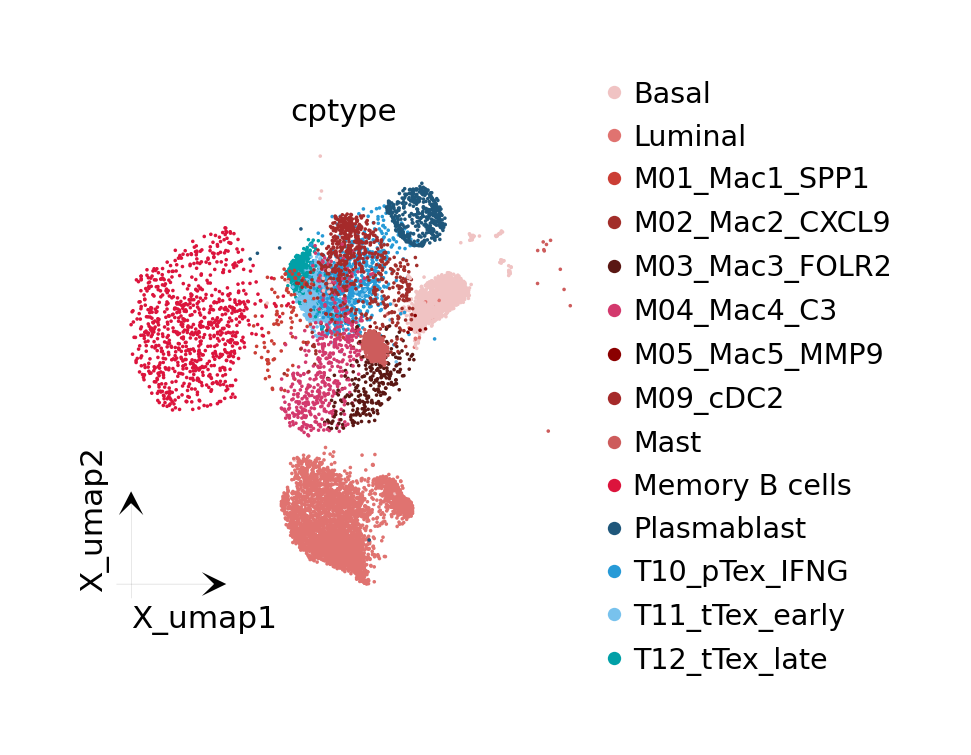

In [52]:
ov.pl.embedding(adata_after_filter,
               basis='X_umap',
               color='cptype',
               frameon='small',
               palette=ov.pl.red_color + ov.pl.blue_color)

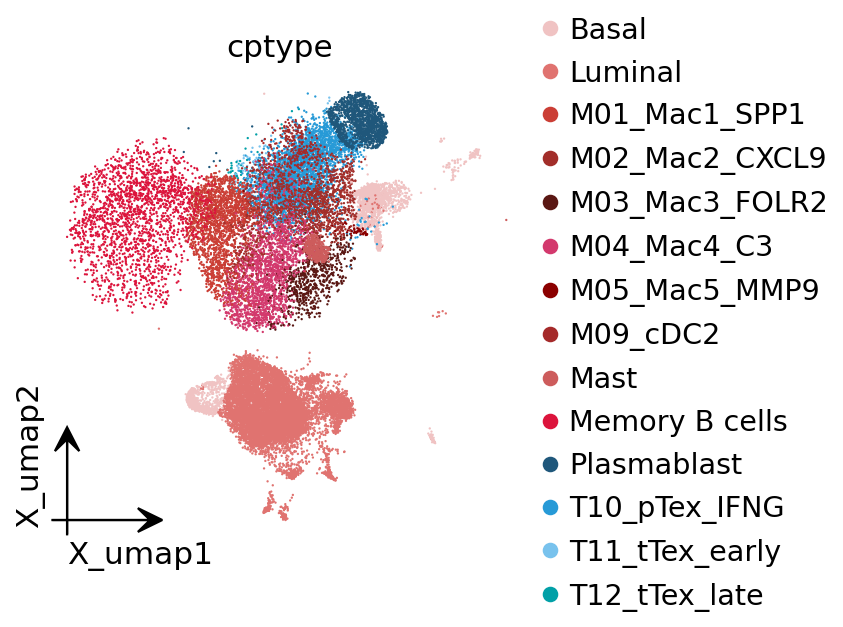

In [8]:
ov.pl.embedding(adata_before_filter,
               basis='X_umap',
               color='cptype',
               frameon='small',
               palette=ov.pl.red_color + ov.pl.blue_color)

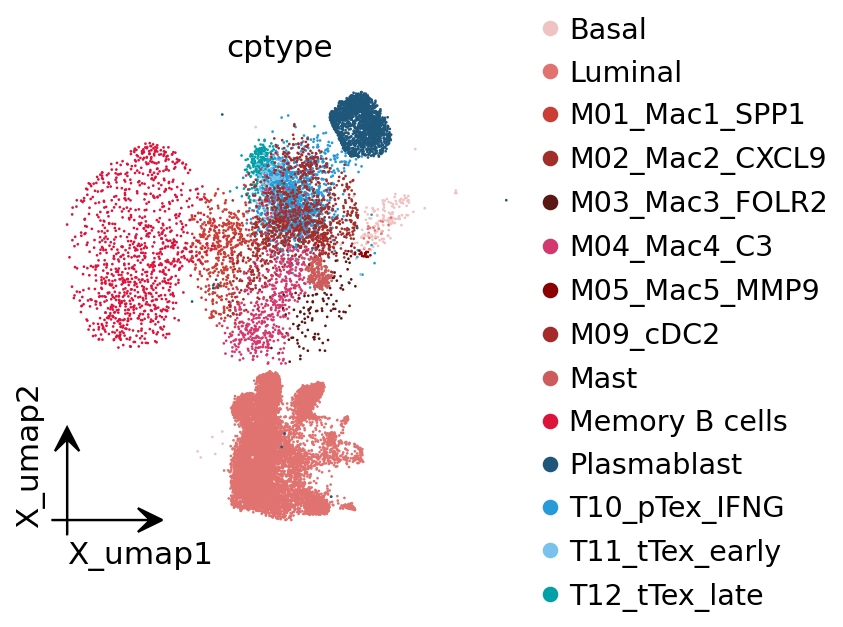

In [9]:
ov.pl.embedding(adata_wotreat_filter,
               basis='X_umap',
               color='cptype',
               frameon='small',
               palette=ov.pl.red_color + ov.pl.blue_color)

In [ ]:
cpdb_results_after, adata_cpdb_after = ov.single.run_cellphonedb_v5(
    adata_after_filter,            # AnnData对象
    cpdb_file_path='cellphonedb.zip',  # 必需参数
    celltype_key='cptype',          # 细胞类型注释列
    min_cell_fraction=0.005,             # 细胞比例阈值
    min_genes=200,                       # 最小基因数
    min_cells=3,                         # 最小细胞数
    iterations=1000,                     # 置换次数
    threshold=0.1,                       # 表达阈值
    pvalue=0.05,                         # P值阈值
    threads=10,                          # 线程数
    output_dir="cpdb_ov/after",                     # 输出目录
    cleanup_temp=True                    # 清理临时文件
)

In [ ]:
cpdb_results_before, adata_cpdb_before = ov.single.run_cellphonedb_v5(
    adata_before_filter,            # AnnData对象
    cpdb_file_path='cellphonedb.zip',  # 必需参数
    celltype_key='cptype',          # 细胞类型注释列
    min_cell_fraction=0.005,             # 细胞比例阈值
    min_genes=200,                       # 最小基因数
    min_cells=3,                         # 最小细胞数
    iterations=1000,                     # 置换次数
    threshold=0.1,                       # 表达阈值
    pvalue=0.05,                         # P值阈值
    threads=10,                          # 线程数
    output_dir="cpdb_ov/before",                     # 输出目录
    cleanup_temp=True                    # 清理临时文件
)

In [ ]:
cpdb_results_wotreat, adata_cpdb_wotreat = ov.single.run_cellphonedb_v5(
    adata_wotreat_filter,            # AnnData对象
    cpdb_file_path='cellphonedb.zip',  # 必需参数
    celltype_key='cptype',          # 细胞类型注释列
    min_cell_fraction=0.005,             # 细胞比例阈值
    min_genes=200,                       # 最小基因数
    min_cells=3,                         # 最小细胞数
    iterations=1000,                     # 置换次数
    threshold=0.1,                       # 表达阈值
    pvalue=0.05,                         # P值阈值
    threads=10,                          # 线程数
    output_dir="cpdb_ov/wotreat",                     # 输出目录
    cleanup_temp=True                    # 清理临时文件
)

In [ ]:
ov.utils.save(cpdb_results_after,'cpdb_ov/after/gex_cpdb_test.pkl')
adata_cpdb_after.write('cpdb_ov/after/gex_cpdb_ad.h5ad')

In [ ]:
ov.utils.save(cpdb_results_before,'cpdb_ov/before/gex_cpdb_test.pkl')
adata_cpdb_before.write('cpdb_ov/before/gex_cpdb_ad.h5ad')

In [ ]:
ov.utils.save(cpdb_results_wotreat,'cpdb_ov/wotreat/gex_cpdb_test.pkl')
adata_cpdb_wotreat.write('cpdb_ov/wotreat/gex_cpdb_ad.h5ad')

In [53]:
adata_cpdb_after = ov.read('cpdb_ov/after/gex_cpdb_ad.h5ad')
adata_cpdb_before = ov.read('cpdb_ov/before/gex_cpdb_ad.h5ad')
adata_cpdb_wotreat = ov.read('cpdb_ov/wotreat/gex_cpdb_ad.h5ad')

In [ ]:
color_dict=dict(zip(
    adata_after_filter.obs['cptype'].cat.categories,
    adata_after_filter.uns['cptype_colors']
))
viz = ov.pl.CellChatViz(adata_cpdb_after,palette=color_dict)
count_matrix, weight_matrix=viz.compute_aggregated_network(pvalue_threshold=0.05, use_means=True)
fig2, ax2 = viz.netVisual_circle(
    weight_matrix,
    title="Interaction weights/strength",
    cmap='Reds',
    vertex_size_max=10,
    figsize=(8, 8),
)
fig2.savefig("cpdb_ov/figures/After-Interaction weights.svg", bbox_inches='tight')

In [ ]:
color_dict=dict(zip(
    adata_before_filter.obs['cptype'].cat.categories,
    adata_before_filter.uns['cptype_colors']
))
viz = ov.pl.CellChatViz(adata_cpdb_before,palette=color_dict)
count_matrix, weight_matrix=viz.compute_aggregated_network(pvalue_threshold=0.05, use_means=True)
fig2, ax2 = viz.netVisual_circle(
    weight_matrix,
    title="Interaction weights/strength",
    cmap='Reds',
    vertex_size_max=10,
    figsize=(8, 8),
)
fig2.savefig("cpdb_ov/figures/Before-Interaction weights.svg", bbox_inches='tight')

In [ ]:
color_dict=dict(zip(
    adata_wotreat_filter.obs['cptype'].cat.categories,
    adata_wotreat_filter.uns['cptype_colors']
))
viz = ov.pl.CellChatViz(adata_cpdb_wotreat,palette=color_dict)
count_matrix, weight_matrix=viz.compute_aggregated_network(pvalue_threshold=0.05, use_means=True)
fig2, ax2 = viz.netVisual_circle(
    weight_matrix,
    title="Interaction weights/strength",
    cmap='Reds',
    vertex_size_max=10,
    figsize=(8, 8),
)
fig2.savefig("cpdb_ov/figures/WOTreat-Interaction weights.svg", bbox_inches='tight')

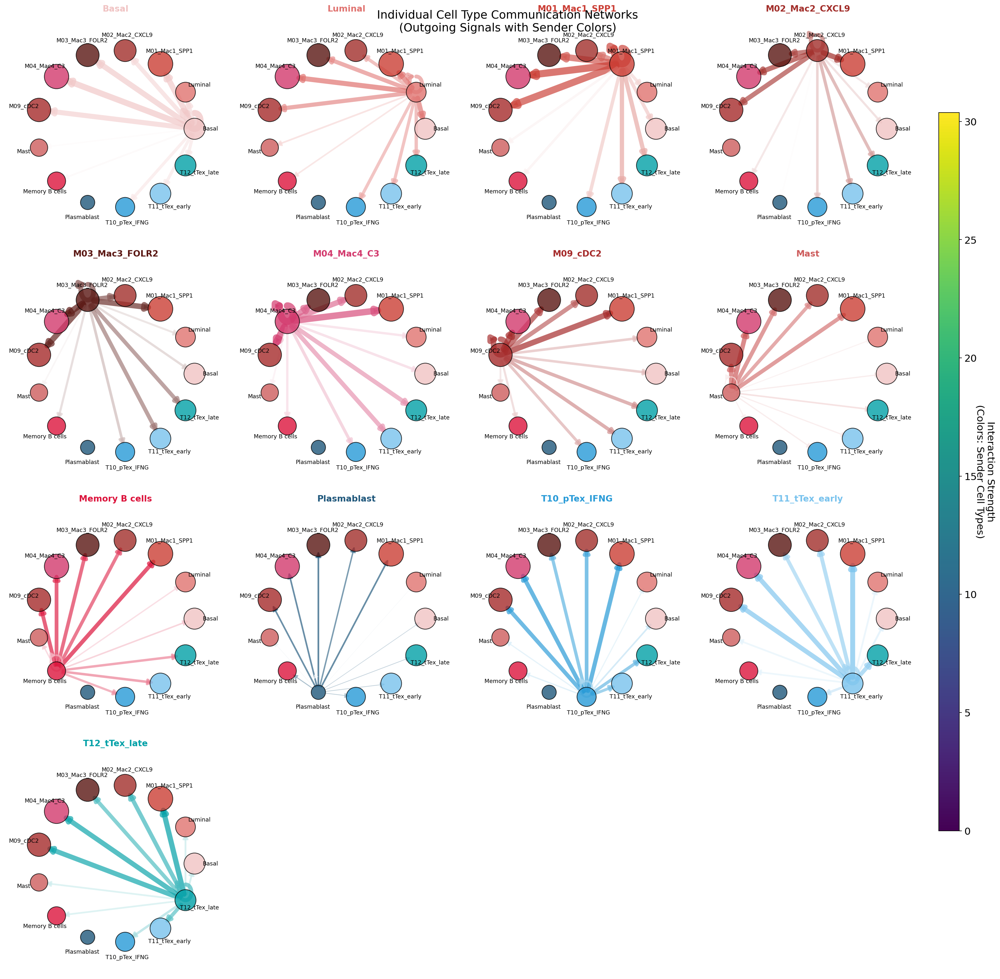

In [12]:
color_dict=dict(zip(
    adata_after_filter.obs['cptype'].cat.categories,
    adata_after_filter.uns['cptype_colors']
))
viz = ov.pl.CellChatViz(adata_cpdb_after,palette=color_dict)
# 绘制所有细胞类型的向外信号（类似CellChat功能）
fig = viz.netVisual_individual_circle(
    pvalue_threshold=0.05,
    vertex_size_max=10,
    edge_width_max=10,  # 保持一致以便比较
    show_labels=True,
    cmap='Blues',
    figsize=(20, 20),
    ncols=4,
    #vertex_size_max=10,
)
fig.savefig("cpdb_ov/figures/After-outcome.svg", bbox_inches='tight')

In [ ]:
# 绘制接收信号
fig = viz.netVisual_individual_circle_incoming(
    pvalue_threshold=0.05,
    cmap='Reds',
    figsize=(20, 20),
    ncols=4,
    vertex_size_max=10,
)
fig.savefig("cpdb_ov/figures/After-income.svg", bbox_inches='tight')

```
VEGFA对应通路 Signaling by Vascular endothelial growth factor 
EGFR对应通路 Signaling by Epidermal growth factor
TNFSF10 Signaling by Tumor necrosis factor
CXCL16 Signaling by Chemokines
```

In [59]:
color_dict=dict(zip(
    adata_after_filter.obs['cptype'].cat.categories,
    adata_after_filter.uns['cptype_colors']
))
viz = ov.pl.CellChatViz(adata_cpdb_after,palette=color_dict)
pathway_comm = viz.compute_pathway_communication(
  method='mean',           # 对通路内L-R对取平均
  min_lr_pairs=2,         # 通路至少包含2个L-R对
  min_expression=0.1      # 过滤低表达交互
)
# 方法2：基于通路强度判断显著通路
sig_pathways, summary = viz.get_significant_pathways_v2(
  pathway_comm,
  strength_threshold=0.5,    # 通路平均强度阈值
  pvalue_threshold=0.05,     # 个别L-R对的p-value阈值
  min_significant_pairs=1    # 至少1对细胞显著
)

🔬 Calculating cell communication strength for 149 pathways...
   - Aggregation method: mean
   - Minimum expression threshold: 0.1
✅ Completed pathway communication strength calculation for 142 pathways
📊 Pathway significance analysis results:
   - Total pathways: 142
   - Significant pathways: 23
   - Strength threshold: 0.5
   - p-value threshold: 0.05

🏆 Top 10 pathways by total strength:
----------------------------------------------------------------------------------------------------
Pathway                        Total    Max     Mean    L-R  Active Sig  Rate   Status
----------------------------------------------------------------------------------------------------
Signaling by Amyloid-beta pr   133.06   2.28    0.79    6    169    69   0.41   ***
Signaling by HLA               88.52    0.96    0.52    16   169    49   0.29   ***
Signaling by Chemokines        77.84    1.09    0.47    79   164    43   0.26   ***
Signaling by Plasminogen Act   75.69    1.11    0.48    3    159

In [60]:
pathways_show = [
    "Signaling by Vascular endothelial growth factor", # VEGFA
    "Signaling by Epidermal growth factor", # EGFR
    "Signaling by Tumor necrosis factor", # TNFSF10
    "Signaling by Chemokines" # CXCL16
    ]

✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: ['Signaling by Vascular endothelial growth factor']
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized to 0-1 range (Importance values)


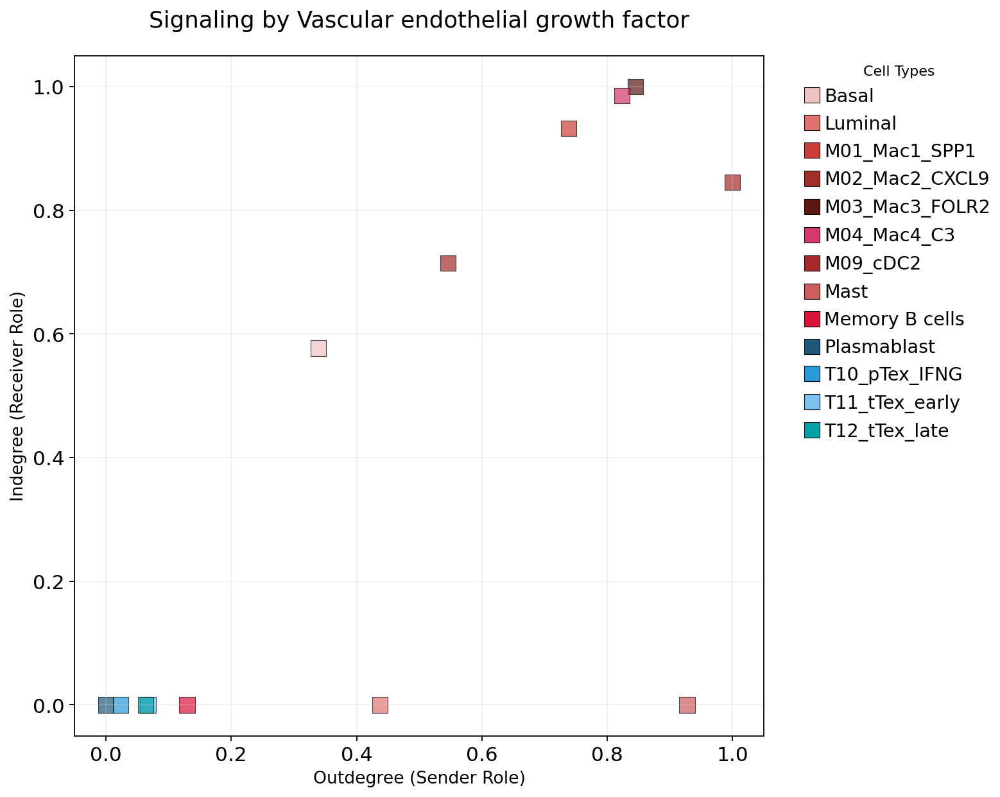

In [16]:
fig, ax = viz.netAnalysis_signalingRole_scatter(
    signaling=pathways_show[0],
    x_measure='outdegree',
    y_measure='indegree',
    marker='s',                 # 自定义形状
    point_size=120,
    title=pathways_show[0],
    legend_title="Cell Types",
    legend_loc='upper left',
    legend_bbox_to_anchor=(1.05, 1.0)  # 图例在右侧
)

fig.savefig("figures/cpdb/label1.svg", bbox_inches="tight")

In [ ]:
# 2. 绘制特定通路的圆形图
pathways_show = ["Signaling by Vascular endothelial growth factor"]  # 或者从上面获取的列表中选择
fig, ax = viz.netVisual_aggregate(
    signaling=pathways_show[0], 
    layout="circle",
    figsize=(8, 8),
    vertex_size_max=10,
)

In [146]:
fig, ax = viz.netVisual_chord_cell(
    signaling=pathways_show[0],
    group_celltype=None,
    count_min=1,
    figsize=(6,6),
    normalize_to_sender=True
)
ax.set_title(pathways_show[0])
fig.show()

In [152]:
h = viz.netVisual_heatmap_marsilea(
    signaling=pathways_show[3],      # 指定信号通路
    color_heatmap="Reds",        # CellChat的color.heatmap参数
    add_dendrogram=True,
    #title="CXCL Signaling Heatmap"
)
h.render()   # 这通常返回的是 matplotlib.figure.Figure
plt.savefig("figures/cpdb/After-CXCL16.svg", bbox_inches="tight")

In [ ]:
fig, ax = viz.netVisual_chord_cell(
    signaling=pathways_show[0],
    group_celltype=None,
    count_min=0,
    figsize=(5,5),
    sources=['Basal','T10_pTex_IFNG',],
    normalize_to_sender=True
)
ax.set_title(pathways_show[0])
fig.show()

In [58]:
#### 注意这里，需要使用到marsilea包，该包目前版本为0.5.1，如果使用0.5.5会报错，强制要求三个参数。omicverse只传入了size和color，0.5.5版本会强制要求edgecolor参数
pathways = [
    "Signaling by Vascular endothelial growth factor", # VEGFA
    "Signaling by Epidermal growth factor", # EGFR
    "Signaling by Tumor necrosis factor", # TNFSF10
    "Signaling by Chemokines" # CXCL16
    ]

enriched_lr = viz.extractEnrichedLR(pathways)
print(f"Find {len(enriched_lr)} sig L-R")

for pathway in pathways:
  contribution_df, fig, axes = viz.netAnalysis_contribution(pathway)
  print(f"{pathway} most important L-R pair: {contribution_df.iloc[0]['ligand_receptor']}")
  fig.savefig(f"figures/cpdb/After-{pathway.replace(' ', '_')}_contribution.svg", format="svg")


viz.netVisual_bubble_marsilea(sources_use=None, targets_use=None, 
                                 signaling=pathways, pvalue_threshold=1, 
                                 mean_threshold=0.1, top_interactions=20,
                                 show_pvalue=False, show_mean=False, show_count=True,
                                 add_violin=False, add_dendrogram=True,
                                 group_pathways=True, figsize=(2, 8),
                                 font_size=10,
                                 title=pathways_show[0], 
                                 remove_isolate=False
                                 )

NameError: name 'viz' is not defined

In [ ]:
fig, ax = viz.netVisual_chord_LR(
    ligand_receptor_pairs='TGFB1_TGFbeta_receptor1',
    #group_celltype=None,
    count_min=0,
    figsize=(8,8),
    sources=['T10_pTex_IFNG','Basal'],
    rotate_names=True
    
    #normalize_to_sender=True
)
fig.show()

In [ ]:
viz.netVisual_bubble_marsilea(sources_use=None,
                                 signaling=['Signaling by Transforming growth factor'], pvalue_threshold=0.01, 
                              #show_mean=False,
                                 mean_threshold=0.1, top_interactions=200,cmap='RdBu_r',
                                 show_pvalue=False, show_mean=False, show_count=True,
                                 #add_violin=True, 
                                 add_dendrogram=False,font_size=10,
                                 group_pathways=False, figsize=(14, 2),transpose=True,
                                 title="Signaling by Transforming growth factor", 
                                 remove_isolate=False)

In [164]:
h = viz.netVisual_bubble_marsilea(sources_use=['T10_pTex_IFNG', 'T11_tTex_early', 'T12_tTex_late'], 
                                 signaling= pathways_show, pvalue_threshold=0.01, 
                              #show_mean=False,
                                 mean_threshold=0.1, top_interactions=200,cmap='RdBu_r',
                                 show_pvalue=False, show_mean=False, show_count=True,
                                 #add_violin=True, 
                                 add_dendrogram=False,font_size=10,
                                 group_pathways=True, figsize=(14, 2),transpose=True,
                                 title="Cell-Cell Communication Analysis", 
                                 remove_isolate=False)
plt.savefig("figures/cpdb/After-Cell-Cell Communication Analysis.svg", bbox_inches="tight")
                                 

📊 Visualization statistics:
   - Number of significant interactions: 200
   - Number of cell type pairs: 4
   - Signaling pathways: 37
   - Data scaling: None (raw expression values)
   - Color bars: sender


In [ ]:
viz.netVisual_chord_gene(sources_use=['T10_pTex_IFNG', 'T11_tTex_early', 'T12_tTex_late'], targets_use=None, 
                     signaling=['Signaling by Transforming growth factor'],
                            pvalue_threshold=0.001, mean_threshold=4,
                            gap=0.03, use_gradient=True, sort="size", 
                            directed=True, chord_colors=None,
                            rotate_names=True, fontcolor="black", fontsize=10,
                            start_at=0, extent=360, min_chord_width=0,
                            ax=None, figsize=(4, 4), show_celltype_in_name=False,
                            title_name=None, save=None)

✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: All pathways
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized to 0-1 range (Importance values)
📊 信号角色分析结果（Marsilea可视化，Importance值 0-1）:
   - Dominant Sender: M01_Mac1_SPP1 (Importance: 1.000)
   - Dominant Receiver: M04_Mac4_C3 (Importance: 1.000)
   - Mediator: Plasmablast (Importance: 1.000)
   - Influencer: M01_Mac1_SPP1 (Importance: 1.000)


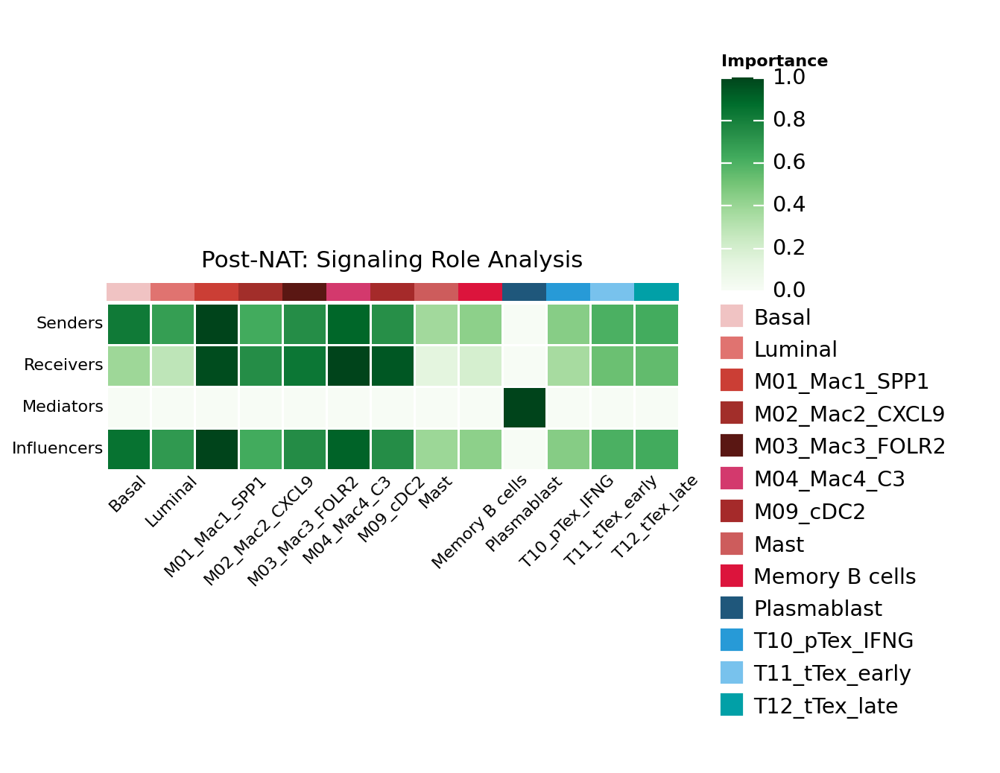

In [26]:
# 信号角色分析
centrality_scores = viz.netAnalysis_computeCentrality()
h = viz.netAnalysis_signalingRole_network_marsilea(signaling=None, measures=None,
                                                  color_heatmap="Greens", 
                                                  width=8, height=2, font_size=10,
                                                  title="Post-NAT: Signaling Role Analysis",
                                                  add_dendrogram=False, add_cell_colors=True,
                                                  add_importance_bars=False, show_values=False,
                                                  save=None)
plt.savefig("cpdb_ov/figures/After-Signaling-Role.svg", bbox_inches="tight")

✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: ['Signaling by Vascular endothelial growth factor']
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized to 0-1 range (Importance values)


Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: ['Signaling by Epidermal growth factor']
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized to 0-1 range (Importance values)
8 [0.09762701 0.43037873]
9 [0.20552675 0.08976637]
✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: ['Signaling by Tumor necrosis factor']
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized to 0-1 range (Importance values)
✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: ['Signaling by Chemokines']
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized 

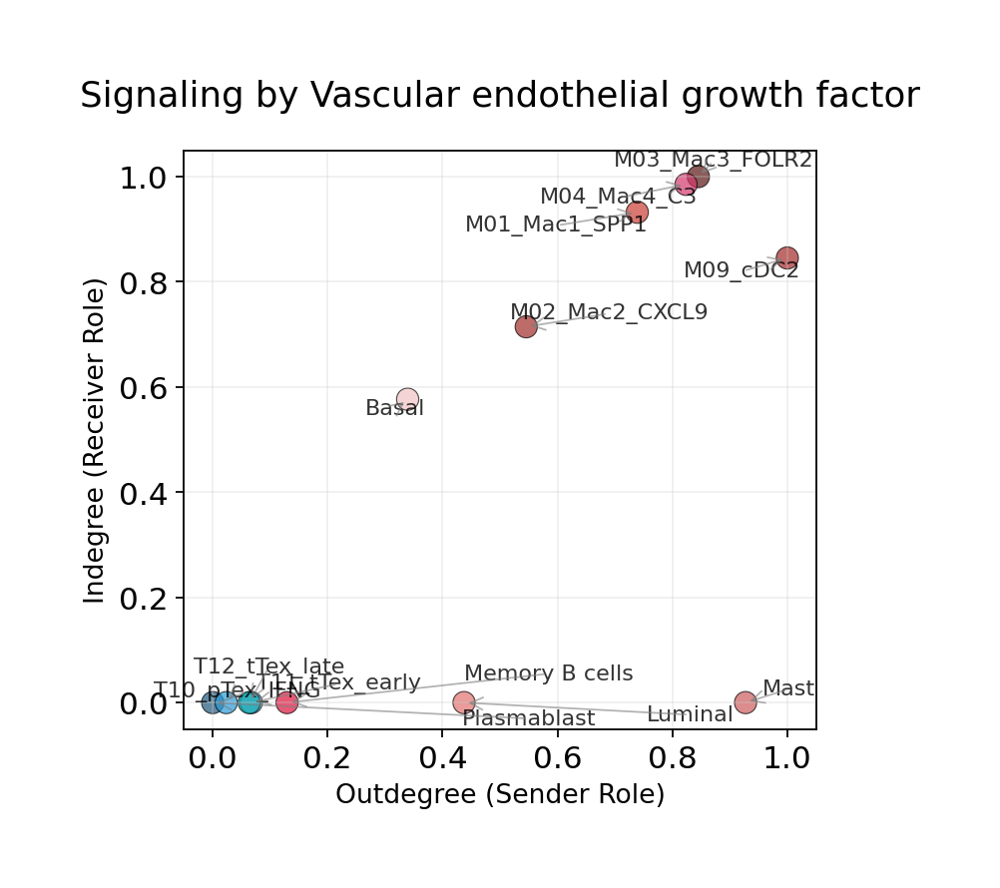

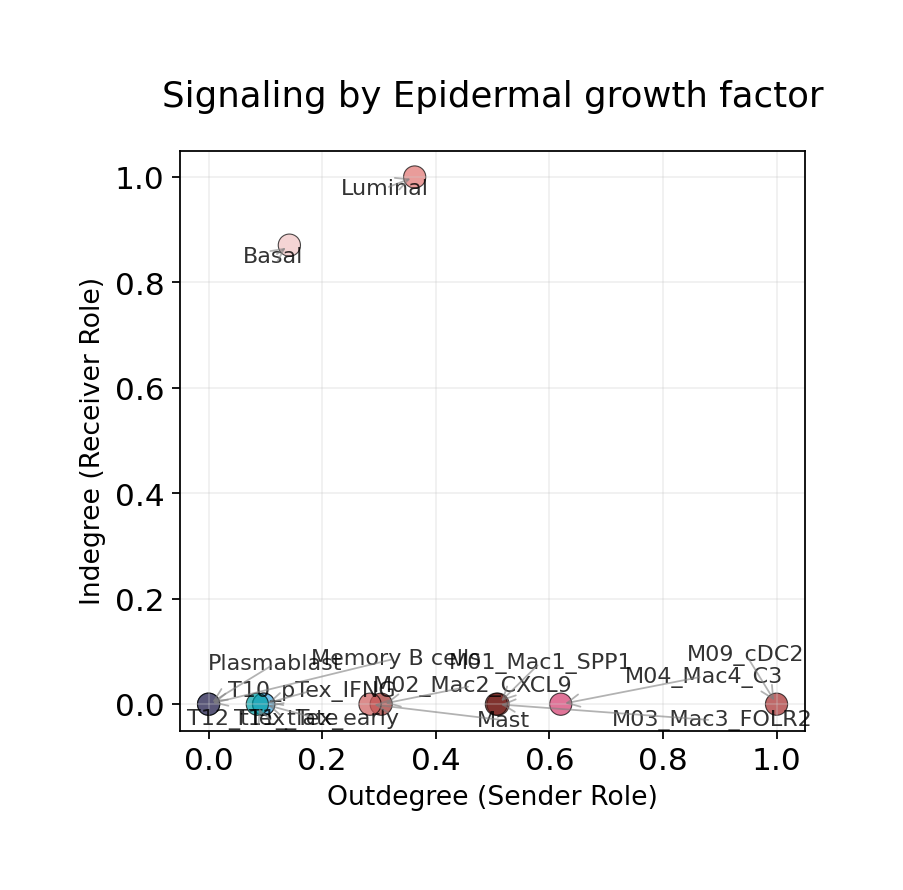

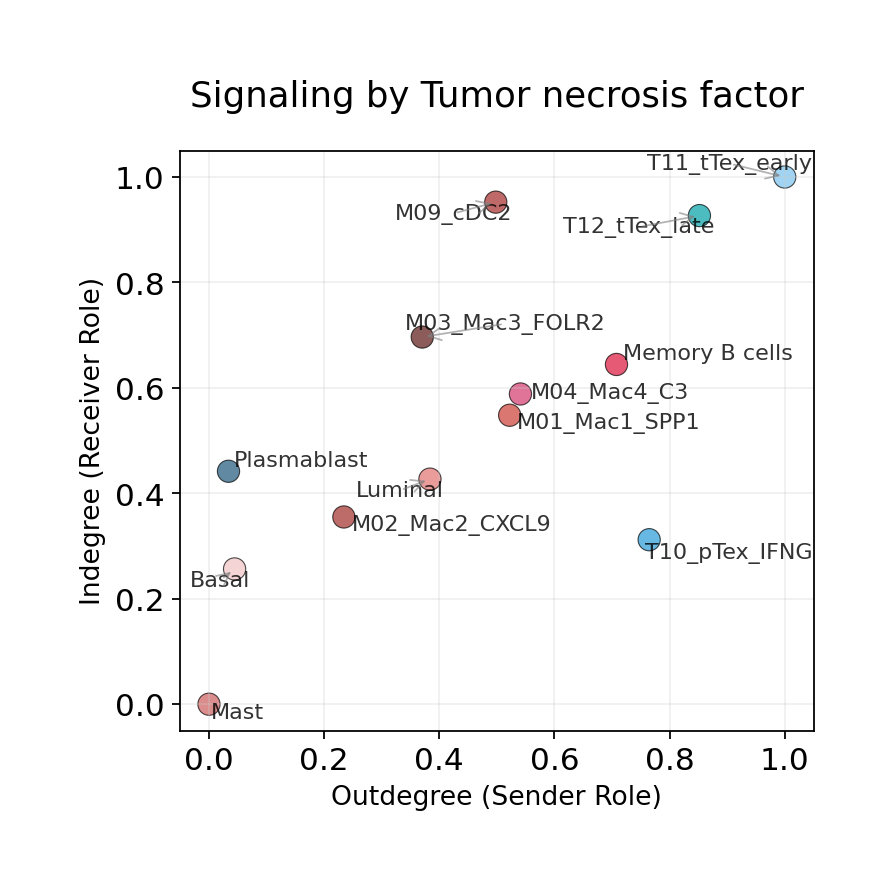

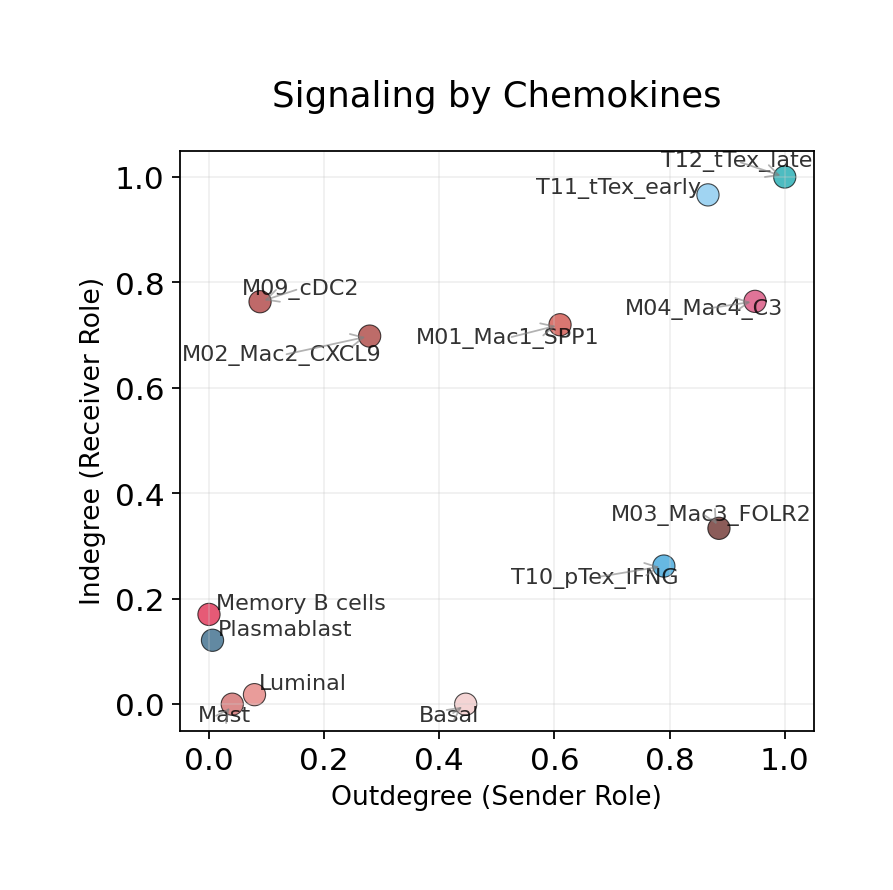

In [61]:
for pathway in pathways_show:
    fig3, ax3 = viz.netAnalysis_signalingRole_scatter(
    signaling= pathway,
    x_measure='outdegree',
    y_measure='indegree',
    title= pathway,
    figsize=(5,5),
    marker = 'o'
    )
    fig3.savefig(f"figures/cpdb/After-{pathway.replace(' ', '_')}_degree.svg", format="svg")


In [ ]:
res=viz.netAnalysis_signalingRole_heatmap(pattern="outgoing", signaling=None, 
                                        row_scale=False, figsize=(6, 6), 
                                        cmap='Greens', show_totals=True,
                                        title=None, save=None)

📊 Heatmap statistics:
   - Number of pathways: 2
   - Number of cell types: 13
   - Signal strength range: 0.171 - 0.612


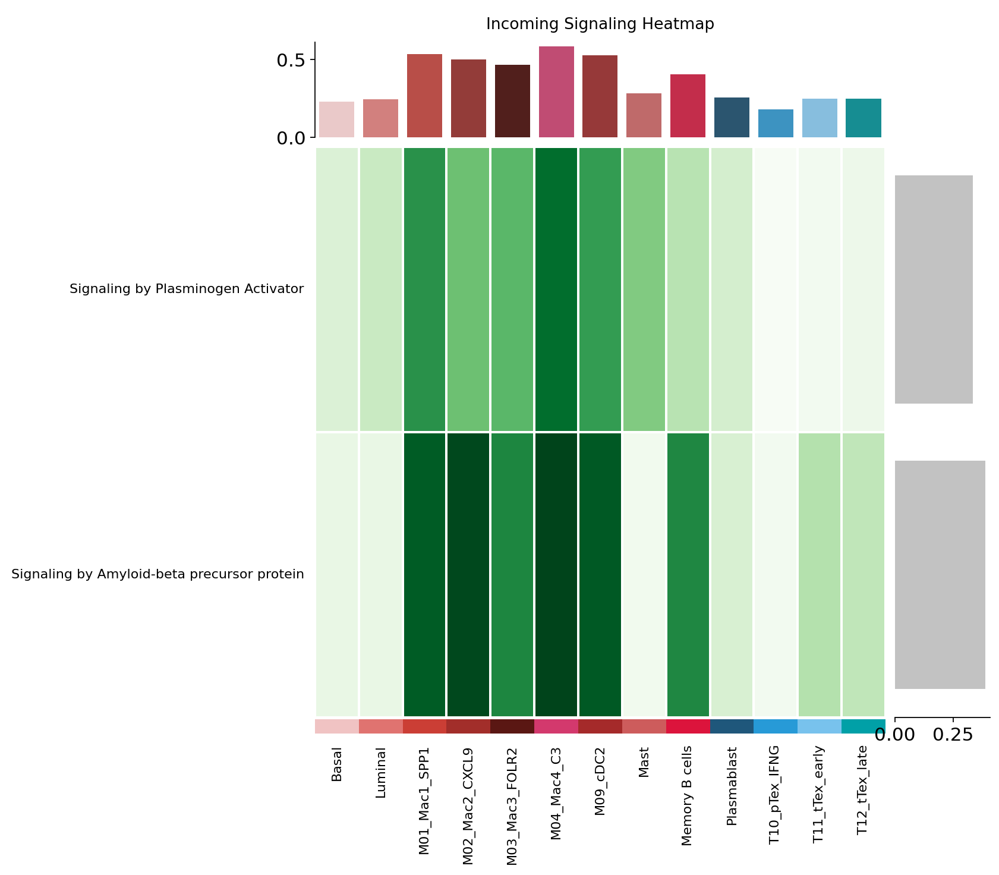

In [16]:
res=viz.netAnalysis_signalingRole_heatmap(pattern="incoming", signaling=None, 
                                        row_scale=False, figsize=(6, 6), 
                                        cmap='Greens', show_totals=True,
                                        title=None, save=None)

📊 Heatmap statistics:
   - Number of pathways: 4
   - Number of cell types: 13
   - Signal strength range: 0.029 - 0.134


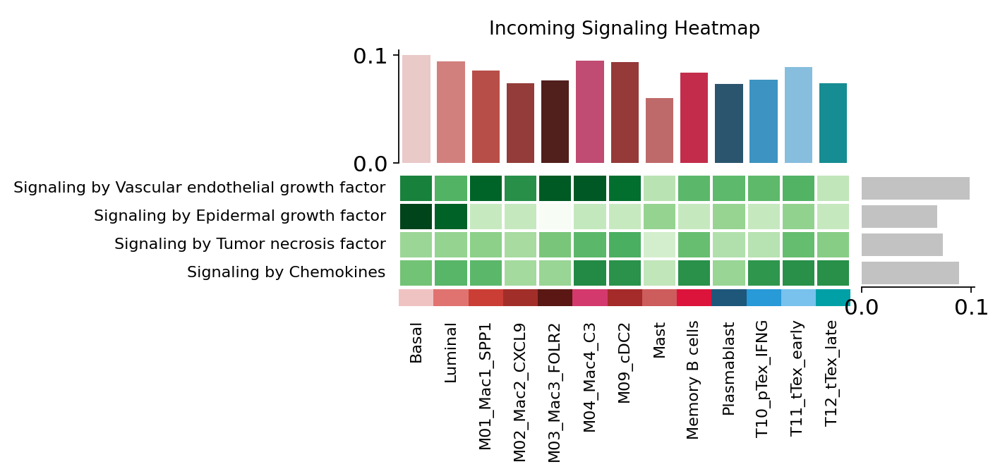

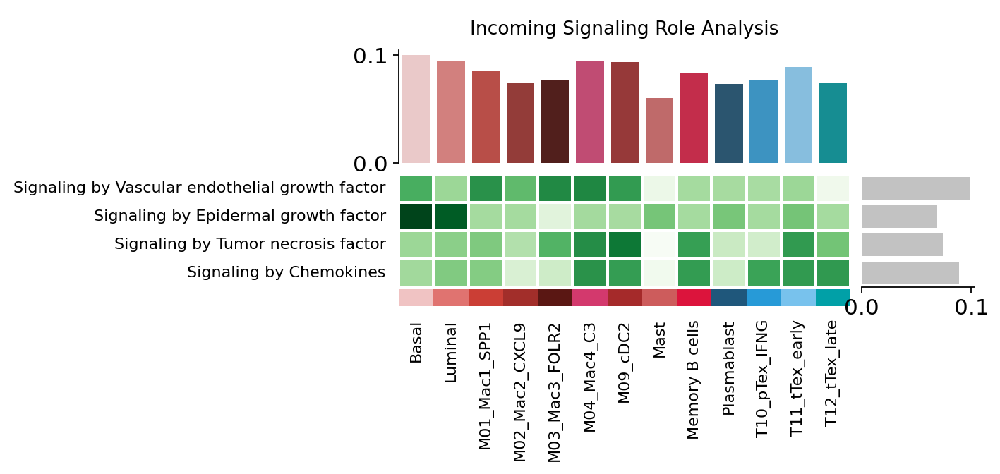

In [19]:
res=viz.netAnalysis_signalingRole_heatmap(pattern="incoming", 
                                          signaling=pathways_show, 
                                        row_scale=True, figsize=(4, 1), 
                                        min_threshold=0,
                                        cmap='Greens', show_totals=True,
                                        title=None, save=None)
plt.savefig("figures/cpdb/After-Signaling-income.svg", bbox_inches="tight")

📊 Heatmap statistics:
   - Number of pathways: 4
   - Number of cell types: 13
   - Signal strength range: 0.019 - 0.198


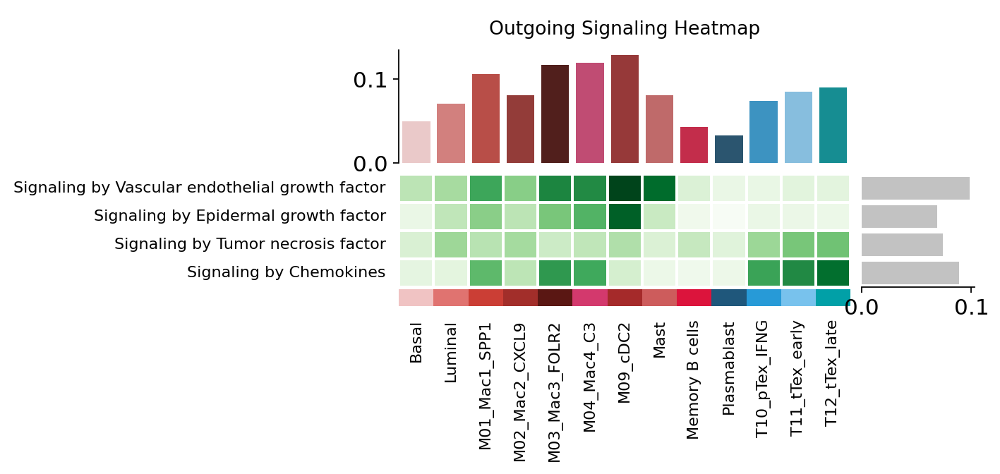

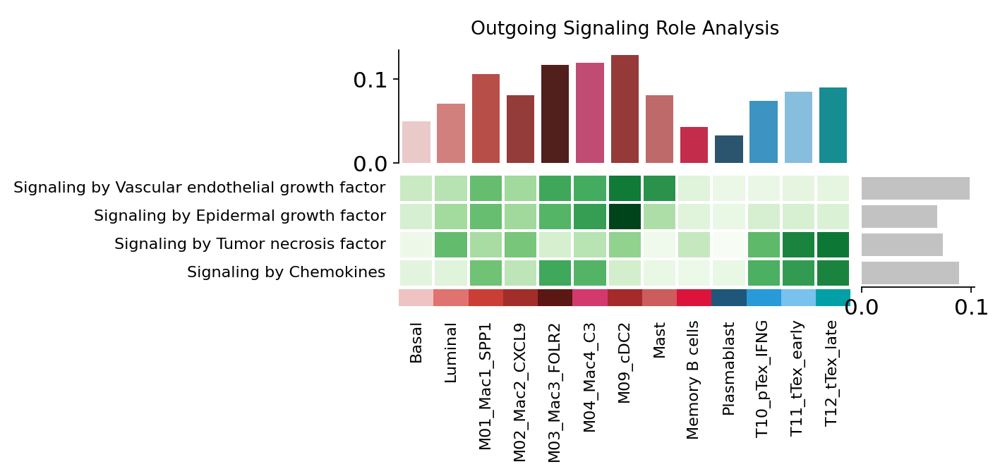

In [20]:
res=viz.netAnalysis_signalingRole_heatmap(pattern="outgoing", 
                                          signaling=pathways_show, 
                                        row_scale=True, figsize=(4, 1), 
                                        min_threshold=0,
                                        cmap='Greens', show_totals=True,
                                        title=None, save=None)
plt.savefig("figures/cpdb/After-Signaling-outgoing.svg", bbox_inches="tight")

#### Before

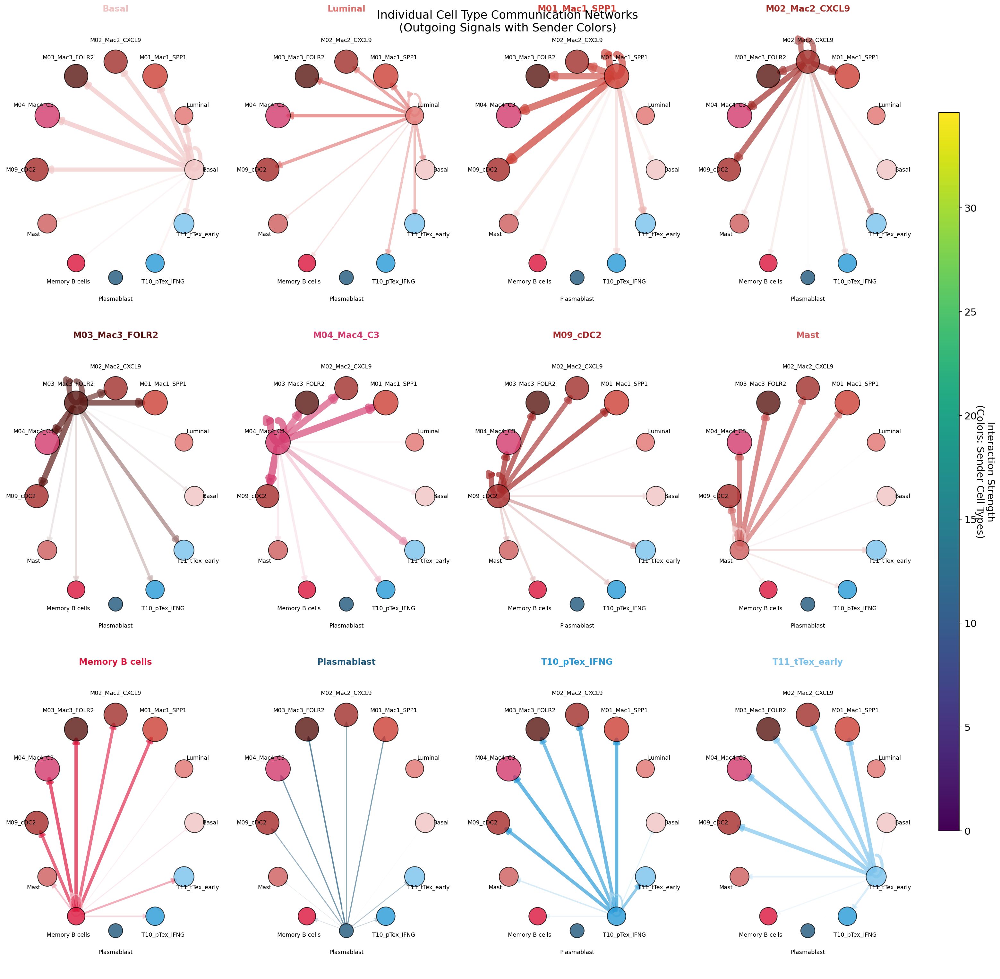

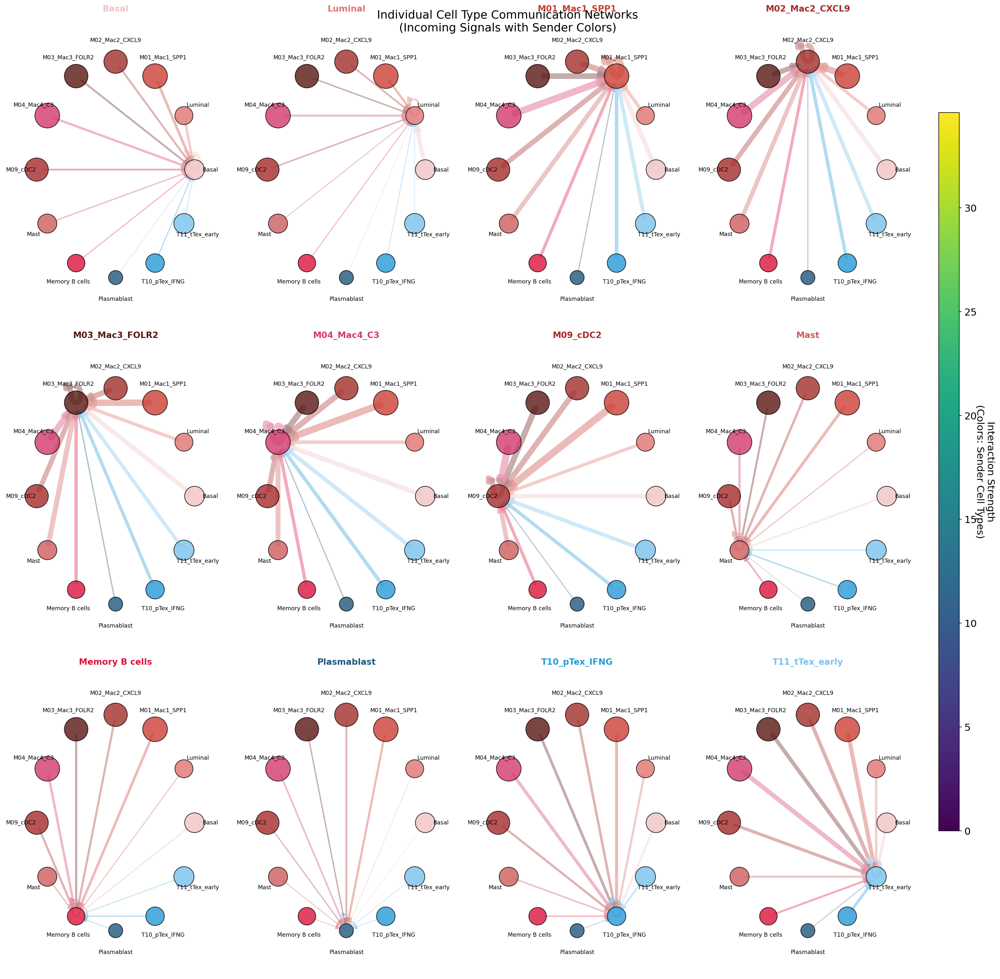

In [27]:
# 绘制接收信号
color_dict=dict(zip(
    adata_before_filter.obs['cptype'].cat.categories,
    adata_before_filter.uns['cptype_colors']
))
viz = ov.pl.CellChatViz(adata_cpdb_before,palette=color_dict)
# 绘制所有细胞类型的向外信号（类似CellChat功能）
fig = viz.netVisual_individual_circle(
    pvalue_threshold=0.05,
    vertex_size_max=10,
    edge_width_max=10,  # 保持一致以便比较
    show_labels=True,
    cmap='Blues',
    figsize=(20, 20),
    ncols=4,
    #vertex_size_max=10,
)
fig.savefig("cpdb_ov/figures/Before-outcome.svg", bbox_inches='tight')
fig = viz.netVisual_individual_circle_incoming(
    pvalue_threshold=0.05,
    cmap='Reds',
    figsize=(20, 20),
    ncols=4,
    vertex_size_max=10,
)
fig.savefig("cpdb_ov/figures/Before-income.svg", bbox_inches='tight')

📊 Heatmap statistics:
   - Number of pathways: 4
   - Number of cell types: 12
   - Signal strength range: 0.010 - 0.160
📊 Heatmap statistics:
   - Number of pathways: 4
   - Number of cell types: 12
   - Signal strength range: 0.012 - 0.162


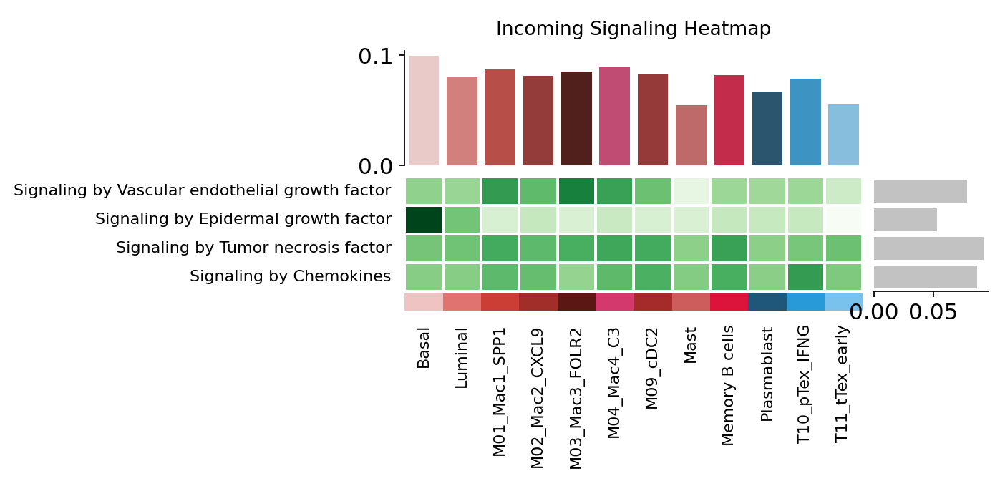

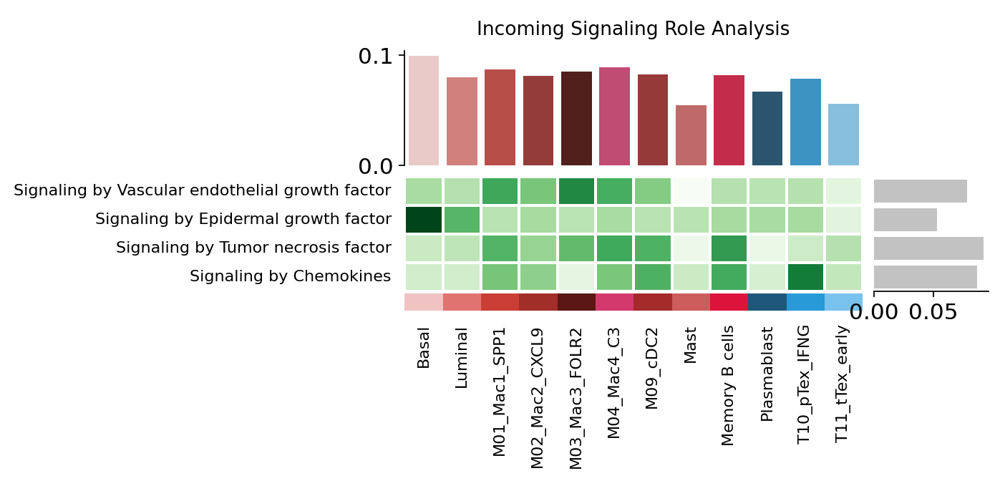

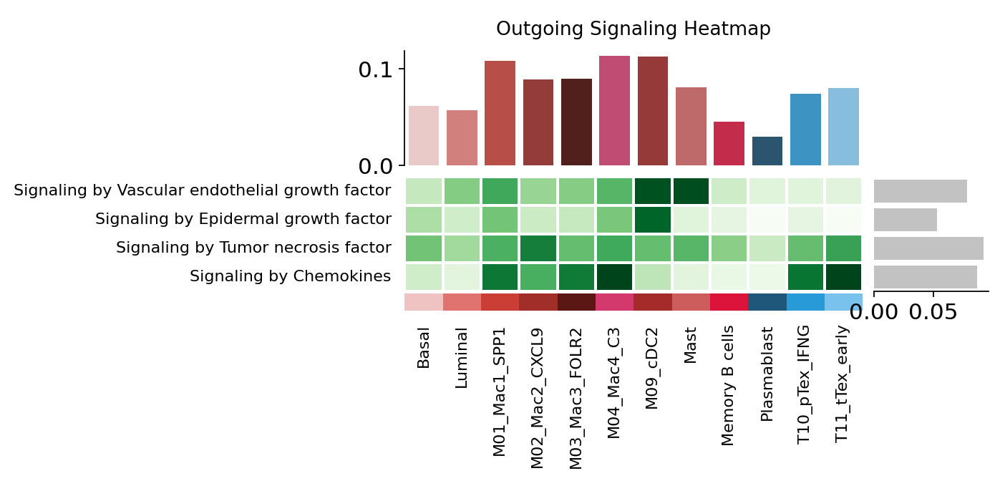

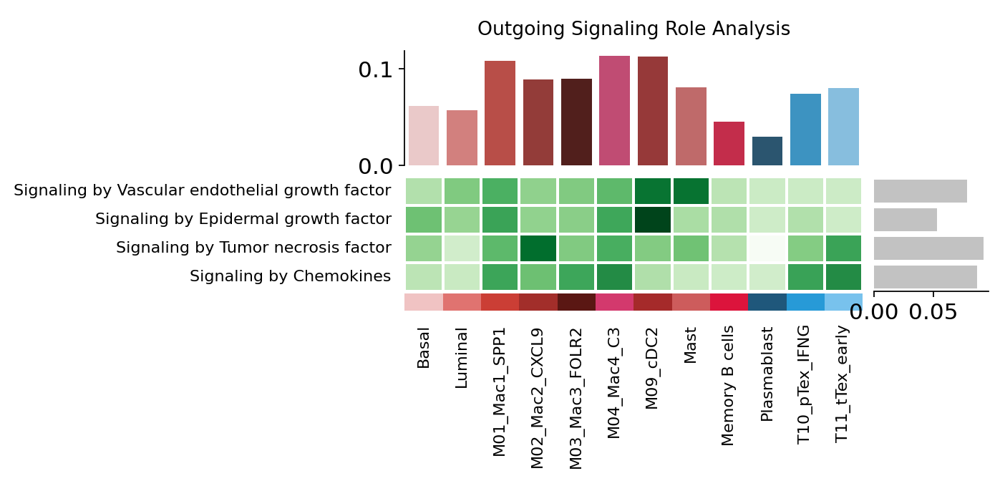

In [22]:
res=viz.netAnalysis_signalingRole_heatmap(pattern="incoming", 
                                          signaling=pathways_show, 
                                        row_scale=True, figsize=(4, 1), 
                                        min_threshold=0,
                                        cmap='Greens', show_totals=True,
                                        title=None, save=None)
plt.savefig("figures/cpdb/Before-Signaling-income.svg", bbox_inches="tight")
res=viz.netAnalysis_signalingRole_heatmap(pattern="outgoing", 
                                          signaling=pathways_show, 
                                        row_scale=True, figsize=(4, 1), 
                                        min_threshold=0,
                                        cmap='Greens', show_totals=True,
                                        title=None, save=None)
plt.savefig("figures/cpdb/Before-Signaling-outgoing.svg", bbox_inches="tight")

In [17]:
pathway_comm = viz.compute_pathway_communication(
  method='mean',           # 对通路内L-R对取平均
  min_lr_pairs=2,         # 通路至少包含2个L-R对
  min_expression=0.1      # 过滤低表达交互
)
# 方法2：基于通路强度判断显著通路
sig_pathways, summary = viz.get_significant_pathways_v2(
  pathway_comm,
  strength_threshold=0.5,    # 通路平均强度阈值
  pvalue_threshold=0.05,     # 个别L-R对的p-value阈值
  min_significant_pairs=1    # 至少1对细胞显著
)
sig_pathways

🔬 Calculating cell communication strength for 152 pathways...
   - Aggregation method: mean
   - Minimum expression threshold: 0.1
✅ Completed pathway communication strength calculation for 147 pathways
📊 Pathway significance analysis results:
   - Total pathways: 147
   - Significant pathways: 15
   - Strength threshold: 0.5
   - p-value threshold: 0.05

🏆 Top 10 pathways by total strength:
----------------------------------------------------------------------------------------------------
Pathway                        Total    Max     Mean    L-R  Active Sig  Rate   Status
----------------------------------------------------------------------------------------------------
Signaling by Amyloid-beta pr   87.80    1.99    0.61    6    144    47   0.33   ***
Signaling by HLA               86.77    0.93    0.60    16   144    58   0.40   ***
Signaling by Prosaposin        81.06    1.44    0.68    2    120    0    0.00      
Signaling by Apolipoprotein    74.42    1.63    0.61    7    122

['Adhesion by Fibronectin',
 'Signaling by Semaphorin',
 'Adhesion by Desmosome',
 'Adhesion by Osteopontin',
 'Signaling by Plasminogen Activator',
 'Signaling by Amyloid-beta precursor protein',
 'Signaling by Annexin',
 'Signaling by Chemokines',
 'Signaling by Lipoxin/Leukotriene',
 'Signaling by Apolipoprotein',
 'Signaling by Histamine',
 'Signaling by Colony-Stimulating factor',
 'Signaling by Galectin',
 'Signaling by HLA',
 'Signaling by Interferon']

In [ ]:
# 2. 绘制特定通路的圆形图
pathways_show = ["Signaling by Transforming growth factor"]  # 或者从上面获取的列表中选择
fig, ax = viz.netVisual_aggregate(
    signaling=pathways_show, 
    layout="circle",
    figsize=(8, 8),
    vertex_size_max=10,
)

In [ ]:
fig, ax = viz.netVisual_chord_cell(
    signaling=pathways_show[0],
    group_celltype=None,
    count_min=1,
    figsize=(6,6),
    normalize_to_sender=True
)
ax.set_title(pathways_show[0])
fig.show()

In [173]:
h = viz.netVisual_heatmap_marsilea(
    signaling=pathways_show[3],      # 指定信号通路
    color_heatmap="Reds",        # CellChat的color.heatmap参数
    add_dendrogram=True,
    #title="CXCL Signaling Heatmap"
)
h.render()   # 这通常返回的是 matplotlib.figure.Figure
import matplotlib.pyplot as plt
plt.savefig("figures/cpdb/Before-CXCL16.svg", bbox_inches="tight")

In [174]:
#### 注意这里，需要使用到marsilea包，该包目前版本为0.5.1，如果使用0.5.5会报错，强制要求三个参数。omicverse只传入了size和color，0.5.5版本会强制要求edgecolor参数
pathways = [
    "Signaling by Vascular endothelial growth factor", # VEGFA
    "Signaling by Epidermal growth factor", # EGFR
    "Signaling by Tumor necrosis factor", # TNFSF10
    "Signaling by Chemokines" # CXCL16
    ]

enriched_lr = viz.extractEnrichedLR(pathways)
print(f"Find {len(enriched_lr)} sig L-R")

for pathway in pathways:
  contribution_df, fig, axes = viz.netAnalysis_contribution(pathway)
  print(f"{pathway} most important L-R pair: {contribution_df.iloc[0]['ligand_receptor']}")
  fig.savefig(f"figures/cpdb/Before-{pathway.replace(' ', '_')}_contribution.svg", format="svg")


viz.netVisual_bubble_marsilea(sources_use=None, targets_use=None, 
                                 signaling=pathways, pvalue_threshold=1, 
                                 mean_threshold=0.1, top_interactions=20,
                                 show_pvalue=False, show_mean=False, show_count=True,
                                 add_violin=False, add_dendrogram=True,
                                 group_pathways=True, figsize=(2, 8),
                                 font_size=10,
                                 title=pathways_show[0], 
                                 remove_isolate=False
                                 )

✅ Found 53 enriched L-R pairs in pathway(s): Signaling by Vascular endothelial growth factor, Signaling by Epidermal growth factor, Signaling by Tumor necrosis factor, Signaling by Chemokines
Find 53 sig L-R
Signaling by Vascular endothelial growth factor most important L-R pair: VEGFB_NRP1
Signaling by Epidermal growth factor most important L-R pair: AREG_EGFR
Signaling by Tumor necrosis factor most important L-R pair: TNF_TNFRSF1B
Signaling by Chemokines most important L-R pair: CCL4_CCR5
⚠️  Warning: All p-values are identical. Adding slight jitter for better visualization.
⚠️  Warning: All p-values are identical after jittering. Using medium size.
📊 Visualization statistics:
   - Number of significant interactions: 20
   - Number of cell type pairs: 15
   - Signaling pathways: 1
   - Data scaling: None (raw expression values)
   - Color bars: sender


In [ ]:
viz.netVisual_bubble_marsilea(sources_use=None,
                                 signaling=['Signaling by Transforming growth factor'], pvalue_threshold=0.01, 
                              #show_mean=False,
                                 mean_threshold=0.1, top_interactions=200,cmap='RdBu_r',
                                 show_pvalue=False, show_mean=False, show_count=True,
                                 #add_violin=True, 
                                 add_dendrogram=False,font_size=10,
                                 group_pathways=False, figsize=(14, 2),transpose=True,
                                 title="Signaling by Transforming growth factor", 
                                 remove_isolate=False)

✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: All pathways
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized to 0-1 range (Importance values)
📊 信号角色分析结果（Marsilea可视化，Importance值 0-1）:
   - Dominant Sender: M01_Mac1_SPP1 (Importance: 1.000)
   - Dominant Receiver: M04_Mac4_C3 (Importance: 1.000)
   - Mediator: Plasmablast (Importance: 1.000)
   - Influencer: M01_Mac1_SPP1 (Importance: 1.000)


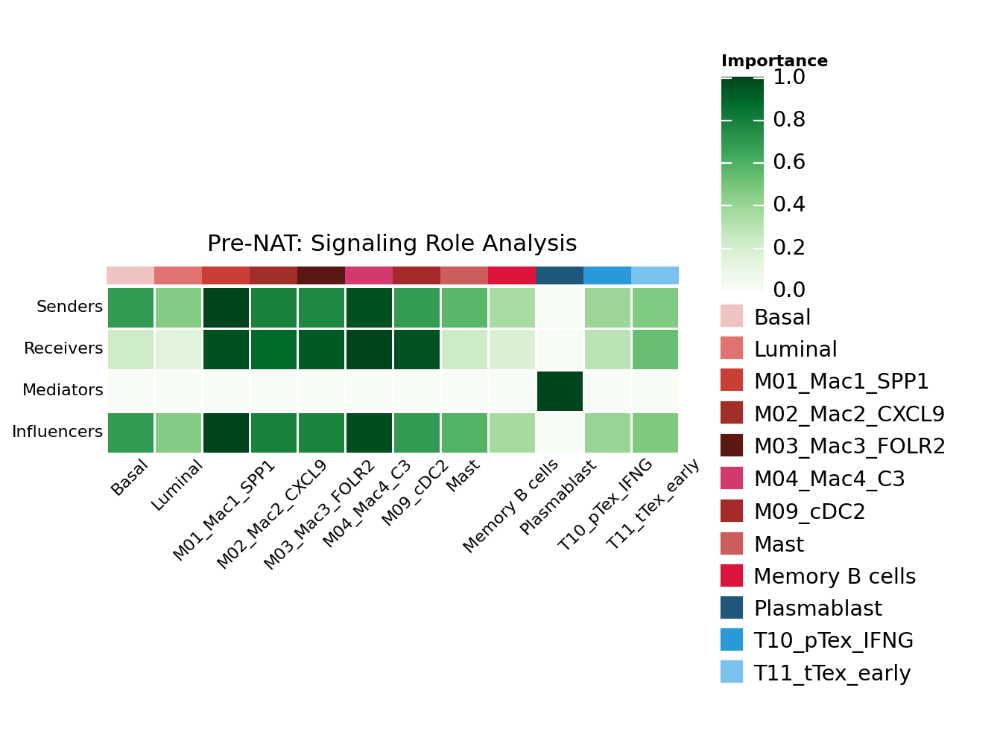

In [28]:
# 信号角色分析
centrality_scores = viz.netAnalysis_computeCentrality()
h = viz.netAnalysis_signalingRole_network_marsilea(signaling=None, measures=None,
                                                  color_heatmap="Greens", 
                                                  width=8, height=2, font_size=10,
                                                  title="Pre-NAT: Signaling Role Analysis",
                                                  add_dendrogram=False, add_cell_colors=True,
                                                  add_importance_bars=False, show_values=False,
                                                  save=None)
plt.savefig("cpdb_ov/figures/Before-Signaling-Role.svg", bbox_inches="tight")

In [176]:
h = viz.netVisual_bubble_marsilea(sources_use=['T10_pTex_IFNG', 'T11_tTex_early'], 
                                 signaling= pathways_show, pvalue_threshold=0.01, 
                              #show_mean=False,
                                 mean_threshold=0.1, top_interactions=200,cmap='RdBu_r',
                                 show_pvalue=False, show_mean=False, show_count=True,
                                 #add_violin=True, 
                                 add_dendrogram=False,font_size=10,
                                 group_pathways=True, figsize=(14, 2),transpose=True,
                                 title="Cell-Cell Communication Analysis", 
                                 remove_isolate=False)
plt.savefig("figures/cpdb/Before-Cell-Cell Communication Analysis.svg", bbox_inches="tight")
                                 

📊 Visualization statistics:
   - Number of significant interactions: 139
   - Number of cell type pairs: 4
   - Signaling pathways: 24
   - Data scaling: None (raw expression values)
   - Color bars: sender


✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: ['Signaling by Vascular endothelial growth factor']
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized to 0-1 range (Importance values)
✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: ['Signaling by Epidermal growth factor']
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized to 0-1 range (Importance values)
✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: ['Signaling by Tumor necrosis factor']
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized to 0-1 range (Importance val

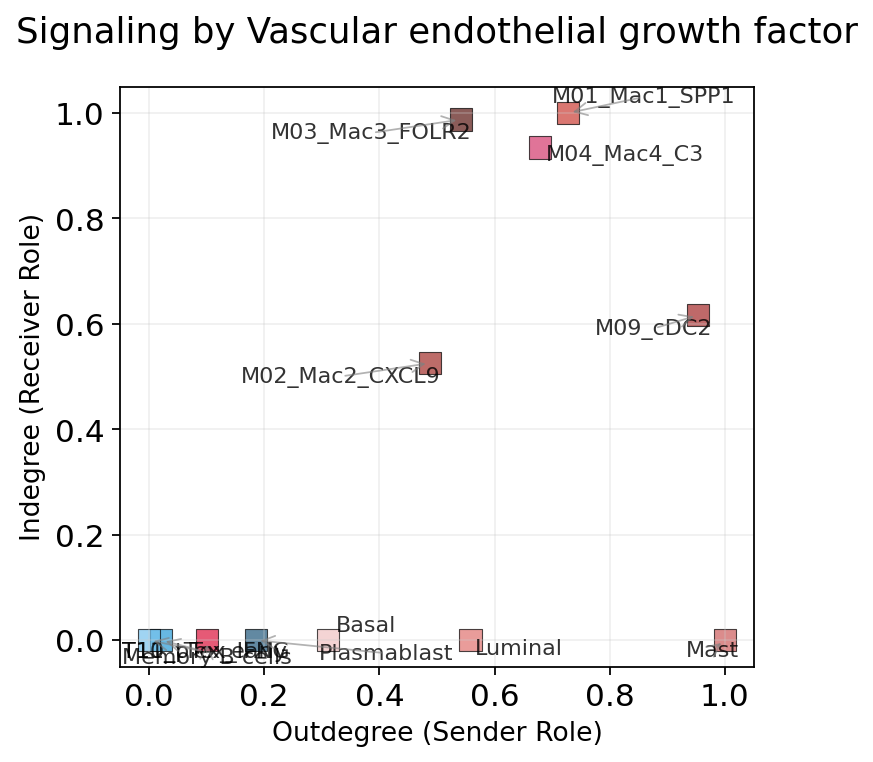

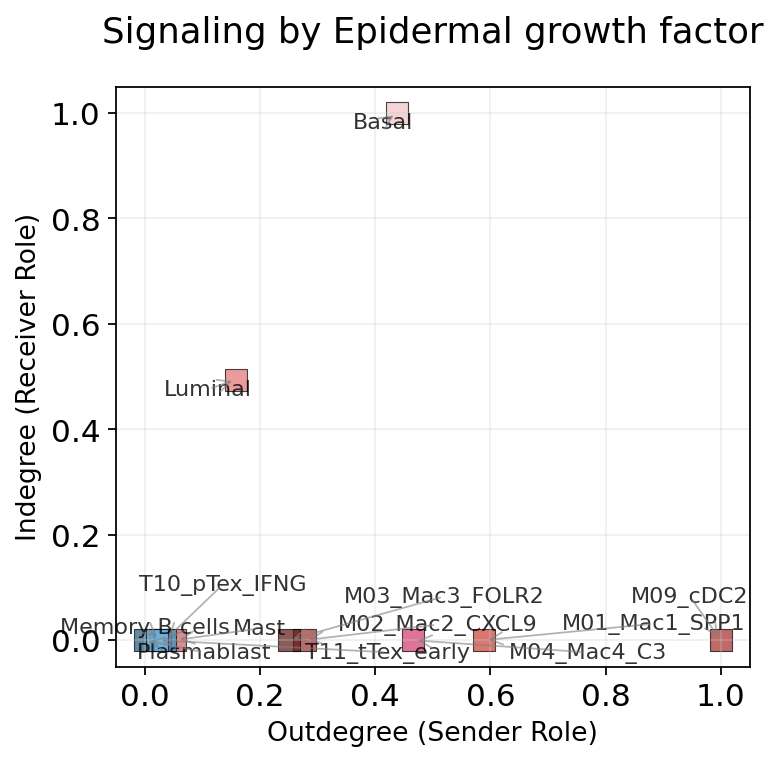

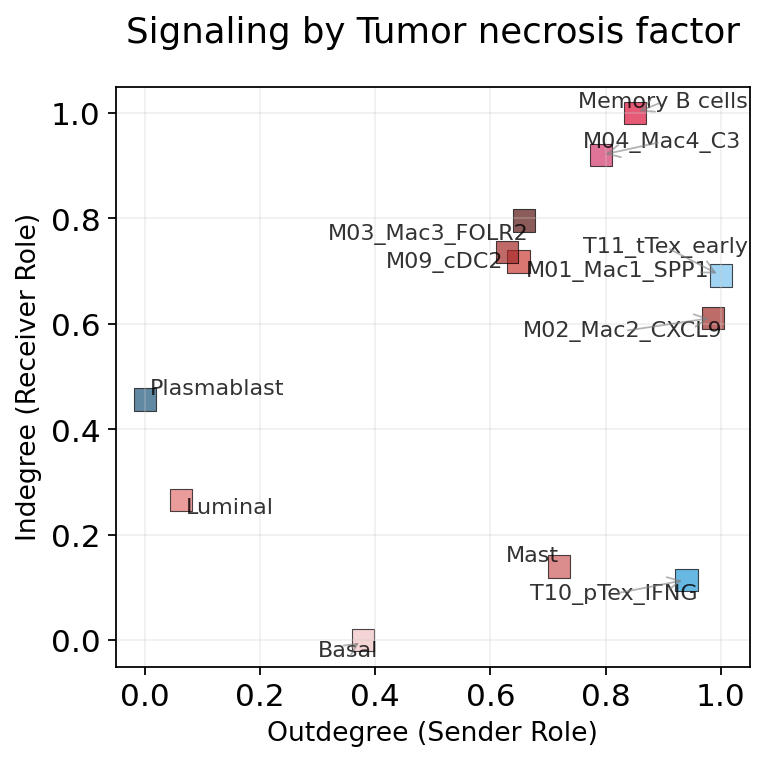

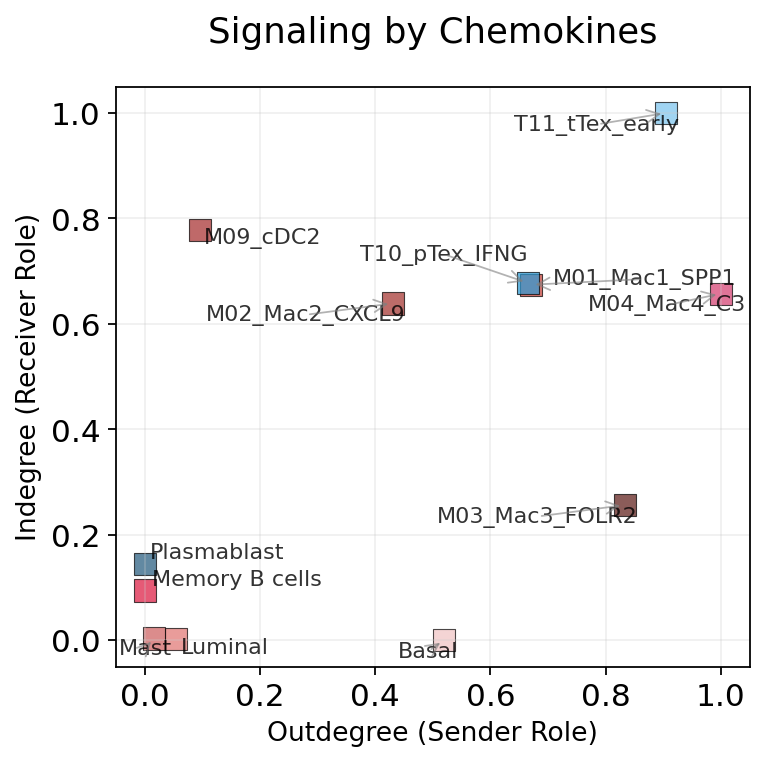

In [18]:
for pathway in pathways_show:
    fig3, ax3 = viz.netAnalysis_signalingRole_scatter(
    signaling= pathway,
    x_measure='outdegree',
    y_measure='indegree',
    title= pathway,
    figsize=(5,5),
    marker='s'
    )
    fig3.savefig(f"figures/cpdb/Before-{pathway.replace(' ', '_')}_degree.svg", format="svg")

#### WOTreat

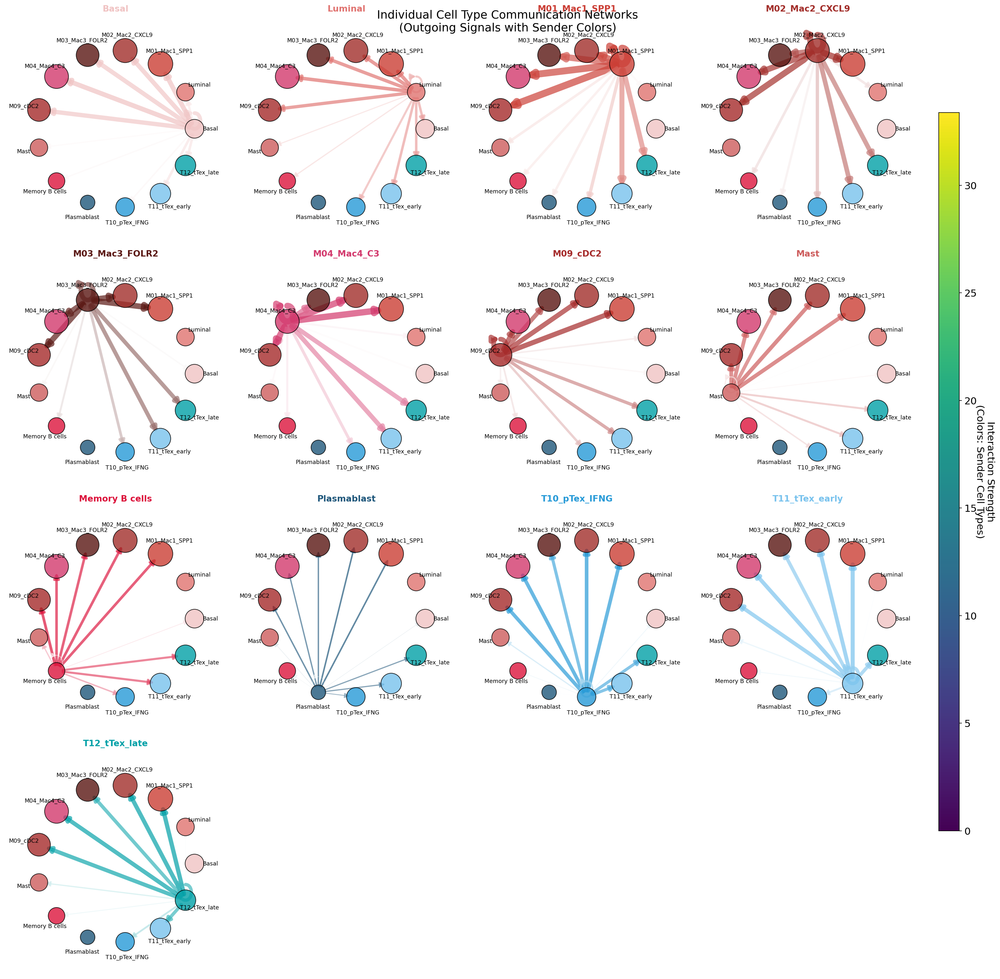

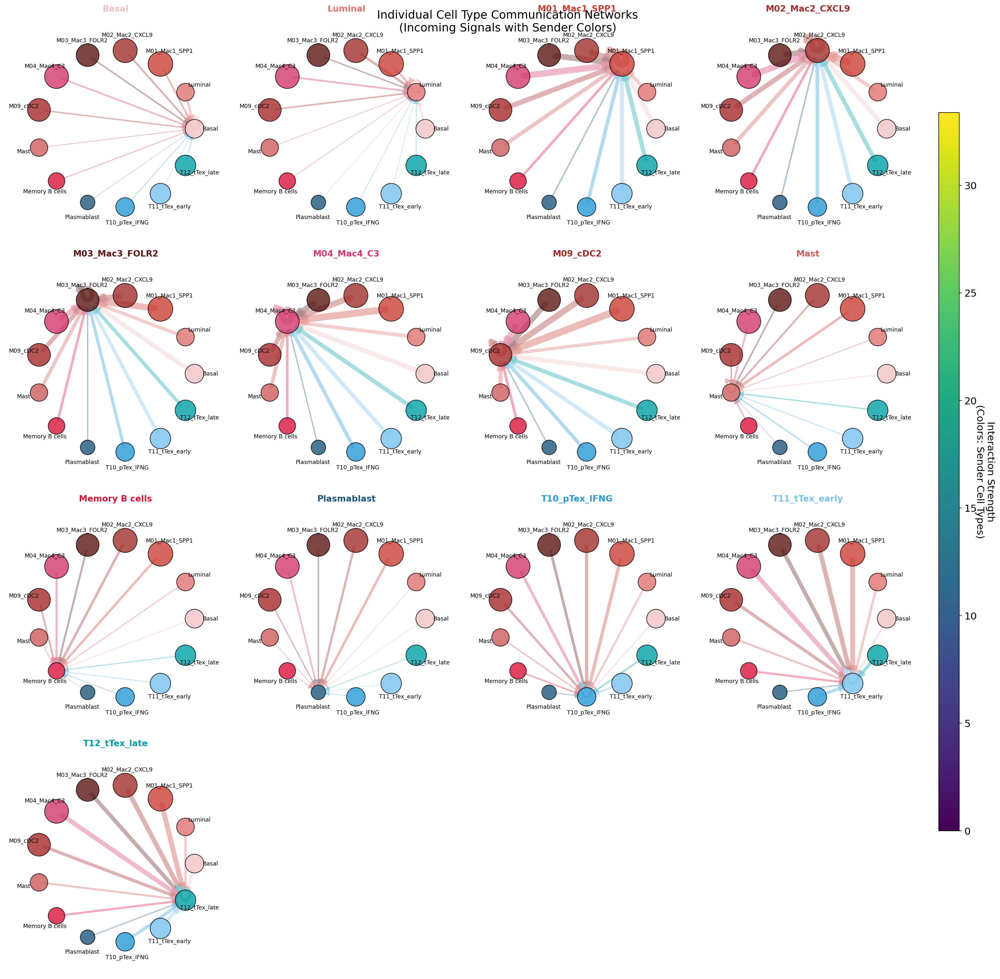

In [29]:
# 绘制接收信号
color_dict=dict(zip(
    adata_wotreat_filter.obs['cptype'].cat.categories,
    adata_wotreat_filter.uns['cptype_colors']
))
viz = ov.pl.CellChatViz(adata_cpdb_wotreat,palette=color_dict)
# 绘制所有细胞类型的向外信号（类似CellChat功能）
fig = viz.netVisual_individual_circle(
    pvalue_threshold=0.05,
    vertex_size_max=10,
    edge_width_max=10,  # 保持一致以便比较
    show_labels=True,
    cmap='Blues',
    figsize=(20, 20),
    ncols=4,
    #vertex_size_max=10,
)
fig.savefig("cpdb_ov/figures/WOTreat-outcome.svg", bbox_inches='tight')
fig = viz.netVisual_individual_circle_incoming(
    pvalue_threshold=0.05,
    cmap='Reds',
    figsize=(20, 20),
    ncols=4,
    vertex_size_max=10,
)
fig.savefig("cpdb_ov/figures/WOTreat-income.svg", bbox_inches='tight')

📊 Heatmap statistics:
   - Number of pathways: 4
   - Number of cell types: 13
   - Signal strength range: 0.009 - 0.125
📊 Heatmap statistics:
   - Number of pathways: 4
   - Number of cell types: 13
   - Signal strength range: 0.012 - 0.137


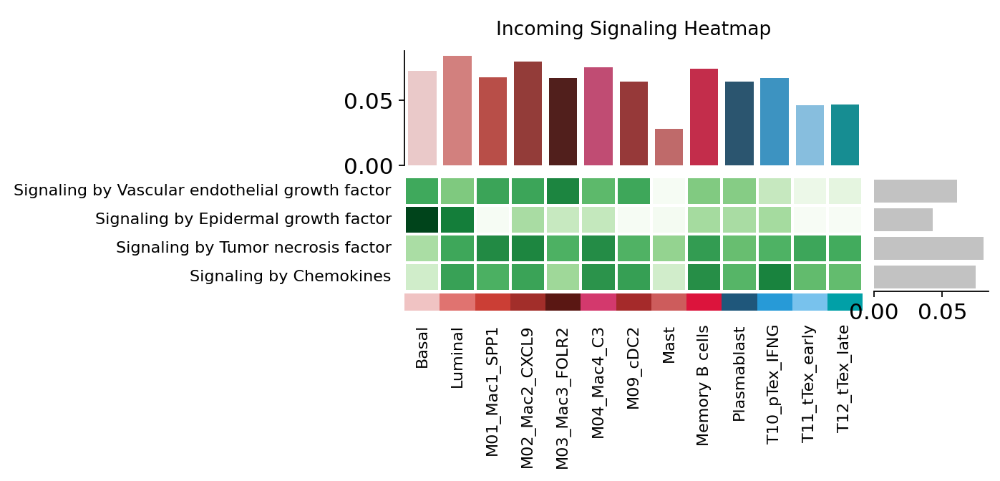

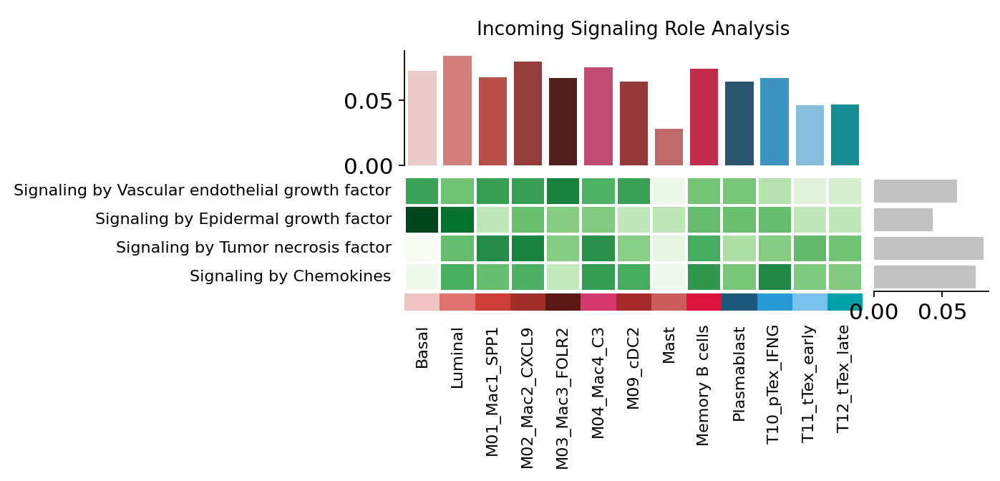

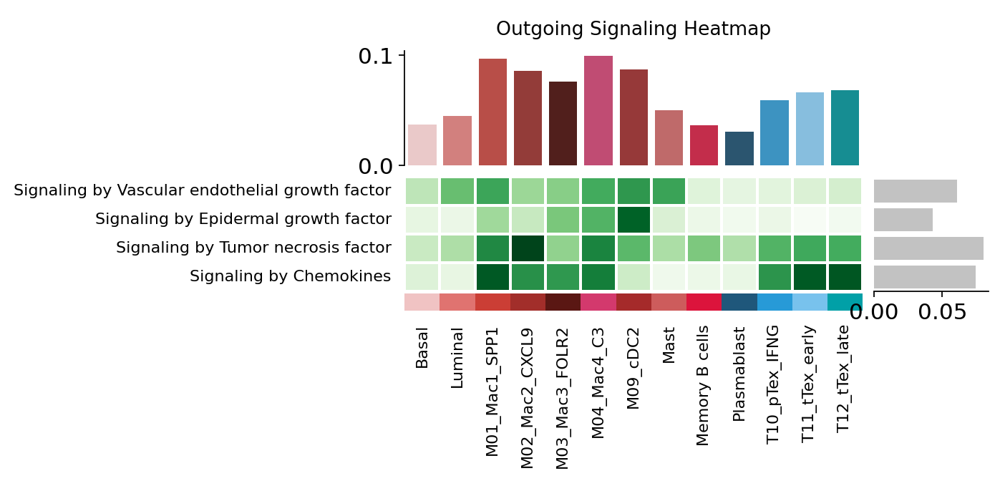

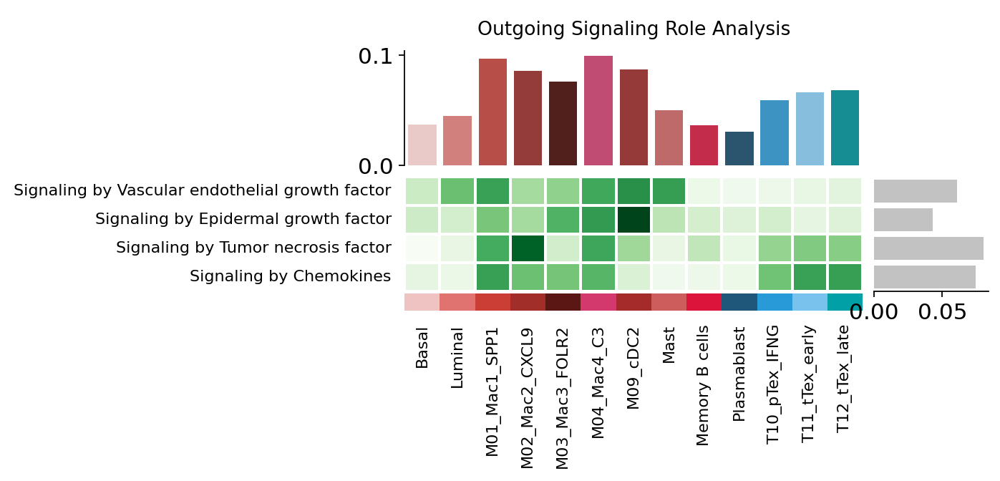

In [24]:
res=viz.netAnalysis_signalingRole_heatmap(pattern="incoming", 
                                          signaling=pathways_show, 
                                        row_scale=True, figsize=(4, 1), 
                                        min_threshold=0,
                                        cmap='Greens', show_totals=True,
                                        title=None, save=None)
plt.savefig("figures/cpdb/WOTreat-Signaling-income.svg", bbox_inches="tight")
res=viz.netAnalysis_signalingRole_heatmap(pattern="outgoing", 
                                          signaling=pathways_show, 
                                        row_scale=True, figsize=(4, 1), 
                                        min_threshold=0,
                                        cmap='Greens', show_totals=True,
                                        title=None, save=None)
plt.savefig("figures/cpdb/WOTreat-Signaling-outgoing.svg", bbox_inches="tight")

In [20]:
pathway_comm = viz.compute_pathway_communication(
  method='mean',           # 对通路内L-R对取平均
  min_lr_pairs=2,         # 通路至少包含2个L-R对
  min_expression=0.1      # 过滤低表达交互
)
# 方法2：基于通路强度判断显著通路
sig_pathways, summary = viz.get_significant_pathways_v2(
  pathway_comm,
  strength_threshold=0.5,    # 通路平均强度阈值
  pvalue_threshold=0.05,     # 个别L-R对的p-value阈值
  min_significant_pairs=1    # 至少1对细胞显著
)
sig_pathways

🔬 Calculating cell communication strength for 145 pathways...
   - Aggregation method: mean
   - Minimum expression threshold: 0.1
✅ Completed pathway communication strength calculation for 139 pathways
📊 Pathway significance analysis results:
   - Total pathways: 139
   - Significant pathways: 19
   - Strength threshold: 0.5
   - p-value threshold: 0.05

🏆 Top 10 pathways by total strength:
----------------------------------------------------------------------------------------------------
Pathway                        Total    Max     Mean    L-R  Active Sig  Rate   Status
----------------------------------------------------------------------------------------------------
Signaling by Amyloid-beta pr   128.85   2.36    0.76    6    169    60   0.36   ***
Signaling by HLA               103.31   1.13    0.62    16   166    88   0.53   ***
Signaling by Apolipoprotein    86.02    1.84    0.80    7    108    25   0.23   ***
Signaling by Chemokines        67.16    1.13    0.42    84   160

['Adhesion by Fibronectin',
 'Signaling by Selectin',
 'Signaling by Semaphorin',
 'Adhesion by Thrombospondin',
 'Adhesion by Osteopontin',
 'Signaling by Plasminogen Activator',
 'Signaling by Nectin',
 'Signaling by Cathepsin',
 'Signaling by Thrombospondin precursor',
 'Signaling by Amyloid-beta precursor protein',
 'Signaling by Annexin',
 'Signaling by Chemokines',
 'Signaling by Lipoxin/Leukotriene',
 'Signaling by Apolipoprotein',
 'Signaling by Histamine',
 'Signaling by Colony-Stimulating factor',
 'Signaling by Galectin',
 'Signaling by HLA',
 'Signaling by Interferon']

In [ ]:
# 2. 绘制特定通路的圆形图
pathways_show = ["Signaling by Transforming growth factor"]  # 或者从上面获取的列表中选择
fig, ax = viz.netVisual_aggregate(
    signaling=pathways_show, 
    layout="circle",
    figsize=(8, 8),
    vertex_size_max=10,
)

In [187]:
h = viz.netVisual_heatmap_marsilea(
    signaling=pathways_show[3],      # 指定信号通路
    color_heatmap="Reds",        # CellChat的color.heatmap参数
    add_dendrogram=True,
    #title="CXCL Signaling Heatmap"
)
h.render()   # 这通常返回的是 matplotlib.figure.Figure
import matplotlib.pyplot as plt
plt.savefig("figures/cpdb/WOTreat-CXCL16.svg", bbox_inches="tight")

In [188]:
#### 注意这里，需要使用到marsilea包，该包目前版本为0.5.1，如果使用0.5.5会报错，强制要求三个参数。omicverse只传入了size和color，0.5.5版本会强制要求edgecolor参数
pathways = [
    "Signaling by Vascular endothelial growth factor", # VEGFA
    "Signaling by Epidermal growth factor", # EGFR
    "Signaling by Tumor necrosis factor", # TNFSF10
    "Signaling by Chemokines" # CXCL16
    ]

enriched_lr = viz.extractEnrichedLR(pathways)
print(f"Find {len(enriched_lr)} sig L-R")

for pathway in pathways:
  contribution_df, fig, axes = viz.netAnalysis_contribution(pathway)
  print(f"{pathway} most important L-R pair: {contribution_df.iloc[0]['ligand_receptor']}")
  fig.savefig(f"figures/cpdb/WOTreat-{pathway.replace(' ', '_')}_contribution.svg", format="svg")


viz.netVisual_bubble_marsilea(sources_use=None, targets_use=None, 
                                 signaling=pathways, pvalue_threshold=1, 
                                 mean_threshold=0.1, top_interactions=20,
                                 show_pvalue=False, show_mean=False, show_count=True,
                                 add_violin=False, add_dendrogram=True,
                                 group_pathways=True, figsize=(2, 8),
                                 font_size=10,
                                 title=pathways_show[0], 
                                 remove_isolate=False
                                 )

✅ Found 51 enriched L-R pairs in pathway(s): Signaling by Vascular endothelial growth factor, Signaling by Epidermal growth factor, Signaling by Tumor necrosis factor, Signaling by Chemokines
Find 51 sig L-R
Signaling by Vascular endothelial growth factor most important L-R pair: VEGFA_NRP2
Signaling by Epidermal growth factor most important L-R pair: AREG_EGFR
Signaling by Tumor necrosis factor most important L-R pair: TNF_TNFRSF1B
Signaling by Chemokines most important L-R pair: CCL3_CCR1
⚠️  Warning: All p-values are identical. Adding slight jitter for better visualization.
⚠️  Warning: All p-values are identical after jittering. Using medium size.
📊 Visualization statistics:
   - Number of significant interactions: 20
   - Number of cell type pairs: 13
   - Signaling pathways: 1
   - Data scaling: None (raw expression values)
   - Color bars: sender


In [190]:
h = viz.netVisual_bubble_marsilea(sources_use=['T10_pTex_IFNG', 'T11_tTex_early', 'T12_tTex_late'], 
                                 signaling= pathways_show, pvalue_threshold=0.01, 
                              #show_mean=False,
                                 mean_threshold=0.1, top_interactions=200,cmap='RdBu_r',
                                 show_pvalue=False, show_mean=False, show_count=True,
                                 #add_violin=True, 
                                 add_dendrogram=False,font_size=10,
                                 group_pathways=True, figsize=(14, 2),transpose=True,
                                 title="Cell-Cell Communication Analysis", 
                                 remove_isolate=False)
plt.savefig("figures/cpdb/WOTreat-Cell-Cell Communication Analysis.svg", bbox_inches="tight")

📊 Visualization statistics:
   - Number of significant interactions: 200
   - Number of cell type pairs: 4
   - Signaling pathways: 35
   - Data scaling: None (raw expression values)
   - Color bars: sender


📊 Visualization statistics:
   - Number of significant interactions: 13
   - Number of cell type pairs: 2
   - Ligand-receptor pairs: 12
   - Data scaling: None (raw expression values)
   - Color bars: sender


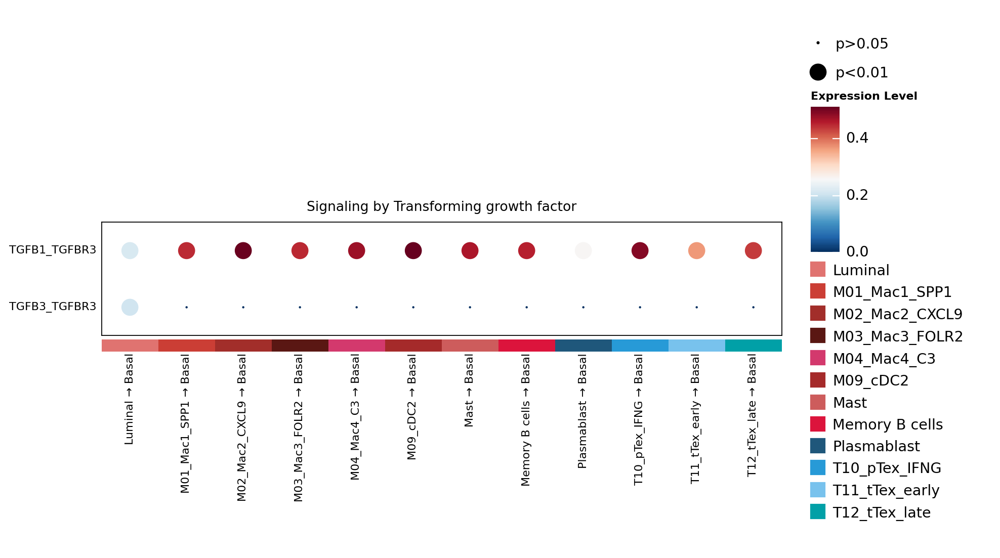

In [67]:
viz.netVisual_bubble_marsilea(sources_use=None,
                                 signaling=['Signaling by Transforming growth factor'], pvalue_threshold=0.01, 
                              #show_mean=False,
                                 mean_threshold=0.1, top_interactions=200,cmap='RdBu_r',
                                 show_pvalue=False, show_mean=False, show_count=True,
                                 #add_violin=True, 
                                 add_dendrogram=False,font_size=10,
                                 group_pathways=False, figsize=(14, 2),transpose=True,
                                 title="Signaling by Transforming growth factor", 
                                 remove_isolate=False)

✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: All pathways
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized to 0-1 range (Importance values)
📊 信号角色分析结果（Marsilea可视化，Importance值 0-1）:
   - Dominant Sender: M01_Mac1_SPP1 (Importance: 1.000)
   - Dominant Receiver: M01_Mac1_SPP1 (Importance: 1.000)
   - Mediator: Plasmablast (Importance: 1.000)
   - Influencer: M01_Mac1_SPP1 (Importance: 1.000)


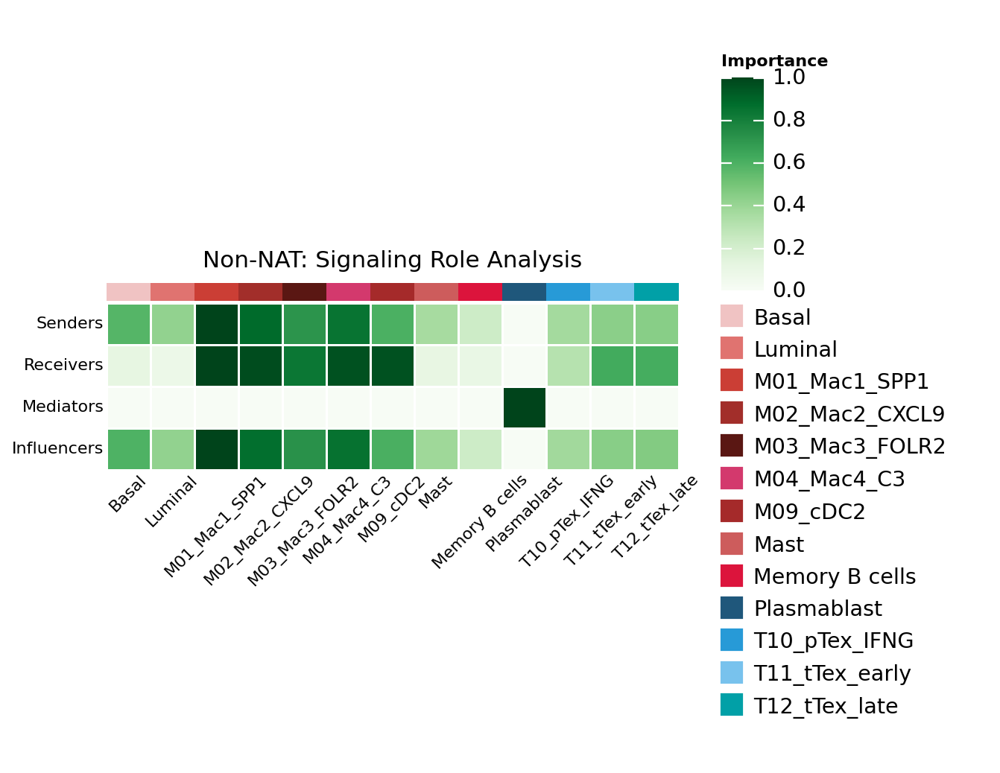

In [30]:
# 信号角色分析
centrality_scores = viz.netAnalysis_computeCentrality()
h = viz.netAnalysis_signalingRole_network_marsilea(signaling=None, measures=None,
                                                  color_heatmap="Greens", 
                                                  width=8, height=2, font_size=10,
                                                  title="Non-NAT: Signaling Role Analysis",
                                                  add_dendrogram=False, add_cell_colors=True,
                                                  add_importance_bars=False, show_values=False,
                                                  save=None)
plt.savefig("cpdb_ov/figures/WOTreat-Signaling-Role.svg", bbox_inches="tight")

✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: ['Signaling by Vascular endothelial growth factor']
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized to 0-1 range (Importance values)
✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: ['Signaling by Epidermal growth factor']
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized to 0-1 range (Importance values)
✅ Network centrality calculation completed (CellChat-style Importance values)
   - Signaling pathways used: ['Signaling by Tumor necrosis factor']
   - Weight mode: Weighted
   - Calculated metrics: outdegree, indegree, flow_betweenness, information, overall
   - All centrality scores normalized to 0-1 range (Importance val

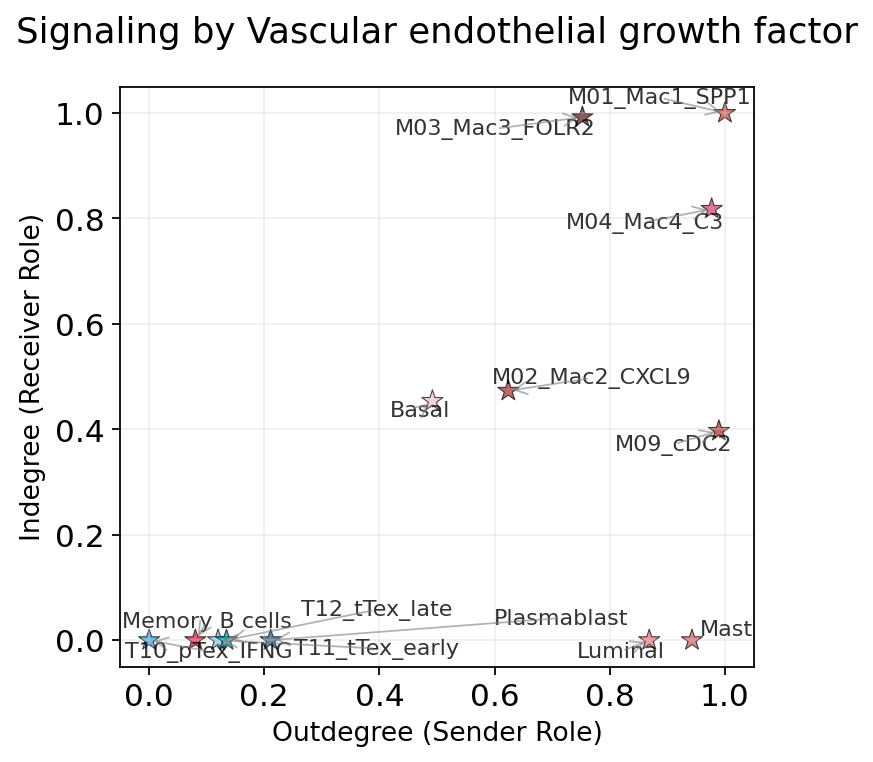

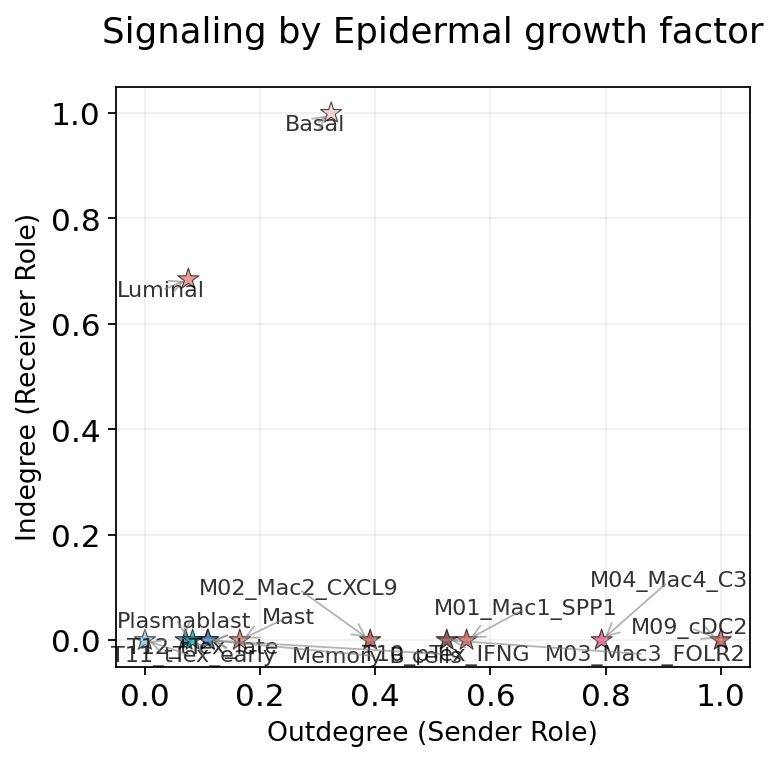

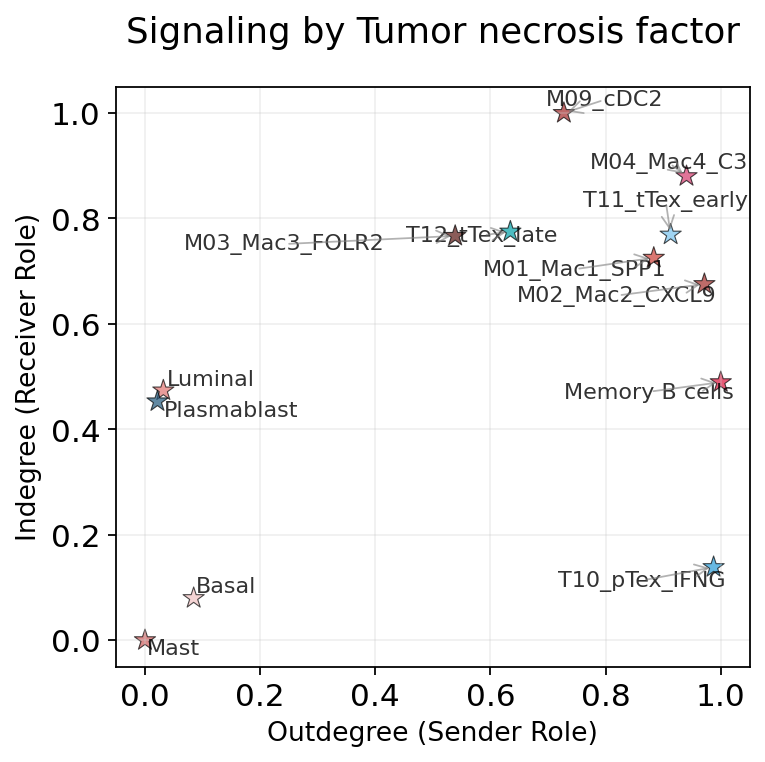

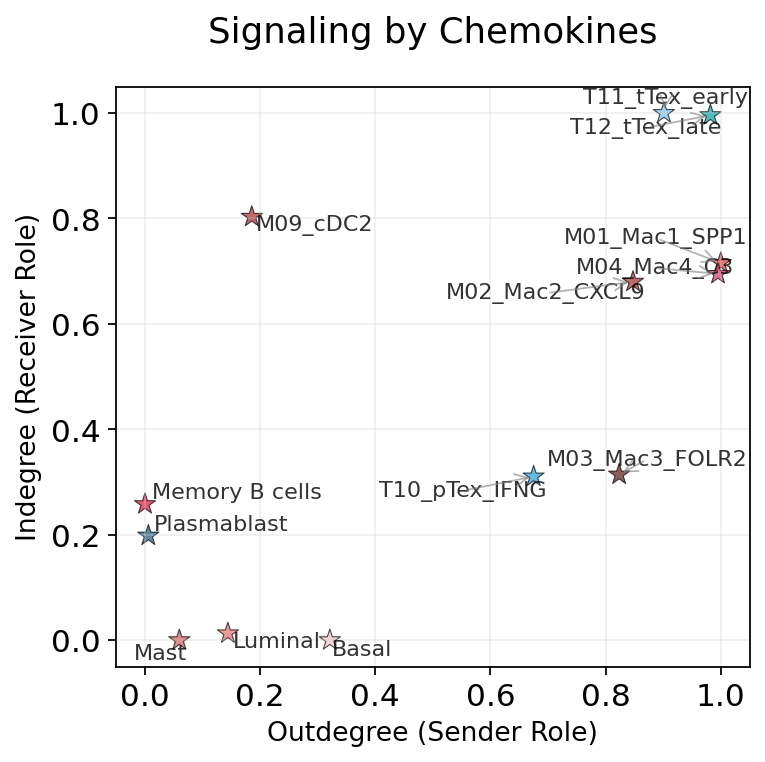

In [21]:
for pathway in pathways_show:
    fig3, ax3 = viz.netAnalysis_signalingRole_scatter(
    signaling= pathway,
    x_measure='outdegree',
    y_measure='indegree',
    title= pathway,
    figsize=(5,5),
    marker = '*'
    )
    fig3.savefig(f"figures/cpdb/WOTreat-{pathway.replace(' ', '_')}_degree.svg", format="svg")